# Import Library

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns

import os
from os import listdir
import os.path as op
import glob
import shutil

from glob import glob

import cv2

import random

In [ ]:
!pip install torchvision

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
import torch
import torchvision

from torchvision import datasets, models
import torchvision.transforms as T
from torch.utils.data import DataLoader

from torch import nn, optim
import torch.nn.functional as F

from tqdm.auto import tqdm

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split, KFold

In [ ]:
!pip install torch-summary==1.4.4
from torchsummary import summary

In [ ]:
!pip install torchview
from torchview import draw_graph

In [ ]:
!pip install -q -U graphviz
import graphviz

In [ ]:
graphviz.set_jupyter_format('png')

'svg'

In [ ]:
from IPython.display import Image, display
import copy

# Dowload Dataset and Relocate

## Dowload

In [ ]:
!git clone https://github.com/seensiravit/Parkinson-SpiralDrawing.git

Cloning into 'Parkinson-SpiralDrawing'...
remote: Enumerating objects: 476, done.
remote: Counting objects: 100% (476/476), done.
remote: Compressing objects: 100% (472/472), done.
remote: Total 476 (delta 3), reused 468 (delta 1), pack-reused 0
Receiving objects: 100% (476/476), 16.88 MiB | 19.67 MiB/s, done.
Resolving deltas: 100% (3/3), done.


## Get input path

In [ ]:
input_root = 'Parkinson-SpiralDrawing/Dataset/Data'
listdir(input_root)

['train', 'test']

In [ ]:
input_train_root, input_test_root = glob(f"{input_root}/*")

if 'test' in input_train_root : input_train_root, input_test_root = input_test_root, input_train_root

print(f"input_root: {input_root}")
print(f"input_train_root: {input_train_root}")
print(f"input_test_root: {input_test_root}")

input_root: Parkinson-SpiralDrawing/Dataset/Data
input_train_root: Parkinson-SpiralDrawing/Dataset/Data/train
input_test_root: Parkinson-SpiralDrawing/Dataset/Data/test


### train

In [ ]:
input_train_healthy_root, input_train_patient_root = glob(f"{input_train_root}/*")

if 'Patient' in input_train_healthy_root : input_train_healthy_root, input_train_patient_root = input_train_patient_root, input_train_healthy_root

print(f"input_train_healthy_root: {input_train_healthy_root}")
print(f"input_train_patient_root: {input_train_patient_root}")

input_train_healthy_root: Parkinson-SpiralDrawing/Dataset/Data/train/Healthy
input_train_patient_root: Parkinson-SpiralDrawing/Dataset/Data/train/Patient


In [ ]:
input_train_healthy_path = glob(f"{input_train_healthy_root}/*.jpg")
input_train_patient_path = glob(f"{input_train_patient_root}/*.jpg")

print(f"number of input_train_healthy: {len(input_train_healthy_path)}")
print(f"number of input_train_patient: {len(input_train_patient_path)}")

number of input_train_healthy: 180
number of input_train_patient: 165


### test

In [ ]:
input_test_healthy_root, input_test_patient_root = glob(f"{input_test_root}/*")

if 'Patient' in input_test_healthy_root : input_test_healthy_root, input_test_patient_root = input_test_patient_root, input_test_healthy_root

print(f"input_test_healthy_root: {input_test_healthy_root}")
print(f"input_test_patient_root: {input_test_patient_root}")

input_test_healthy_root: Parkinson-SpiralDrawing/Dataset/Data/test/Healthy
input_test_patient_root: Parkinson-SpiralDrawing/Dataset/Data/test/Patient


In [ ]:
input_test_healthy_path = glob(f"{input_test_healthy_root}/*.jpg")
input_test_patient_path = glob(f"{input_test_patient_root}/*.jpg")

print(f"number of input_test_healthy: {len(input_test_healthy_path)}")
print(f"number of input_test_patient: {len(input_test_patient_path)}")

number of input_test_healthy: 10
number of input_test_patient: 10


## Relocate

In [ ]:
def relocate_path(root, input_healthy_path, input_patient_path) :
  if not op.exists(root) : os.mkdir(root)

  healthy_root = op.join(root, 'healthy')
  if not op.exists(healthy_root) : os.mkdir(healthy_root)

  patient_root = op.join(root, 'patient')
  if not op.exists(patient_root) : os.mkdir(patient_root)

  print(f"healthy_root: {healthy_root}")
  print(f"patient_root: {patient_root}")

  for path in input_healthy_path : shutil.copy(path, healthy_root)
  for path in input_patient_path : shutil.copy(path, patient_root)

  print(f"number of healthy: {len(glob(f'{healthy_root}/*.jpg'))}")
  print(f"number of patient: {len(glob(f'{patient_root}/*.jpg'))} ")

In [ ]:
data_root = 'Data'
if not op.exists(data_root) : os.mkdir(data_root)

In [ ]:
# train set
data_train_root = op.join(data_root, 'train')
relocate_path(data_train_root, input_train_healthy_path, input_train_patient_path)

healthy_root: Data/train/healthy
patient_root: Data/train/patient
number of healthy: 180
number of patient: 165 


In [ ]:
# test set
data_test_root = op.join(data_root, 'test')
relocate_path(data_test_root, input_test_healthy_path, input_test_patient_path)

healthy_root: Data/test/healthy
patient_root: Data/test/patient
number of healthy: 10
number of patient: 10 


## explore

In [ ]:
data_path = []

for path, subdirs, files in os.walk(data_root):
  print(path , subdirs , len(files))
  for filename in files:
      # print(os.path.join(path, filename))
      data_path.append(os.path.join(path, filename))

print(f"number of path: {len(data_path)}")

Data ['train', 'test'] 0
Data/train ['patient', 'healthy'] 0
Data/train/patient [] 165
Data/train/healthy [] 180
Data/test ['patient', 'healthy'] 0
Data/test/patient [] 10
Data/test/healthy [] 10
number of path: 365


In [ ]:
image_shape = [cv2.imread(path , 0).shape for path in data_path]
image_shape = np.array(image_shape)
print(f"unique shape: {len(np.unique(image_shape , axis=0))}")

unique shape: 120


In [ ]:
image_shape.shape

(365, 2)

In [ ]:
image_shape[::10] , image_shape.max(axis=0) , image_shape.min(axis=0)

(array([[ 256,  256],
        [ 696,  698],
        [ 256,  256],
        [1468, 1468],
        [ 256,  256],
        [ 256,  256],
        [ 676,  697],
        [ 256,  256],
        [ 664,  668],
        [ 675,  690],
        [ 256,  256],
        [ 664,  662],
        [ 256,  256],
        [ 658,  676],
        [ 704,  720],
        [1360, 1408],
        [ 672,  700],
        [ 688,  680],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 256,  256],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 350,  350],
        [ 676,  664],
        [ 350,  350],
        [ 256,  256],
        [ 256,  256],
        [ 680,  694],
        [ 350,  350]]),
 array([1476, 1516]),
 array([200, 200]))

In [ ]:
pd.DataFrame(image_shape).value_counts()

0    1  
350  350    119
256  256     99
683  675      4
666  688      4
658  676      3
           ... 
679  674      1
678  706      1
676  706      1
     696      1
688  672      1
Name: count, Length: 120, dtype: int64

In [ ]:
image_shape.sort(axis=0)
image_shape

array([[ 200,  200],
       [ 251,  253],
       [ 254,  253],
       [ 254,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,  256],
       [ 256,

In [ ]:
image_pixel = np.array([x*y for x,y in image_shape])
print(type(image_pixel))
print(image_pixel.shape)

print(f"unique pixel: {len(np.unique(image_pixel , axis=0))}")

<class 'numpy.ndarray'>
(365,)
unique pixel: 99


In [ ]:
image_pixel[::10] , image_pixel.max(axis=0) , image_pixel.min(axis=0)

(array([  40000,   65536,   65536,   65536,   65536,   65536,   65536,
          65536,   65536,   65536,   65536,  122500,  122500,  122500,
         122500,  122500,  122500,  122500,  122500,  122500,  122500,
         122500,  122500,  443492,  448864,  458304,  462375,  467152,
         471944,  478848,  483708,  495612,  511216,  541692, 1833216,
        1898848, 2050368]),
 2237616,
 40000)

In [ ]:
df_image_pix = pd.DataFrame({"image_pix" : image_pixel})
df_image_pix.loc[::5 , ['image_pix']]

,image_pix
0,40000
5,65536
10,65536
15,65536
20,65536
...,...
340,1833216
345,1871360
350,1898848
355,1954400


In [ ]:
df_image_pix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   image_pix  365 non-null    int64
dtypes: int64(1)
memory usage: 3.0 KB


In [ ]:
df_image_pix.describe().T

,count,mean,std,min,25%,50%,75%,max
image_pix,365.0,368233.575342,507844.590108,40000.0,65536.0,122500.0,469200.0,2237616.0


In [ ]:
df_image_pix.mode()

,image_pix
0,122500


Text(0.5, 1.0, 'image_pix')

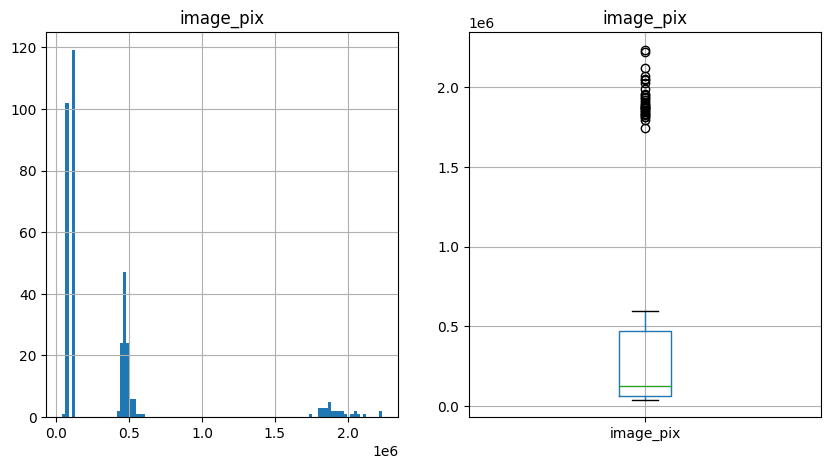

In [ ]:
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
df_image_pix['image_pix'].hist(bins=100)
plt.title('image_pix')

plt.subplot(1,2,2)
df_image_pix.boxplot(column=['image_pix'])
plt.title('image_pix')

<Axes: xlabel='image_pix', ylabel='count'>

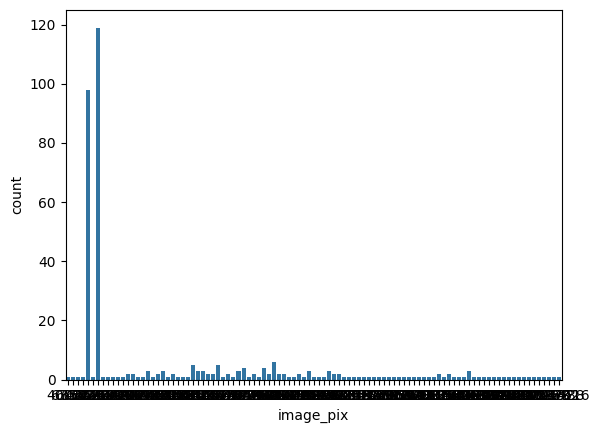

In [ ]:
sns.countplot(x=df_image_pix['image_pix'])

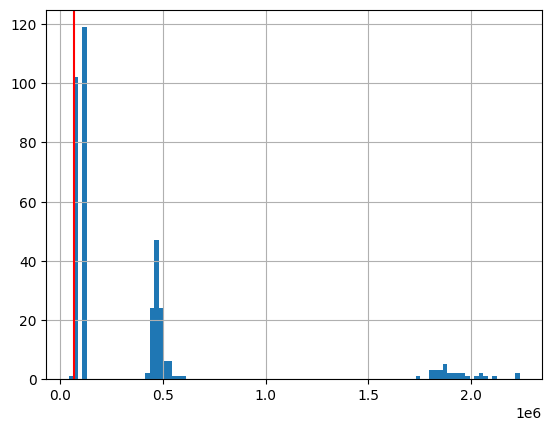

In [ ]:
df_image_pix['image_pix'].hist(bins=100)
plt.axvline(x=256*256, color='red')

<ipython-input-36-dc913a69b756>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_image_pix['image_pix'] , kde=True)


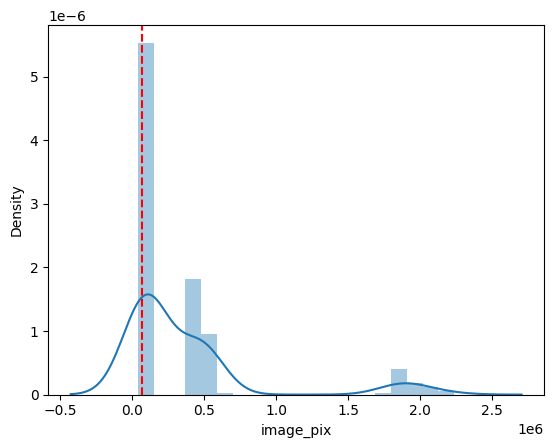

In [ ]:
sns.distplot(df_image_pix['image_pix'] , kde=True)
plt.axvline(256*256 , color='r' , linestyle='--')

In [ ]:
val_count = df_image_pix['image_pix'].value_counts()
val_count

image_pix
122500    119
65536      98
478848      6
465088      5
458304      5
         ... 
483016      1
472626      1
471252      1
467840      1
493504      1
Name: count, Length: 99, dtype: int64

# Transform and Data

## Transfrom

In [ ]:
transform = T.Compose([
    T.Resize((256,256)),
    T.Grayscale(3),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.485,0.485], std=[0.229,0.229,0.229])
])

In [ ]:
transform

Compose(
    Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
    Grayscale(num_output_channels=3)
    ToTensor()
    Normalize(mean=[0.485, 0.485, 0.485], std=[0.229, 0.229, 0.229])
)

## Data

In [ ]:
batch_size = 32

In [ ]:
data_root = 'Data'
data_train_root = op.join(data_root, 'train')
data_val_root = op.join(data_root, 'val')
data_test_root = op.join(data_root, 'test')

In [ ]:
train_data = datasets.ImageFolder(data_train_root, transform=transform)
test_data = datasets.ImageFolder(data_test_root, transform=transform)

In [ ]:
train_data, test_data

(Dataset ImageFolder
     Number of datapoints: 345
     Root location: Data/train
     StandardTransform
 Transform: Compose(
                Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
                Grayscale(num_output_channels=3)
                ToTensor()
                Normalize(mean=[0.485, 0.485, 0.485], std=[0.229, 0.229, 0.229])
            ),
 Dataset ImageFolder
     Number of datapoints: 20
     Root location: Data/test
     StandardTransform
 Transform: Compose(
                Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
                Grayscale(num_output_channels=3)
                ToTensor()
                Normalize(mean=[0.485, 0.485, 0.485], std=[0.229, 0.229, 0.229])
            ))

# K-fold

## Function

### Train and Evaluate

In [ ]:
def choose_model(candidate, best):
  if candidate['val_acc'] > best['val_acc'] :
    return True
  elif candidate['val_acc'] == best['val_acc'] :
    if candidate['train_acc'] > best['train_acc'] :
      return True
    elif candidate['train_acc'] == best['train_acc'] :
      if candidate['val_loss'] < best['val_loss'] :
        return True
      elif candidate['val_loss'] == best['val_loss'] :
        if candidate['train_loss'] < best['train_loss'] :
          return True

  return False

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs, patience, scheduler, model_path) :
  gpu = torch.cuda.is_available()
  print(gpu)

  if gpu : model.cuda()

  history = pd.DataFrame(columns=["train_loss" , "val_loss" , "train_acc" , "val_acc"])

  peak_stat = {
      'train_acc' : 0.00 ,
      'train_loss' : float('inf') ,
      'val_acc' : 0.00 ,
      'val_loss' : float('inf')
  }

  min_loss = float('inf')
  no_improve = 0

  for epoch in range(epochs):
    train_correct , val_correct = 0.00, 0.00
    train_loss, val_loss = 0.00, 0.00
    train_total, val_total = 0.00, 0.00

    # training section
    model.train()
    for images, labels in tqdm(train_loader):
      if gpu : images, labels = images.cuda(), labels.cuda()

      optimizer.zero_grad()           # set previous calculation to 0
      outputs = model(images)           # model's prediction
      loss = criterion(outputs, labels) # calculate loss
      loss.backward()                 # calculate gradient
      optimizer.step()                # update parameter

      _, predicteds = torch.max(outputs, 1)
      train_correct += (predicteds == labels).sum().item()

      train_loss += loss.item() * images.size(0)
      train_total += labels.size(0)

    train_acc = train_correct / train_total
    train_loss = train_loss / train_total

    # validation section
    model.eval()
    for images, labels in tqdm(val_loader):
      images, labels = images.to(device), labels.to(device)

      outputs = model(images)

      _, predicted = torch.max(outputs, 1)
      val_correct += (predicted == labels).sum().item()

      loss = criterion(outputs, labels)
      val_loss += loss.item() * images.size(0)
      val_total += labels.size(0)

    val_acc = val_correct / val_total
    val_loss = val_loss / val_total

    history.loc[len(history.index)] = [train_loss , val_loss , train_acc , val_acc]
    print(f"Epoch: {epoch+1}/{epochs} - Train Loss: {train_loss}, Val Loss: {val_loss}, Train Acc: {train_acc}, Val Acc: {val_acc}")

    candidate_stat = {
        'train_acc' : train_acc ,
        'train_loss' : train_loss ,
        'val_acc' : val_acc ,
        'val_loss' : val_loss
    }

    if choose_model(candidate_stat, peak_stat) :
      print("update")
      peak_stat = candidate_stat
      torch.save(model.state_dict(), model_path)

    scheduler.step()
    print(f"\nlr = {scheduler.get_last_lr()[0]}")

    if val_loss < min_loss :
      min_loss = val_loss
      no_improve = 0
    else :
      no_improve += 1

    if no_improve == patience :
      print("Early Stopping !!!")
      break

  model.load_state_dict(torch.load(model_path))

  return history

In [ ]:
def eval_model(model, loader, criterion):

  gpu = torch.cuda.is_available()
  print(gpu)

  if gpu : model.cuda()

  model.eval()

  val_correct, val_loss = 0,0
  total = 0

  for images, labels in tqdm(loader):
      if gpu : images, labels = images.cuda(), labels.cuda()

      outputs = model(images)

      _, predicted = torch.max(outputs, 1)
      val_correct += (predicted == labels).sum().item()

      loss = criterion(outputs, labels)
      val_loss += loss.item() * images.size(0)
      total += labels.size(0)

  return val_loss/total, val_correct/total

### Kfold

In [ ]:
def kfold_process(model, pretrained_checkpoint_path, criterion, optimizer, epochs, patience, scheduler, model_names) :
  histories = []
  summaries = pd.DataFrame(columns=["train_loss" , "val_loss" , "train_acc" , "val_acc"])

  if not op.exists(f"Checkpoints/kfold/{model_names}") : os.mkdir(f"Checkpoints/kfold/{model_names}")

  for fold, (train_idx, val_idx) in enumerate(kfold.split(train_data)):
    print(f"\n\nFold {fold + 1}")
    print("-------")

    train_loader = DataLoader(
        dataset=train_data,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(train_idx),
    )

    val_loader = DataLoader(
        dataset=train_data,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(val_idx),
    )

    checkpoints = torch.load(pretrained_checkpoint_path)
    model.load_state_dict(checkpoints['model_state_dict'])
    optimizer.load_state_dict(checkpoints['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoints['scheduler_state_dict'])

    history = train_model(model, train_loader, val_loader, criterion, optimizer, epochs, patience, scheduler, f"Checkpoints/kfold/{model_names}/{model_names}_{fold+1}.pth")
    histories.append(history)

    train_loss, train_acc = eval_model(model, train_loader, criterion)
    val_loss, val_acc = eval_model(model, val_loader, criterion)

    summaries.loc[fold] = [train_loss , val_loss , train_acc , val_acc]

  print(f"\nmean acc = {summaries['val_acc'].mean()}")

  return histories, summaries

In [ ]:
def plot_kfold_history(histories) :
  plt.figure(figsize=(10,15))
  plt.subplots_adjust(hspace=1)

  for i, history in enumerate(histories) :
    plt.subplot(5,1,i+1)

    plt.plot(history['train_loss'], 'b', label='train_loss')
    plt.plot(history['val_loss'], '--b', label='val_loss')

    plt.plot(history['train_acc'], 'r', label='train_acc')
    plt.plot(history['val_acc'], '--r', label='val_acc')

    plt.grid(True)
    plt.legend(loc = 'upper right')

    plt.title(f"Fold {i+1}")

## set parameter

In [ ]:
n_split = 5
seed = 0

kfold = KFold(n_splits=n_split, shuffle=True, random_state=seed)

In [ ]:
num_classes = 2
lr = 0.001
momentum = 0.9
epochs = 30
batch_size = 32

criterion = nn.CrossEntropyLoss()

patience = 6

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## Process

In [ ]:
checkpoints_root = 'Checkpoints'
if not op.exists(checkpoints_root) : os.mkdir(checkpoints_root)

In [ ]:
checkpoints_pretrained_root = op.join(checkpoints_root, 'pretrained')
if not op.exists(checkpoints_pretrained_root) : os.mkdir(checkpoints_pretrained_root)

In [ ]:
history_root = 'history'
if not op.exists(history_root) : os.mkdir(history_root)

In [ ]:
history_kfold_root = op.join(history_root, 'kfold')
if not op.exists(history_kfold_root) : os.mkdir(history_kfold_root)

In [ ]:
!mkdir -p Checkpoints/kfold/

### ResNet18

In [ ]:
model_resnet18 = models.resnet18(weights = models.ResNet18_Weights.IMAGENET1K_V1)
model_resnet18.fc = nn.Linear(model_resnet18.fc.in_features, num_classes)

optimizer_resnet18 = optim.SGD(model_resnet18.parameters(), lr=lr, momentum=momentum)
scheduler_resnet18 = optim.lr_scheduler.MultiStepLR(optimizer_resnet18, milestones=[10-1, 20-1], gamma=0.1)

checkpoint_pretrained_resnet18 = {
    'model_state_dict' : model_resnet18.state_dict(),
    'optimizer_state_dict' : optimizer_resnet18.state_dict(),
    'scheduler_state_dict' : scheduler_resnet18.state_dict()
}

torch.save(checkpoint_pretrained_resnet18, op.join(checkpoints_pretrained_root, 'resnet18.pth'))

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 160MB/s]


In [ ]:
histories_resnet18, summaries_resnet18 = kfold_process(model_resnet18, 'Checkpoints/pretrained/resnet18.pth', criterion, optimizer_resnet18, epochs, patience, scheduler_resnet18, 'resnet18')



Fold 1
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.7885416849799778, Val Loss: 0.5279218040514684, Train Acc: 0.5615942028985508, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4044263047584589, Val Loss: 0.4706772552884143, Train Acc: 0.8152173913043478, Val Acc: 0.7536231884057971

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2528483915156212, Val Loss: 0.2925852861093438, Train Acc: 0.9094202898550725, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.17447226354177447, Val Loss: 0.28901732529419055, Train Acc: 0.9601449275362319, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.14566935944384424, Val Loss: 0.24014061667780945, Train Acc: 0.9420289855072463, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.10415670167708742, Val Loss: 0.2512545438780301, Train Acc: 0.967391304347826, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08249190881632376, Val Loss: 0.22747732536948245, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.06659920842967172, Val Loss: 0.2339782144712365, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.05224415384556936, Val Loss: 0.25146858847659564, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.045662036840466484, Val Loss: 0.23518392605626065, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.031529737069554954, Val Loss: 0.22231508165165997, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.03338179456582968, Val Loss: 0.2267339011465294, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.028262129701350048, Val Loss: 0.22059210848765096, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.03702485593764678, Val Loss: 0.21835898186849512, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.05168591774460198, Val Loss: 0.2173962768005288, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.029890606719730557, Val Loss: 0.22318390980902789, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.02971124303513679, Val Loss: 0.2313690842061803, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.03590358637165332, Val Loss: 0.21879719068174777, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.03176265258503997, Val Loss: 0.2178511282672053, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.03714213660661725, Val Loss: 0.221633348317034, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.026918469347815582, Val Loss: 0.22339211600036293, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 2
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.7779121986333875, Val Loss: 0.5598630758299343, Train Acc: 0.5978260869565217, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.38356048862139386, Val Loss: 0.48625690025695856, Train Acc: 0.8297101449275363, Val Acc: 0.7391304347826086

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2850323954354162, Val Loss: 0.36147745450337726, Train Acc: 0.8768115942028986, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.19682700737662936, Val Loss: 0.3548079548754554, Train Acc: 0.9384057971014492, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.15943088598441388, Val Loss: 0.3198490721592005, Train Acc: 0.9528985507246377, Val Acc: 0.8840579710144928

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.11106673120588496, Val Loss: 0.29126930010059604, Train Acc: 0.9746376811594203, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08547150430040083, Val Loss: 0.2891075808716857, Train Acc: 0.9891304347826086, Val Acc: 0.8985507246376812

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.06040764006151669, Val Loss: 0.25868188471033954, Train Acc: 0.9891304347826086, Val Acc: 0.927536231884058

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.055952735893104386, Val Loss: 0.26172606906165247, Train Acc: 0.9927536231884058, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.04103432034236797, Val Loss: 0.25874180727354856, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.031959071161522384, Val Loss: 0.2512496791887974, Train Acc: 1.0, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.028579820703337158, Val Loss: 0.25187121007753455, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.025875550438312515, Val Loss: 0.24990650622741037, Train Acc: 1.0, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.030130490390718846, Val Loss: 0.2523291873597149, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.031377944015506386, Val Loss: 0.2544438621920088, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.03214504116255304, Val Loss: 0.25335107230837794, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.03165137740796891, Val Loss: 0.255285123984019, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.0338877072368843, Val Loss: 0.2549206648507844, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.026116184512342232, Val Loss: 0.2534069801154344, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 3
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.8311060476994169, Val Loss: 0.5461344610953677, Train Acc: 0.5217391304347826, Val Acc: 0.7681159420289855
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.37885211213775305, Val Loss: 0.46339569316394086, Train Acc: 0.8659420289855072, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2464285706696303, Val Loss: 0.3719043839668882, Train Acc: 0.9094202898550725, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.25015664338201715, Val Loss: 0.29914216195111687, Train Acc: 0.9166666666666666, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.13500281563703564, Val Loss: 0.2486024924378464, Train Acc: 0.9492753623188406, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.09446817690479582, Val Loss: 0.27860922603935434, Train Acc: 0.9782608695652174, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.07603024075860562, Val Loss: 0.2743062272775864, Train Acc: 0.9818840579710145, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.041862001453620803, Val Loss: 0.23169387490961, Train Acc: 1.0, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.0675779930923296, Val Loss: 0.2885259813156681, Train Acc: 0.9891304347826086, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.03596085083225499, Val Loss: 0.26452581692433014, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.029184573640426, Val Loss: 0.25755382599174115, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.02685510691093362, Val Loss: 0.2559762277464936, Train Acc: 1.0, Val Acc: 0.8840579710144928

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.02865419320870137, Val Loss: 0.2535422332044961, Train Acc: 1.0, Val Acc: 0.8840579710144928

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.0324003026969191, Val Loss: 0.24756708125705304, Train Acc: 1.0, Val Acc: 0.8840579710144928

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 4
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.7824747337811235, Val Loss: 0.5757119845652926, Train Acc: 0.5760869565217391, Val Acc: 0.7246376811594203
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.43803099607643875, Val Loss: 0.5322857015374778, Train Acc: 0.8007246376811594, Val Acc: 0.7391304347826086
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.25280617501424707, Val Loss: 0.42577733812124835, Train Acc: 0.894927536231884, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.22934232598197632, Val Loss: 0.3538497898025789, Train Acc: 0.9057971014492754, Val Acc: 0.8405797101449275
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.11626400895740675, Val Loss: 0.31745346128076746, Train Acc: 0.9637681159420289, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.10008440760598666, Val Loss: 0.27352762740591297, Train Acc: 0.9782608695652174, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.06612736569798511, Val Loss: 0.2575344883877298, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.0512476316180782, Val Loss: 0.2557327721429908, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.03753585514167081, Val Loss: 0.24148093358330106, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.045357787549711655, Val Loss: 0.238760308942933, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.029590768388647964, Val Loss: 0.23721235958130463, Train Acc: 1.0, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.03763327483033788, Val Loss: 0.23611098517110382, Train Acc: 1.0, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.04468402088336323, Val Loss: 0.23202487259455348, Train Acc: 1.0, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.03383277880324834, Val Loss: 0.23198414561541184, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.026061156575662502, Val Loss: 0.23100545397703198, Train Acc: 1.0, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.027753265439600185, Val Loss: 0.23018985230853592, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.040749790551869766, Val Loss: 0.23697859059641327, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.037823708485002105, Val Loss: 0.23724407972632974, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.028371979765917942, Val Loss: 0.2350334609332292, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.0342642299938893, Val Loss: 0.23038873486760733, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.02526936577498049, Val Loss: 0.228789743737898, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.038263611603474273, Val Loss: 0.22988654694695404, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.03554112256329129, Val Loss: 0.23055120179618616, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.03274658017292403, Val Loss: 0.23167181187781735, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.03352241185696229, Val Loss: 0.23222613701785821, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 26/30 - Train Loss: 0.03305701349956402, Val Loss: 0.2325656349244325, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 27/30 - Train Loss: 0.03704369154529295, Val Loss: 0.23072317458581235, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 5
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.7816844971283622, Val Loss: 0.5164955655733744, Train Acc: 0.5579710144927537, Val Acc: 0.7246376811594203
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.449438850948776, Val Loss: 0.33587506327076233, Train Acc: 0.7681159420289855, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2897634022477744, Val Loss: 0.25692169346671173, Train Acc: 0.9021739130434783, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.20530420541763306, Val Loss: 0.32292497935502423, Train Acc: 0.9239130434782609, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.19445902109146118, Val Loss: 0.19450859617495883, Train Acc: 0.9311594202898551, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.10031825336425201, Val Loss: 0.16951022631880167, Train Acc: 0.9818840579710145, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08939410929662595, Val Loss: 0.10973673043907553, Train Acc: 0.9927536231884058, Val Acc: 0.9710144927536232
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.050167417288690376, Val Loss: 0.11946837971175926, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.052138066783115486, Val Loss: 0.12246005863383197, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.06173656735083331, Val Loss: 0.08875459269283043, Train Acc: 0.9963768115942029, Val Acc: 0.9855072463768116
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.030363837284022484, Val Loss: 0.08005832508206367, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.030003809464582497, Val Loss: 0.07814711062372595, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.025171634106748345, Val Loss: 0.07711634083070616, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.03387133976903515, Val Loss: 0.07621999020161836, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.03623864259840785, Val Loss: 0.07489442217933096, Train Acc: 0.9927536231884058, Val Acc: 0.9855072463768116

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.04020433279051297, Val Loss: 0.07427530920645897, Train Acc: 0.9963768115942029, Val Acc: 0.9855072463768116

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.02557828239556672, Val Loss: 0.074211610292179, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.039050768898881, Val Loss: 0.07797463740343633, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.03864909130809964, Val Loss: 0.07292465876409973, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.03222019954220108, Val Loss: 0.07280300422639087, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.029341817199104073, Val Loss: 0.07102978326704192, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.02992362118717553, Val Loss: 0.07322193358255469, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.02780360409962958, Val Loss: 0.07382966302659201, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.03182383224476075, Val Loss: 0.07490333373509887, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.036074733280617256, Val Loss: 0.07077519811581874, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 26/30 - Train Loss: 0.04148486720910971, Val Loss: 0.0707748424315798, Train Acc: 1.0, Val Acc: 0.9855072463768116
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 27/30 - Train Loss: 0.023378926612760708, Val Loss: 0.07226251033337219, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 28/30 - Train Loss: 0.02905825710437004, Val Loss: 0.07144346973602322, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 29/30 - Train Loss: 0.026140392042588497, Val Loss: 0.07279753814572873, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 30/30 - Train Loss: 0.026417367106330567, Val Loss: 0.07141209080599356, Train Acc: 1.0, Val Acc: 0.9855072463768116

lr = 1e-05
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]


mean acc = 0.9391304347826086


In [ ]:
summaries_resnet18

,train_loss,val_loss,train_acc,val_acc
0,0.067942,0.251242,0.992754,0.927536
1,0.020635,0.249908,1.000000,0.942029
2,0.033543,0.231695,1.000000,0.898551
3,0.018990,0.231006,1.000000,0.942029
4,0.016453,0.070768,1.000000,0.985507


In [ ]:
summaries_resnet18.describe().T

,count,mean,std,min,25%,50%,75%,max
train_loss,5.0,0.031512,0.021408,0.016453,0.018990,0.020635,0.033543,0.067942
val_loss,5.0,0.206924,0.076720,0.070768,0.231006,0.231695,0.249908,0.251242
train_acc,5.0,0.998551,0.003241,0.992754,1.000000,1.000000,1.000000,1.000000
val_acc,5.0,0.939130,0.031420,0.898551,0.927536,0.942029,0.942029,0.985507


In [ ]:
summaries_resnet18.loc['mean'] = summaries_resnet18.mean()
summaries_resnet18

,train_loss,val_loss,train_acc,val_acc
0,0.067942,0.251242,0.992754,0.927536
1,0.020635,0.249908,1.000000,0.942029
2,0.033543,0.231695,1.000000,0.898551
3,0.018990,0.231006,1.000000,0.942029
4,0.016453,0.070768,1.000000,0.985507
mean,0.031512,0.206924,0.998551,0.939130


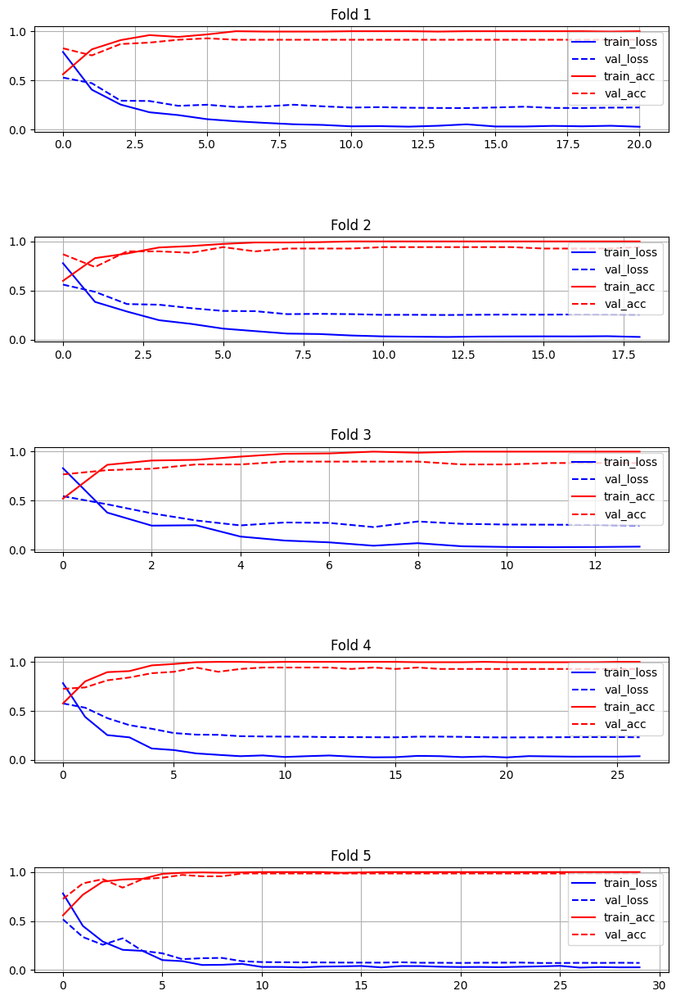

In [ ]:
plot_kfold_history(histories_resnet18)

In [ ]:
!mkdir -p history/kfold/resnet18

for i, history in enumerate(histories_resnet18) :
  history.to_csv(op.join(history_kfold_root, 'resnet18', f'resnet18_{i+1}.csv'))

### ResNet34

In [ ]:
model_resnet34 = models.resnet34(weights = models.ResNet34_Weights.IMAGENET1K_V1)
model_resnet34.fc = nn.Linear(model_resnet34.fc.in_features, num_classes)

optimizer_resnet34 = optim.SGD(model_resnet34.parameters(), lr=lr, momentum=momentum)
scheduler_resnet34 = optim.lr_scheduler.MultiStepLR(optimizer_resnet34, milestones=[10-1, 20-1], gamma=0.1)

checkpoint_pretrained_resnet34 = {
    'model_state_dict' : model_resnet34.state_dict(),
    'optimizer_state_dict' : optimizer_resnet34.state_dict(),
    'scheduler_state_dict' : scheduler_resnet34.state_dict()
}

torch.save(checkpoint_pretrained_resnet34, op.join(checkpoints_pretrained_root, 'resnet34.pth'))

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 170MB/s]


In [ ]:
histories_resnet34, summaries_resnet34 = kfold_process(model_resnet34, 'Checkpoints/pretrained/resnet34.pth', criterion, optimizer_resnet34, epochs, patience, scheduler_resnet34, 'resnet34')



Fold 1
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6544583737850189, Val Loss: 0.6086357624634452, Train Acc: 0.6123188405797102, Val Acc: 0.6811594202898551
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.3801088698100353, Val Loss: 0.4020269703173983, Train Acc: 0.855072463768116, Val Acc: 0.7971014492753623
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.23263669661853625, Val Loss: 0.4030335210803626, Train Acc: 0.9094202898550725, Val Acc: 0.782608695652174

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.17086534526037134, Val Loss: 0.28533220544889354, Train Acc: 0.9347826086956522, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.1134979772394982, Val Loss: 0.2277636070182358, Train Acc: 0.9710144927536232, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.07464425989251205, Val Loss: 0.3050674852253734, Train Acc: 0.9855072463768116, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.05383623391389847, Val Loss: 0.20123655046673788, Train Acc: 0.9927536231884058, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.033125291160051376, Val Loss: 0.19712909667388254, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.02686534479152465, Val Loss: 0.20335612953573035, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.027661908094001854, Val Loss: 0.1979117515510407, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.028624232615465702, Val Loss: 0.2004669019277545, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.017005707528712093, Val Loss: 0.19942321855088938, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.02347953687759413, Val Loss: 0.19437025131090827, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.019578305707461593, Val Loss: 0.1997449298699697, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.031086005702398826, Val Loss: 0.19256406612154367, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.02525758489534475, Val Loss: 0.19149502894530693, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.04313866480969, Val Loss: 0.20073461489401, Train Acc: 0.9891304347826086, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.019073058513627537, Val Loss: 0.21238211531569992, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.032788451814997024, Val Loss: 0.2068262355051179, Train Acc: 0.9927536231884058, Val Acc: 0.9420289855072463

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.020144165345076202, Val Loss: 0.20576116947484188, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.014402563319258068, Val Loss: 0.19911847576714944, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.01759279980931593, Val Loss: 0.19733009633162749, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 2
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6270099264988, Val Loss: 0.702781043190887, Train Acc: 0.6521739130434783, Val Acc: 0.5942028985507246
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.3923599959715553, Val Loss: 0.5238379395526388, Train Acc: 0.822463768115942, Val Acc: 0.6956521739130435
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.21935808593812195, Val Loss: 0.3651141701401144, Train Acc: 0.9311594202898551, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.16099401914339134, Val Loss: 0.2832627572875092, Train Acc: 0.9420289855072463, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.09904611877341202, Val Loss: 0.26957140431024024, Train Acc: 0.9710144927536232, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.06621201854685078, Val Loss: 0.2900233744927075, Train Acc: 0.9927536231884058, Val Acc: 0.927536231884058

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.038719106654542076, Val Loss: 0.28982621454296337, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.05211207610757455, Val Loss: 0.29939214644980605, Train Acc: 0.9891304347826086, Val Acc: 0.927536231884058

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.03244353166740874, Val Loss: 0.3011045204880445, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.022868710205606792, Val Loss: 0.2916563572227091, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.019263669092586075, Val Loss: 0.28976757111756696, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 3
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.636005459488302, Val Loss: 0.5799426073613374, Train Acc: 0.6304347826086957, Val Acc: 0.7101449275362319
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.40519563529802405, Val Loss: 0.4031922169353651, Train Acc: 0.8260869565217391, Val Acc: 0.7971014492753623
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2159804105758667, Val Loss: 0.44669469975043036, Train Acc: 0.9166666666666666, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.14929772611113562, Val Loss: 0.27974758048852283, Train Acc: 0.9420289855072463, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.08738250193604524, Val Loss: 0.24499540570853412, Train Acc: 0.9746376811594203, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.07775078044421431, Val Loss: 0.22793054580688477, Train Acc: 0.9855072463768116, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.07148690651292386, Val Loss: 0.24595516747322635, Train Acc: 0.9891304347826086, Val Acc: 0.8985507246376812

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.043833936578121735, Val Loss: 0.22433990974357162, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.025768961757421494, Val Loss: 0.24198150893916254, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.03036627054646395, Val Loss: 0.23887976107821948, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.025376835055109383, Val Loss: 0.23342062943223593, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.02996077858235525, Val Loss: 0.22963267359612644, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.024785999708093594, Val Loss: 0.22790426291201427, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.03831935614563417, Val Loss: 0.22928682698503786, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 4
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6654652927232825, Val Loss: 0.6859628333561663, Train Acc: 0.6159420289855072, Val Acc: 0.6231884057971014
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.34438264024430426, Val Loss: 0.523833721012309, Train Acc: 0.8623188405797102, Val Acc: 0.6956521739130435
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.20361676499031592, Val Loss: 0.6120962260857873, Train Acc: 0.9202898550724637, Val Acc: 0.7391304347826086
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.13871502185213394, Val Loss: 0.3162308572859004, Train Acc: 0.9565217391304348, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.07963264922516933, Val Loss: 0.2580218466295712, Train Acc: 0.9855072463768116, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.0649164053408996, Val Loss: 0.26212312691453576, Train Acc: 0.9855072463768116, Val Acc: 0.8840579710144928

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.05288128257877585, Val Loss: 0.22052688227183576, Train Acc: 0.9855072463768116, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.031246996660163437, Val Loss: 0.2087171008621437, Train Acc: 1.0, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.02727061828625375, Val Loss: 0.23079955658834914, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.024550673484370327, Val Loss: 0.20686081872470136, Train Acc: 1.0, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.0204297905328913, Val Loss: 0.2052613338050635, Train Acc: 1.0, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.021684062491724457, Val Loss: 0.2090102067028267, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.01880738792428072, Val Loss: 0.20724799073692682, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.017316250373487888, Val Loss: 0.2052534632924674, Train Acc: 1.0, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.026138948438608128, Val Loss: 0.20086855214575064, Train Acc: 1.0, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.03686351404673811, Val Loss: 0.20113397983537204, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.022559658853688103, Val Loss: 0.19979117314020792, Train Acc: 1.0, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.024117981502111408, Val Loss: 0.20474017605833386, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.02693145735648231, Val Loss: 0.20664581818425137, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.016790763812436573, Val Loss: 0.2065060587896817, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.021162770195877638, Val Loss: 0.20127094412843385, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.019088516416757004, Val Loss: 0.203669848865357, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.041704067879396935, Val Loss: 0.20676276390103326, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 5
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6139983707580013, Val Loss: 0.6591320512951284, Train Acc: 0.6920289855072463, Val Acc: 0.6231884057971014
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.3770747456861579, Val Loss: 0.35998988151550293, Train Acc: 0.8514492753623188, Val Acc: 0.8405797101449275
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2589592372161755, Val Loss: 0.2762291716492694, Train Acc: 0.894927536231884, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.1901609012182208, Val Loss: 0.21833548338516898, Train Acc: 0.9202898550724637, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.10551423773817394, Val Loss: 0.14103276163771533, Train Acc: 0.9782608695652174, Val Acc: 0.9565217391304348
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.07105207076107246, Val Loss: 0.1260686029234658, Train Acc: 0.9855072463768116, Val Acc: 0.9710144927536232
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.04763061785395595, Val Loss: 0.12312918210375136, Train Acc: 0.9963768115942029, Val Acc: 0.9710144927536232
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.03562391128229058, Val Loss: 0.11290096640046957, Train Acc: 1.0, Val Acc: 0.9710144927536232
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.031290122294339584, Val Loss: 0.09488015373547871, Train Acc: 1.0, Val Acc: 0.9710144927536232
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.0404637241061183, Val Loss: 0.0999165950477987, Train Acc: 0.9963768115942029, Val Acc: 0.9710144927536232

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.028510685254266296, Val Loss: 0.10434220688066621, Train Acc: 1.0, Val Acc: 0.9710144927536232

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.024831821170190106, Val Loss: 0.10375988355203383, Train Acc: 1.0, Val Acc: 0.9710144927536232

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.019266680854818096, Val Loss: 0.10633375193329825, Train Acc: 1.0, Val Acc: 0.9710144927536232

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.02215377106398776, Val Loss: 0.10451279375432194, Train Acc: 1.0, Val Acc: 0.9710144927536232

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.017703008311598198, Val Loss: 0.10500661982898263, Train Acc: 1.0, Val Acc: 0.9710144927536232

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]


mean acc = 0.9420289855072465


In [ ]:
summaries_resnet34

,train_loss,val_loss,train_acc,val_acc
0,0.010998,0.191500,1.00000,0.956522
1,0.062401,0.269575,0.98913,0.942029
2,0.024821,0.224359,1.00000,0.913043
3,0.010233,0.199787,1.00000,0.927536
4,0.013563,0.094882,1.00000,0.971014


In [ ]:
summaries_resnet34.describe().T

,count,mean,std,min,25%,50%,75%,max
train_loss,5.0,0.024403,0.022034,0.010233,0.010998,0.013563,0.024821,0.062401
val_loss,5.0,0.196021,0.064181,0.094882,0.191500,0.199787,0.224359,0.269575
train_acc,5.0,0.997826,0.004861,0.989130,1.000000,1.000000,1.000000,1.000000
val_acc,5.0,0.942029,0.022915,0.913043,0.927536,0.942029,0.956522,0.971014


In [ ]:
summaries_resnet34.loc['mean'] = summaries_resnet34.mean()
summaries_resnet34

,train_loss,val_loss,train_acc,val_acc
0,0.010998,0.191500,1.000000,0.956522
1,0.062401,0.269575,0.989130,0.942029
2,0.024821,0.224359,1.000000,0.913043
3,0.010233,0.199787,1.000000,0.927536
4,0.013563,0.094882,1.000000,0.971014
mean,0.024403,0.196021,0.997826,0.942029


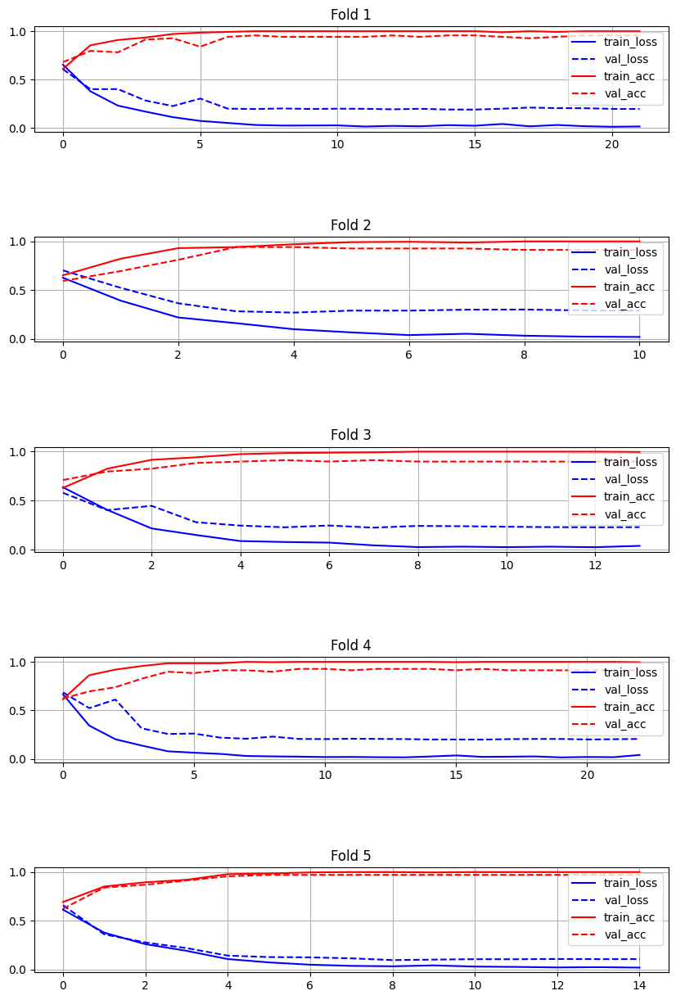

In [ ]:
plot_kfold_history(histories_resnet34)

In [ ]:
!mkdir -p history/kfold/resnet34

for i, history in enumerate(histories_resnet34) :
  history.to_csv(op.join(history_kfold_root, 'resnet34', f'resnet34_{i+1}.csv'))

### ResNet50

In [ ]:
model_resnet50 = models.resnet50(weights = models.ResNet50_Weights.IMAGENET1K_V1)
model_resnet50.fc = nn.Linear(model_resnet50.fc.in_features, num_classes)

optimizer_resnet50 = optim.SGD(model_resnet50.parameters(), lr=lr, momentum=momentum)
scheduler_resnet50 = optim.lr_scheduler.MultiStepLR(optimizer_resnet50, milestones=[10-1, 20-1], gamma=0.1)

checkpoint_pretrained_resnet50 = {
    'model_state_dict' : model_resnet50.state_dict(),
    'optimizer_state_dict' : optimizer_resnet50.state_dict(),
    'scheduler_state_dict' : scheduler_resnet50.state_dict()
}

torch.save(checkpoint_pretrained_resnet50, op.join(checkpoints_pretrained_root, 'resnet50.pth'))

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 205MB/s]


In [ ]:
histories_resnet50, summaries_resnet50 = kfold_process(model_resnet50, 'Checkpoints/pretrained/resnet50.pth', criterion, optimizer_resnet50, epochs, patience, scheduler_resnet50, 'resnet50')



Fold 1
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.659548244614532, Val Loss: 0.6545460552409075, Train Acc: 0.572463768115942, Val Acc: 0.5072463768115942
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.508408491594204, Val Loss: 0.4950030821820964, Train Acc: 0.7717391304347826, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.34556636905324634, Val Loss: 0.34775164205095044, Train Acc: 0.855072463768116, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.2031820485557335, Val Loss: 0.2763523597648178, Train Acc: 0.927536231884058, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.13378870465617249, Val Loss: 0.24804391906313275, Train Acc: 0.967391304347826, Val Acc: 0.9130434782608695

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.10555540532737538, Val Loss: 0.24636738714964493, Train Acc: 0.9710144927536232, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.07447004339833191, Val Loss: 0.22765908120335013, Train Acc: 0.9818840579710145, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.05769542637078658, Val Loss: 0.21822701675304468, Train Acc: 0.9927536231884058, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.05338045219094425, Val Loss: 0.20821291586195212, Train Acc: 0.9891304347826086, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.022552771790735962, Val Loss: 0.21177967262548814, Train Acc: 1.0, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.018917600084366142, Val Loss: 0.2150319296380748, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.027082195424515267, Val Loss: 0.22119371188075646, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.018233905505874882, Val Loss: 0.22933386590169824, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.020394066605123058, Val Loss: 0.2304177625455718, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.0226558617491653, Val Loss: 0.226448946888896, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 2
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6444075885026351, Val Loss: 0.6453126634376637, Train Acc: 0.6123188405797102, Val Acc: 0.6956521739130435
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4588091883106508, Val Loss: 0.45159193571063055, Train Acc: 0.8152173913043478, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.30126025495321856, Val Loss: 0.38712980479433917, Train Acc: 0.9021739130434783, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.22447029209655264, Val Loss: 0.32693285019933316, Train Acc: 0.9311594202898551, Val Acc: 0.8695652173913043

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.12018346894478453, Val Loss: 0.2935566306114197, Train Acc: 0.9782608695652174, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.10722774958265001, Val Loss: 0.27253622421319934, Train Acc: 0.9710144927536232, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.07116180096847424, Val Loss: 0.28589311198911804, Train Acc: 0.9818840579710145, Val Acc: 0.8985507246376812

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.05649819721778234, Val Loss: 0.2828863980653493, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.033859160769244896, Val Loss: 0.27757552807367797, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.029459130720815796, Val Loss: 0.2790451809035047, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.025088916411218437, Val Loss: 0.28197456788325653, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.028856819630533024, Val Loss: 0.28230229214481684, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 3
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.660725146100141, Val Loss: 0.6006033541499705, Train Acc: 0.5833333333333334, Val Acc: 0.782608695652174
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.467894845250724, Val Loss: 0.40102298277011816, Train Acc: 0.855072463768116, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.32320172372071637, Val Loss: 0.3190007697844851, Train Acc: 0.894927536231884, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.22869704469390537, Val Loss: 0.2621058668617321, Train Acc: 0.9347826086956522, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.13115888995968777, Val Loss: 0.24825575343076733, Train Acc: 0.9637681159420289, Val Acc: 0.8695652173913043

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.08737774884355241, Val Loss: 0.237645055072895, Train Acc: 0.9818840579710145, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.05864257287180078, Val Loss: 0.22789544039878293, Train Acc: 0.9855072463768116, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.04912683896828389, Val Loss: 0.2264332183893176, Train Acc: 0.9927536231884058, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.03592213102872821, Val Loss: 0.23290957272916601, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.027524232850882454, Val Loss: 0.22797424286819887, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.033698728982953056, Val Loss: 0.22098258126905, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.04225417042987934, Val Loss: 0.22212909583164298, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.04099051427582036, Val Loss: 0.2130948577238166, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.030302931109200352, Val Loss: 0.2114792405695155, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.031089894365573276, Val Loss: 0.21197785565332658, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.02747681091769018, Val Loss: 0.217160158507202, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.02464584763283315, Val Loss: 0.2139265171211699, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.02236763047783271, Val Loss: 0.21459253626349178, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.017894440748985264, Val Loss: 0.21995062391827072, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.03536695833115474, Val Loss: 0.21911403148070627, Train Acc: 0.9891304347826086, Val Acc: 0.9130434782608695

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 4
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6415385448414347, Val Loss: 0.6356628684030063, Train Acc: 0.6159420289855072, Val Acc: 0.6666666666666666
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.429622529209524, Val Loss: 0.5086001654465994, Train Acc: 0.855072463768116, Val Acc: 0.782608695652174
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2962386400803276, Val Loss: 0.4420051997986393, Train Acc: 0.8913043478260869, Val Acc: 0.7536231884057971

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.19204553616219672, Val Loss: 0.476816751818726, Train Acc: 0.9420289855072463, Val Acc: 0.7971014492753623
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.12504553546508154, Val Loss: 0.360944960212362, Train Acc: 0.9601449275362319, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.08303947001695633, Val Loss: 0.2919959916152816, Train Acc: 0.9710144927536232, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.058612582800181015, Val Loss: 0.3059499484041463, Train Acc: 0.9855072463768116, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.045105618303236755, Val Loss: 0.3820626859863599, Train Acc: 0.9963768115942029, Val Acc: 0.8260869565217391

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.03046304629980654, Val Loss: 0.29481951671018114, Train Acc: 1.0, Val Acc: 0.8840579710144928
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.020440772067809452, Val Loss: 0.29100760536781256, Train Acc: 1.0, Val Acc: 0.8840579710144928
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.01778088331870411, Val Loss: 0.2953580255093782, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.02434031878584537, Val Loss: 0.29656233174213464, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.022929106717524322, Val Loss: 0.30115080160507257, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.017058597729149937, Val Loss: 0.3026204489279484, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.01776266201952661, Val Loss: 0.3006008155104043, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.02190438431242238, Val Loss: 0.300506555299828, Train Acc: 1.0, Val Acc: 0.8840579710144928

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 5
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6603342432906663, Val Loss: 0.6189991080242655, Train Acc: 0.5543478260869565, Val Acc: 0.5942028985507246
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.488578320413396, Val Loss: 0.48867241800695227, Train Acc: 0.7717391304347826, Val Acc: 0.7536231884057971
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.3645477433135544, Val Loss: 0.29238514299841895, Train Acc: 0.8514492753623188, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.2391838269389194, Val Loss: 0.2025655758553657, Train Acc: 0.9130434782608695, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.2001835701690204, Val Loss: 0.1829065486140873, Train Acc: 0.9420289855072463, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.11798337220713712, Val Loss: 0.14367079043733902, Train Acc: 0.967391304347826, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.0872271417275719, Val Loss: 0.1457207490676555, Train Acc: 0.967391304347826, Val Acc: 0.9420289855072463

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.05704256622255712, Val Loss: 0.11917805909246638, Train Acc: 0.9891304347826086, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.03613288894943569, Val Loss: 0.12398968690979308, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.024159643961035687, Val Loss: 0.1177292537700007, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.029086688128502472, Val Loss: 0.11634610965847969, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.04166475618663042, Val Loss: 0.12340344575004301, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.02584434964734575, Val Loss: 0.11623178633010905, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.0351149714079456, Val Loss: 0.11082928598035073, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.019636042227131733, Val Loss: 0.10990356567545213, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.02834287868893665, Val Loss: 0.11376448010728843, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.023835531233445457, Val Loss: 0.11123649883961333, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.024519804379214413, Val Loss: 0.10953987940498021, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.02304338312883308, Val Loss: 0.10873783498570538, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.01927677979287894, Val Loss: 0.11154766337595125, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.024147041195976562, Val Loss: 0.1148609650739725, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.020249272872140442, Val Loss: 0.11619156914884629, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.02323031592844189, Val Loss: 0.11498180874015974, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.02063953822505647, Val Loss: 0.11264083013478396, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.022776363889916218, Val Loss: 0.11271990638604198, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]


mean acc = 0.9246376811594204


In [ ]:
summaries_resnet50

,train_loss,val_loss,train_acc,val_acc
0,0.015538,0.211775,1.000000,0.927536
1,0.057422,0.272537,0.985507,0.927536
2,0.025820,0.226440,0.996377,0.927536
3,0.013795,0.291020,1.000000,0.884058
4,0.014079,0.108733,1.000000,0.956522


In [ ]:
summaries_resnet50.describe().T

,count,mean,std,min,25%,50%,75%,max
train_loss,5.0,0.025331,0.018612,0.013795,0.014079,0.015538,0.025820,0.057422
val_loss,5.0,0.222101,0.071189,0.108733,0.211775,0.226440,0.272537,0.291020
train_acc,5.0,0.996377,0.006276,0.985507,0.996377,1.000000,1.000000,1.000000
val_acc,5.0,0.924638,0.025925,0.884058,0.927536,0.927536,0.927536,0.956522


In [ ]:
summaries_resnet50.loc['mean'] = summaries_resnet50.mean()
summaries_resnet50

,train_loss,val_loss,train_acc,val_acc
0,0.015538,0.211775,1.000000,0.927536
1,0.057422,0.272537,0.985507,0.927536
2,0.025820,0.226440,0.996377,0.927536
3,0.013795,0.291020,1.000000,0.884058
4,0.014079,0.108733,1.000000,0.956522
mean,0.025331,0.222101,0.996377,0.924638


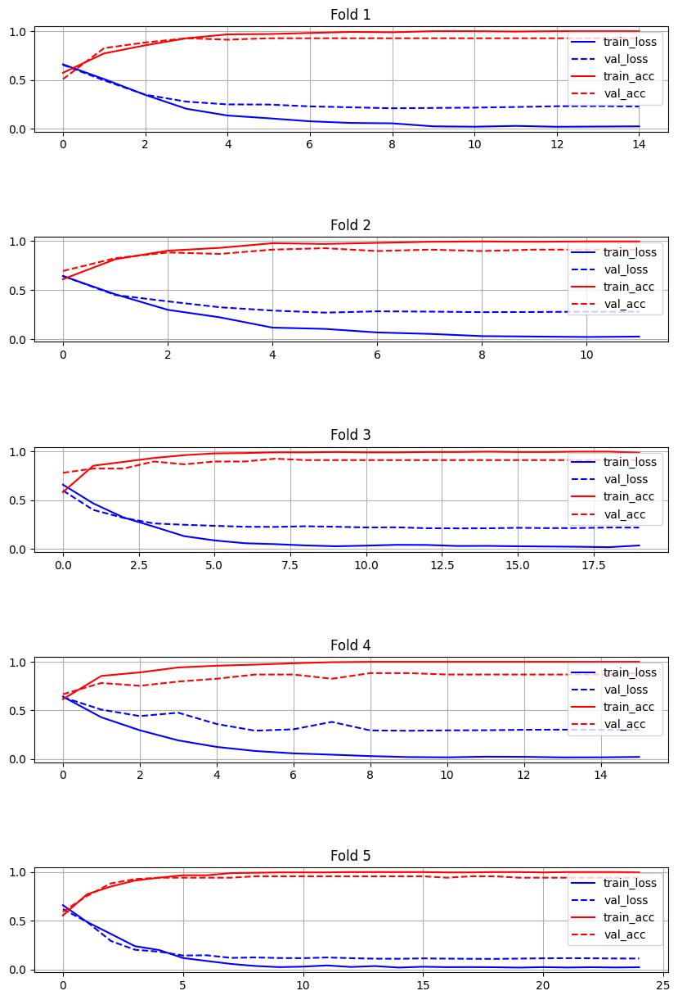

In [ ]:
plot_kfold_history(histories_resnet50)

In [ ]:
!mkdir -p history/kfold/resnet50

for i, history in enumerate(histories_resnet50) :
  history.to_csv(op.join(history_kfold_root, 'resnet50', f'resnet50_{i+1}.csv'))

### DenseNet121

In [ ]:
model_densenet121 = models.densenet121(weights = models.DenseNet121_Weights.IMAGENET1K_V1)
model_densenet121.classifier = nn.Linear(model_densenet121.classifier.in_features, num_classes)

optimizer_densenet121 = optim.SGD(model_densenet121.parameters(), lr=lr, momentum=momentum)
scheduler_densenet121 = optim.lr_scheduler.MultiStepLR(optimizer_densenet121, milestones=[10-1, 20-1], gamma=0.1)

checkpoint_pretrained_densenet121 = {
    'model_state_dict' : model_densenet121.state_dict(),
    'optimizer_state_dict' : optimizer_densenet121.state_dict(),
    'scheduler_state_dict' : scheduler_densenet121.state_dict()
}

torch.save(checkpoint_pretrained_densenet121, op.join(checkpoints_pretrained_root, 'densenet121.pth'))

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 115MB/s] 


In [ ]:
histories_densenet121, summaries_densenet121 = kfold_process(model_densenet121, 'Checkpoints/pretrained/densenet121.pth', criterion, optimizer_densenet121, epochs, patience, scheduler_densenet121, 'densenet121')



Fold 1
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.620105359001436, Val Loss: 0.6009574739829354, Train Acc: 0.6376811594202898, Val Acc: 0.6811594202898551
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.38563667993614636, Val Loss: 0.35349714604840765, Train Acc: 0.855072463768116, Val Acc: 0.855072463768116
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2446861249813135, Val Loss: 0.28457376490468567, Train Acc: 0.9384057971014492, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.17837123831977014, Val Loss: 0.24180204583250958, Train Acc: 0.9420289855072463, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.1294773977951727, Val Loss: 0.21134908896857413, Train Acc: 0.967391304347826, Val Acc: 0.9130434782608695

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.09000120981447939, Val Loss: 0.224364281564519, Train Acc: 0.9818840579710145, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08181733060358228, Val Loss: 0.22269689864006595, Train Acc: 0.9782608695652174, Val Acc: 0.927536231884058

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.05261063340889371, Val Loss: 0.19311721255813818, Train Acc: 0.9891304347826086, Val Acc: 0.927536231884058

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.050139607240756355, Val Loss: 0.25743133304775623, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.03148331120610237, Val Loss: 0.21321297577325848, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.03370851218916368, Val Loss: 0.2095477997554817, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.037198549379473145, Val Loss: 0.2114629810271056, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.04014108335410339, Val Loss: 0.2091441711653834, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.026121345551117607, Val Loss: 0.20472337154374606, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 2
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6291306744451108, Val Loss: 0.581302827683048, Train Acc: 0.6485507246376812, Val Acc: 0.6521739130434783
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.39210294338240137, Val Loss: 0.42869288031605707, Train Acc: 0.8442028985507246, Val Acc: 0.855072463768116
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2522456205409506, Val Loss: 0.3563058404116959, Train Acc: 0.9021739130434783, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.24634778067685556, Val Loss: 0.34220958231151966, Train Acc: 0.8768115942028986, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.13302909528863602, Val Loss: 0.3227646199689395, Train Acc: 0.9637681159420289, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.09946521727935127, Val Loss: 0.312922906184542, Train Acc: 0.9746376811594203, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.0872772285255833, Val Loss: 0.3457741183971149, Train Acc: 0.9818840579710145, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.06411799065012863, Val Loss: 0.28646264905514923, Train Acc: 0.9855072463768116, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.04880491347200629, Val Loss: 0.3359993663279043, Train Acc: 0.9927536231884058, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.04561652102764102, Val Loss: 0.2906483407469763, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.027874647585702114, Val Loss: 0.2900895770045294, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.02655796982024027, Val Loss: 0.2857658615254838, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.026532674397247425, Val Loss: 0.2840597247299941, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.027130795008354427, Val Loss: 0.2834908440709114, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.02214225710950036, Val Loss: 0.2853385361208432, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.030723546240208805, Val Loss: 0.2803576435299887, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.03243164319976948, Val Loss: 0.28203523245410644, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.02491327391370483, Val Loss: 0.28622646608214447, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.025253853936126266, Val Loss: 0.28677764567344083, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.028195134107617363, Val Loss: 0.2849795527054348, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.021439884802785473, Val Loss: 0.2857057608232118, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.026785661479917126, Val Loss: 0.2871043362479279, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 3
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6024520155312358, Val Loss: 0.5181297007678212, Train Acc: 0.6485507246376812, Val Acc: 0.782608695652174
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.388804589924605, Val Loss: 0.31305328573005786, Train Acc: 0.855072463768116, Val Acc: 0.8405797101449275
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2658400725627291, Val Loss: 0.24893191845520682, Train Acc: 0.9021739130434783, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.19394782963006393, Val Loss: 0.25968032686606696, Train Acc: 0.9420289855072463, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.13560590731061023, Val Loss: 0.20513183310411978, Train Acc: 0.967391304347826, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.10144712398017662, Val Loss: 0.25105942915315216, Train Acc: 0.967391304347826, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.080732398275016, Val Loss: 0.23921734267386838, Train Acc: 0.9855072463768116, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.054808560002973114, Val Loss: 0.181730801752512, Train Acc: 0.9927536231884058, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.04301264223413191, Val Loss: 0.1782099857278492, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.040343331038088036, Val Loss: 0.1750346286141354, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.025847212047032688, Val Loss: 0.1733864692674167, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.03464935255655344, Val Loss: 0.17828176181385483, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.03245404862083387, Val Loss: 0.18189442438491876, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.045558874157891754, Val Loss: 0.17662726288688355, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.024557282689256943, Val Loss: 0.18125149866809015, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.024894696376893833, Val Loss: 0.18343073518379874, Train Acc: 1.0, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.0398022861800332, Val Loss: 0.17796312013398047, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 4
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6250066446221393, Val Loss: 0.6147933101308518, Train Acc: 0.6086956521739131, Val Acc: 0.6376811594202898
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.37644809009372326, Val Loss: 0.49213996313620306, Train Acc: 0.8586956521739131, Val Acc: 0.7391304347826086
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.25787002301734424, Val Loss: 0.4274104660835819, Train Acc: 0.9130434782608695, Val Acc: 0.782608695652174
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.17471406230891962, Val Loss: 0.35215041300524835, Train Acc: 0.9528985507246377, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.13647616438675617, Val Loss: 0.3164532512858294, Train Acc: 0.9637681159420289, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.08848236069299173, Val Loss: 0.31572341141493426, Train Acc: 0.9855072463768116, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.07686118878748106, Val Loss: 0.27613413679426996, Train Acc: 0.9818840579710145, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.04082675807286, Val Loss: 0.29540408003157465, Train Acc: 0.9927536231884058, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.04202548009545907, Val Loss: 0.3092459539572398, Train Acc: 0.9927536231884058, Val Acc: 0.855072463768116

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.030252563240735428, Val Loss: 0.2938862227011418, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.033587197921630264, Val Loss: 0.2876043570214424, Train Acc: 1.0, Val Acc: 0.8840579710144928

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.02672128255168597, Val Loss: 0.28362272830976953, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.024587994454887466, Val Loss: 0.2837077902387018, Train Acc: 1.0, Val Acc: 0.8840579710144928

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 5
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6709029173505479, Val Loss: 0.5541000050911005, Train Acc: 0.5905797101449275, Val Acc: 0.7536231884057971
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.41468142124189844, Val Loss: 0.3452776672615521, Train Acc: 0.8405797101449275, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.3250891315764275, Val Loss: 0.22842284345972366, Train Acc: 0.8586956521739131, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.1943601970223413, Val Loss: 0.2255497715179471, Train Acc: 0.9601449275362319, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.15641239890153857, Val Loss: 0.179453505931989, Train Acc: 0.9637681159420289, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.1227985903404761, Val Loss: 0.15499636617259702, Train Acc: 0.9637681159420289, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08911652517491493, Val Loss: 0.13614137675883115, Train Acc: 0.9855072463768116, Val Acc: 0.9565217391304348
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.06891483262829158, Val Loss: 0.12033542947492738, Train Acc: 0.9927536231884058, Val Acc: 0.9420289855072463

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.0436430416893268, Val Loss: 0.10564009294561717, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.030405071685495583, Val Loss: 0.11059066826018735, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.04702461100574853, Val Loss: 0.10976748805547105, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.03294732885948126, Val Loss: 0.11402231411657472, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.04356111621187217, Val Loss: 0.11275739838247714, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.03444047277604324, Val Loss: 0.11239215245713359, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.029630073143736176, Val Loss: 0.1134200655463813, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]


mean acc = 0.9333333333333333


In [ ]:
summaries_densenet121

,train_loss,val_loss,train_acc,val_acc
0,0.018613,0.204718,1.000000,0.956522
1,0.036988,0.286475,0.996377,0.927536
2,0.054807,0.181727,0.992754,0.927536
3,0.019674,0.283609,1.000000,0.898551
4,0.025396,0.105643,1.000000,0.956522


In [ ]:
summaries_densenet121.describe().T

,count,mean,std,min,25%,50%,75%,max
train_loss,5.0,0.031096,0.015130,0.018613,0.019674,0.025396,0.036988,0.054807
val_loss,5.0,0.212434,0.075754,0.105643,0.181727,0.204718,0.283609,0.286475
train_acc,5.0,0.997826,0.003241,0.992754,0.996377,1.000000,1.000000,1.000000
val_acc,5.0,0.933333,0.024251,0.898551,0.927536,0.927536,0.956522,0.956522


In [ ]:
summaries_densenet121.loc['mean'] = summaries_densenet121.mean()
summaries_densenet121

,train_loss,val_loss,train_acc,val_acc
0,0.018613,0.204718,1.000000,0.956522
1,0.036988,0.286475,0.996377,0.927536
2,0.054807,0.181727,0.992754,0.927536
3,0.019674,0.283609,1.000000,0.898551
4,0.025396,0.105643,1.000000,0.956522
mean,0.031096,0.212434,0.997826,0.933333


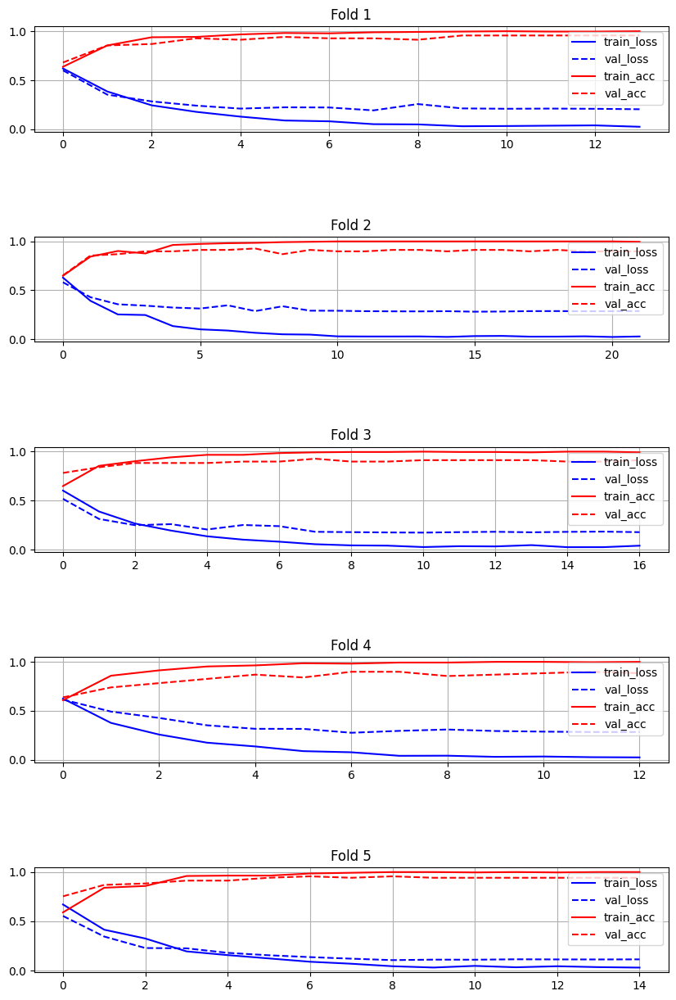

In [ ]:
plot_kfold_history(histories_densenet121)

In [ ]:
!mkdir -p history/kfold/densenet121

for i, history in enumerate(histories_densenet121) :
  history.to_csv(op.join(history_kfold_root, 'densenet121', f'densenet121_{i+1}.csv'))

### DenseNet201

In [ ]:
model_densenet201 = models.densenet201(weights = models.DenseNet201_Weights.IMAGENET1K_V1)
model_densenet201.classifier = nn.Linear(model_densenet201.classifier.in_features, num_classes)

optimizer_densenet201 = optim.SGD(model_densenet201.parameters(), lr=lr, momentum=momentum)
scheduler_densenet201 = optim.lr_scheduler.MultiStepLR(optimizer_densenet201, milestones=[10-1, 20-1], gamma=0.1)

checkpoint_pretrained_densenet201 = {
    'model_state_dict' : model_densenet201.state_dict(),
    'optimizer_state_dict' : optimizer_densenet201.state_dict(),
    'scheduler_state_dict' : scheduler_densenet201.state_dict()

}

torch.save(checkpoint_pretrained_densenet201, op.join(checkpoints_pretrained_root, 'densenet201.pth'))

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:00<00:00, 199MB/s]


In [ ]:
histories_densenet201, summaries_densenet201 = kfold_process(model_densenet201, 'Checkpoints/pretrained/densenet201.pth', criterion, optimizer_densenet201, epochs, patience, scheduler_densenet201, 'densenet201')



Fold 1
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6344054047612177, Val Loss: 0.6737311871155448, Train Acc: 0.6666666666666666, Val Acc: 0.5652173913043478
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.40841620944548346, Val Loss: 0.5361411606056102, Train Acc: 0.8586956521739131, Val Acc: 0.7246376811594203
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.28517228019410285, Val Loss: 0.411411573489507, Train Acc: 0.9094202898550725, Val Acc: 0.782608695652174
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.19433671257634094, Val Loss: 0.39238607667494513, Train Acc: 0.9347826086956522, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.16098549962043762, Val Loss: 0.24976124603679214, Train Acc: 0.9456521739130435, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.12878907682455104, Val Loss: 0.2656920925862547, Train Acc: 0.9637681159420289, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08687765237645827, Val Loss: 0.24652996788854184, Train Acc: 0.967391304347826, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.054486768509166825, Val Loss: 0.2421725034929704, Train Acc: 0.9891304347826086, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.047645562422880226, Val Loss: 0.25484051317840384, Train Acc: 0.9927536231884058, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.03567428946279097, Val Loss: 0.24409095187118088, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.03941028100856836, Val Loss: 0.2312969981112342, Train Acc: 0.9927536231884058, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.05245079488857933, Val Loss: 0.24288936240085657, Train Acc: 0.9963768115942029, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.029810678591762764, Val Loss: 0.22764968170204025, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.027048468751751858, Val Loss: 0.2280730476629907, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.02949134055255116, Val Loss: 0.23764778522477634, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.03934682425165522, Val Loss: 0.2243766031511452, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.03143478832815005, Val Loss: 0.22697736106920932, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.03789454328733078, Val Loss: 0.24040102224419083, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.04988100595664287, Val Loss: 0.23509270600650622, Train Acc: 0.9891304347826086, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.027297683600066364, Val Loss: 0.234963598890581, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.027082940320605816, Val Loss: 0.23738536897344867, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.026513589708053547, Val Loss: 0.23380938992984052, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 1e-05
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 2
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6360676245412965, Val Loss: 0.6220880435860675, Train Acc: 0.6413043478260869, Val Acc: 0.6521739130434783
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.421110550130623, Val Loss: 0.5393631380537282, Train Acc: 0.8659420289855072, Val Acc: 0.6811594202898551
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2945801477501358, Val Loss: 0.40580971128698706, Train Acc: 0.9021739130434783, Val Acc: 0.8405797101449275
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.23369700234869253, Val Loss: 0.3193690258523692, Train Acc: 0.9130434782608695, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.15577027525590814, Val Loss: 0.3460916254831397, Train Acc: 0.9528985507246377, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.15578657993371936, Val Loss: 0.35308034469683963, Train Acc: 0.9311594202898551, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.10655605328687723, Val Loss: 0.2588139148294062, Train Acc: 0.9746376811594203, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.07601467066484949, Val Loss: 0.23630539468233136, Train Acc: 0.9891304347826086, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.04664541251849437, Val Loss: 0.2538378627403923, Train Acc: 0.9927536231884058, Val Acc: 0.8840579710144928

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.03283762489108072, Val Loss: 0.24815412276033041, Train Acc: 0.9963768115942029, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.04202821532237357, Val Loss: 0.25111244729571586, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.05686674018700918, Val Loss: 0.24443942648561104, Train Acc: 0.9891304347826086, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.03229571085261262, Val Loss: 0.2505868284598641, Train Acc: 0.9963768115942029, Val Acc: 0.8985507246376812

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.03753642986218134, Val Loss: 0.2631166912075402, Train Acc: 0.9927536231884058, Val Acc: 0.8840579710144928

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 3
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6409793297449747, Val Loss: 0.6315907628639884, Train Acc: 0.6376811594202898, Val Acc: 0.5797101449275363
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4431102621382561, Val Loss: 0.45454096146251843, Train Acc: 0.8260869565217391, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2913561929827151, Val Loss: 0.29301019293674524, Train Acc: 0.9094202898550725, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.18811690720958987, Val Loss: 0.2464716361052748, Train Acc: 0.9601449275362319, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.1265042575373166, Val Loss: 0.2495748059473176, Train Acc: 0.9710144927536232, Val Acc: 0.8985507246376812

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.09576755265394847, Val Loss: 0.21612314642339514, Train Acc: 0.9746376811594203, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.06312870439411937, Val Loss: 0.22833001095315683, Train Acc: 0.9855072463768116, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.05645383997023969, Val Loss: 0.25540441784845747, Train Acc: 0.9855072463768116, Val Acc: 0.9130434782608695

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.044559502191301704, Val Loss: 0.20815702738321346, Train Acc: 0.9927536231884058, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.030462579018827797, Val Loss: 0.20790295837366063, Train Acc: 1.0, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.030026949024286823, Val Loss: 0.21153944412219353, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.029811807840630627, Val Loss: 0.21265555291936017, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.04168601906385975, Val Loss: 0.21592690093793732, Train Acc: 1.0, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.02890825109637302, Val Loss: 0.21410657789396204, Train Acc: 0.9963768115942029, Val Acc: 0.927536231884058

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.030585512410903324, Val Loss: 0.21631937889733177, Train Acc: 1.0, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.02160241859762565, Val Loss: 0.21118901343341323, Train Acc: 1.0, Val Acc: 0.9420289855072463

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 4
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.62697339317073, Val Loss: 0.6728596704593603, Train Acc: 0.6594202898550725, Val Acc: 0.5362318840579711
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4007714205030082, Val Loss: 0.5706631333931632, Train Acc: 0.8731884057971014, Val Acc: 0.7536231884057971
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.25949863635975384, Val Loss: 0.5110407402549965, Train Acc: 0.9311594202898551, Val Acc: 0.7681159420289855
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.18439655502637228, Val Loss: 0.4138587911923726, Train Acc: 0.9347826086956522, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.1399546008611071, Val Loss: 0.37238786650308664, Train Acc: 0.9565217391304348, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.09513724930044534, Val Loss: 0.3072518546512161, Train Acc: 0.9746376811594203, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08571751977222553, Val Loss: 0.28438106875704683, Train Acc: 0.967391304347826, Val Acc: 0.8840579710144928

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.044314414802668754, Val Loss: 0.323641508385755, Train Acc: 0.9963768115942029, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.0361720308445502, Val Loss: 0.310869750769242, Train Acc: 0.9927536231884058, Val Acc: 0.8840579710144928
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.037600028666033264, Val Loss: 0.30855150196863257, Train Acc: 0.9963768115942029, Val Acc: 0.8840579710144928
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.03623003269667211, Val Loss: 0.30983827036360034, Train Acc: 0.9963768115942029, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.03240601648239122, Val Loss: 0.3077276342588922, Train Acc: 0.9963768115942029, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.022193504551398582, Val Loss: 0.3088769156863724, Train Acc: 1.0, Val Acc: 0.8695652173913043

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 5
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6594868604687677, Val Loss: 0.6602380794027577, Train Acc: 0.5688405797101449, Val Acc: 0.5797101449275363
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.41626332808231964, Val Loss: 0.4812998836455138, Train Acc: 0.8586956521739131, Val Acc: 0.7681159420289855
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.31667853351952374, Val Loss: 0.3875106445689132, Train Acc: 0.8985507246376812, Val Acc: 0.7971014492753623
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.21430354209049887, Val Loss: 0.2636747026573057, Train Acc: 0.9492753623188406, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.14525022217328998, Val Loss: 0.17878440529971884, Train Acc: 0.9637681159420289, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.1000442872012871, Val Loss: 0.15331690682881122, Train Acc: 0.9782608695652174, Val Acc: 0.9565217391304348
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.07523912234582762, Val Loss: 0.11883254759553549, Train Acc: 0.9855072463768116, Val Acc: 0.9420289855072463

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.10264891979918964, Val Loss: 0.10987163810194403, Train Acc: 0.9601449275362319, Val Acc: 0.9420289855072463

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.06098054835329885, Val Loss: 0.1172467133273249, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.0786147565189479, Val Loss: 0.10115604167399199, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.042342261127803635, Val Loss: 0.09749073357037875, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.03050117021885471, Val Loss: 0.09629992449629134, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.03364530729426854, Val Loss: 0.09513614758633185, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.03736490648293841, Val Loss: 0.09478065517285596, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.029648868097127346, Val Loss: 0.09296724297430205, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.03590628893479057, Val Loss: 0.09181915504344995, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.03578432347031607, Val Loss: 0.09222188119547091, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.035683908432290176, Val Loss: 0.0916221919267074, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.034507424935050636, Val Loss: 0.08996262125994849, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.03006574407597815, Val Loss: 0.09053176123162975, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.03686467774104381, Val Loss: 0.09151759873265805, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.03168395901287811, Val Loss: 0.09022419656748357, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.03238709870239963, Val Loss: 0.09152938911448354, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.036562627802292504, Val Loss: 0.09062588387641354, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.027889388761874558, Val Loss: 0.088999192783798, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 26/30 - Train Loss: 0.030080337563286656, Val Loss: 0.08886806340213271, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 27/30 - Train Loss: 0.038626800291240215, Val Loss: 0.0887303919247959, Train Acc: 1.0, Val Acc: 0.9565217391304348
update

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 28/30 - Train Loss: 0.04056061318387156, Val Loss: 0.09020448206127554, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 29/30 - Train Loss: 0.028960283521724785, Val Loss: 0.09073079301827196, Train Acc: 0.9963768115942029, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 30/30 - Train Loss: 0.032897402788849846, Val Loss: 0.09098368183966132, Train Acc: 1.0, Val Acc: 0.9565217391304348

lr = 1e-05
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]


mean acc = 0.9304347826086957


In [ ]:
summaries_densenet201

,train_loss,val_loss,train_acc,val_acc
0,0.023028,0.242882,1.000000,0.942029
1,0.048121,0.236309,0.992754,0.927536
2,0.021457,0.207903,1.000000,0.942029
3,0.020864,0.308560,1.000000,0.884058
4,0.020072,0.088731,1.000000,0.956522


In [ ]:
summaries_densenet201.describe().T

,count,mean,std,min,25%,50%,75%,max
train_loss,5.0,0.026708,0.012019,0.020072,0.020864,0.021457,0.023028,0.048121
val_loss,5.0,0.216877,0.080563,0.088731,0.207903,0.236309,0.242882,0.308560
train_acc,5.0,0.998551,0.003241,0.992754,1.000000,1.000000,1.000000,1.000000
val_acc,5.0,0.930435,0.027877,0.884058,0.927536,0.942029,0.942029,0.956522


In [ ]:
summaries_densenet201.loc['mean'] = summaries_densenet201.mean()
summaries_densenet201

,train_loss,val_loss,train_acc,val_acc
0,0.023028,0.242882,1.000000,0.942029
1,0.048121,0.236309,0.992754,0.927536
2,0.021457,0.207903,1.000000,0.942029
3,0.020864,0.308560,1.000000,0.884058
4,0.020072,0.088731,1.000000,0.956522
mean,0.026708,0.216877,0.998551,0.930435


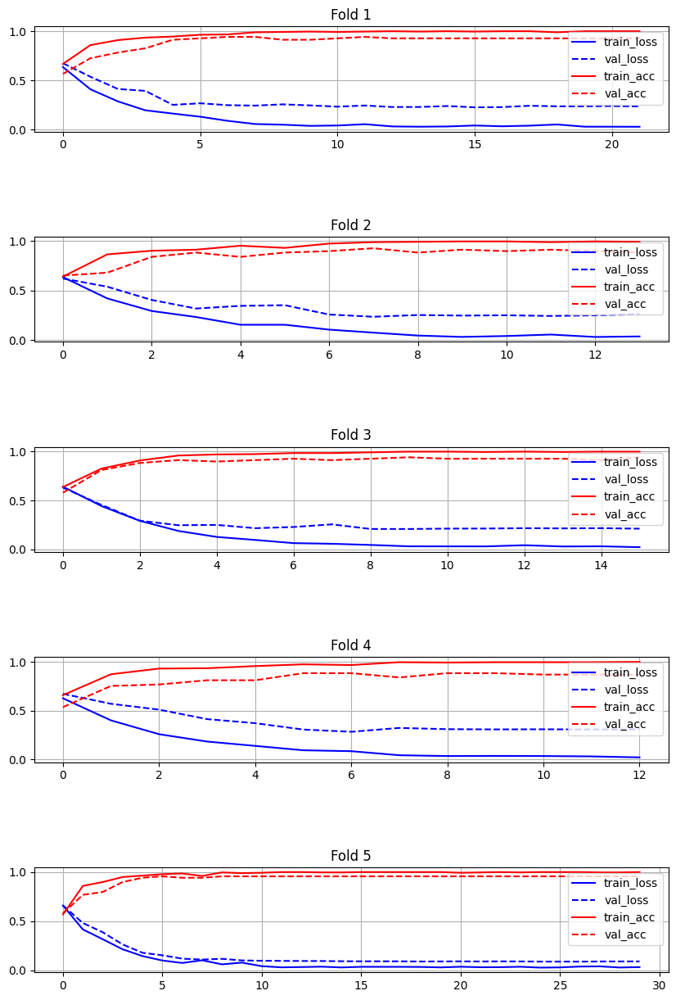

In [ ]:
plot_kfold_history(histories_densenet201)

In [ ]:
!mkdir -p history/kfold/densenet201

for i, history in enumerate(histories_densenet201) :
  history.to_csv(op.join(history_kfold_root, 'densenet201', f'densenet201_{i+1}.csv'))

### VGG16

In [ ]:
model_vgg16 = models.vgg16(weights = models.VGG16_Weights.IMAGENET1K_V1)
model_vgg16.classifier[6] = nn.Linear(model_vgg16.classifier[6].in_features, num_classes)

optimizer_vgg16 = optim.SGD(model_vgg16.parameters(), lr=lr, momentum=momentum)
scheduler_vgg16 = optim.lr_scheduler.MultiStepLR(optimizer_vgg16, milestones=[10-1, 20-1], gamma=0.1)

checkpoint_pretrained_vgg16 = {
    'model_state_dict' : model_vgg16.state_dict(),
    'optimizer_state_dict' : optimizer_vgg16.state_dict(),
    'scheduler_state_dict' : scheduler_vgg16.state_dict()

}

torch.save(checkpoint_pretrained_vgg16, op.join(checkpoints_pretrained_root, 'vgg16.pth'))

In [ ]:
histories_vgg16, summaries_vgg16 = kfold_process(model_vgg16, 'Checkpoints/pretrained/vgg16.pth', criterion, optimizer_vgg16, epochs, patience, scheduler_vgg16, 'vgg16')



Fold 1
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6492232602575551, Val Loss: 0.44084299992823944, Train Acc: 0.6268115942028986, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4553302867688995, Val Loss: 0.3664599302886189, Train Acc: 0.8115942028985508, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.33335380061813025, Val Loss: 0.31703822077184485, Train Acc: 0.8478260869565217, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.2719760120346926, Val Loss: 0.45383195514264313, Train Acc: 0.8876811594202898, Val Acc: 0.7971014492753623

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.2873148300509522, Val Loss: 0.34537892605083576, Train Acc: 0.8768115942028986, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.24920074360958044, Val Loss: 0.34626332573268725, Train Acc: 0.9021739130434783, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.22061050478099048, Val Loss: 0.24277318549760873, Train Acc: 0.9166666666666666, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.15183510032037031, Val Loss: 0.3051062641206427, Train Acc: 0.9565217391304348, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.09937532786009969, Val Loss: 0.2984239821848662, Train Acc: 0.967391304347826, Val Acc: 0.8985507246376812
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.09325069641235514, Val Loss: 0.25436940918798034, Train Acc: 0.9601449275362319, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.06511253820381303, Val Loss: 0.28838591774304706, Train Acc: 0.9710144927536232, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.06457529087429462, Val Loss: 0.2840147670628368, Train Acc: 0.9818840579710145, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.060840788229868034, Val Loss: 0.24943622482427652, Train Acc: 0.9746376811594203, Val Acc: 0.927536231884058

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 2
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6527873260387476, Val Loss: 0.6181036907693614, Train Acc: 0.6195652173913043, Val Acc: 0.7101449275362319
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4357226754444233, Val Loss: 0.46316768768904865, Train Acc: 0.7898550724637681, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.3343976343023604, Val Loss: 0.3805802213972893, Train Acc: 0.8478260869565217, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.2534306140049644, Val Loss: 0.3330281519236556, Train Acc: 0.8768115942028986, Val Acc: 0.9130434782608695
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.1643897941255051, Val Loss: 0.5212118254191633, Train Acc: 0.9384057971014492, Val Acc: 0.7681159420289855

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.2347482618862304, Val Loss: 0.8928821570631387, Train Acc: 0.9021739130434783, Val Acc: 0.7246376811594203

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.3433241705963577, Val Loss: 0.30867169343906903, Train Acc: 0.8586956521739131, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.19312274585599484, Val Loss: 0.32673883416514465, Train Acc: 0.927536231884058, Val Acc: 0.9130434782608695

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.144482783973217, Val Loss: 0.3647657126876647, Train Acc: 0.9456521739130435, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.07943575132800185, Val Loss: 0.3403713007767995, Train Acc: 0.967391304347826, Val Acc: 0.927536231884058
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.06303458579856416, Val Loss: 0.3455920167591261, Train Acc: 0.9782608695652174, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.06545751339391521, Val Loss: 0.33145041482361115, Train Acc: 0.9782608695652174, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.05283011668834133, Val Loss: 0.3210637785386348, Train Acc: 0.9782608695652174, Val Acc: 0.9130434782608695

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 3
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.7278127946715424, Val Loss: 0.6607365668683812, Train Acc: 0.5797101449275363, Val Acc: 0.4782608695652174
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.5405057616855787, Val Loss: 0.4395443252895189, Train Acc: 0.6920289855072463, Val Acc: 0.7971014492753623
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.4436450617900793, Val Loss: 0.4726026680158532, Train Acc: 0.8079710144927537, Val Acc: 0.7971014492753623
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.32735635102659033, Val Loss: 0.3763113097436186, Train Acc: 0.8731884057971014, Val Acc: 0.8405797101449275
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.28797556913417316, Val Loss: 0.42926015326942224, Train Acc: 0.8913043478260869, Val Acc: 0.855072463768116
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.27678818158481433, Val Loss: 0.41315955528314563, Train Acc: 0.9021739130434783, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.20290798553522083, Val Loss: 0.3259368368249009, Train Acc: 0.9239130434782609, Val Acc: 0.8840579710144928
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.14117278461007104, Val Loss: 0.28094607227198454, Train Acc: 0.9637681159420289, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.11695720741282338, Val Loss: 0.48944073032749735, Train Acc: 0.9601449275362319, Val Acc: 0.8840579710144928

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.09873591422818709, Val Loss: 0.29496856935430266, Train Acc: 0.967391304347826, Val Acc: 0.9130434782608695
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.06483764460553294, Val Loss: 0.25927012977932673, Train Acc: 0.9746376811594203, Val Acc: 0.9130434782608695
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.054163880700218506, Val Loss: 0.26473182439804077, Train Acc: 0.9855072463768116, Val Acc: 0.9130434782608695
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.05831080567145693, Val Loss: 0.28045633392057556, Train Acc: 0.9855072463768116, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.05030906940068024, Val Loss: 0.2829875707882794, Train Acc: 0.9855072463768116, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.05100688694611839, Val Loss: 0.2723842403594998, Train Acc: 0.9818840579710145, Val Acc: 0.9130434782608695

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.04244524239144032, Val Loss: 0.2851934813610885, Train Acc: 0.9891304347826086, Val Acc: 0.9130434782608695
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.05215623368765565, Val Loss: 0.29004612017044984, Train Acc: 0.9855072463768116, Val Acc: 0.9130434782608695

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 4
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.5963416125463403, Val Loss: 0.4942724799764329, Train Acc: 0.677536231884058, Val Acc: 0.7681159420289855
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4346511268961257, Val Loss: 0.3998575404934261, Train Acc: 0.7898550724637681, Val Acc: 0.8115942028985508
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.3391792776360028, Val Loss: 0.35583654672339343, Train Acc: 0.9021739130434783, Val Acc: 0.8260869565217391
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.237560687235732, Val Loss: 0.3027416964371999, Train Acc: 0.9057971014492754, Val Acc: 0.8405797101449275
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.2085437856722569, Val Loss: 0.36605446321376856, Train Acc: 0.9311594202898551, Val Acc: 0.8115942028985508

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.15628824620575144, Val Loss: 0.2940869728724162, Train Acc: 0.9456521739130435, Val Acc: 0.855072463768116
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.16037686061168063, Val Loss: 0.2312028675839521, Train Acc: 0.9239130434782609, Val Acc: 0.8985507246376812
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.1365660994813062, Val Loss: 0.41981149799581885, Train Acc: 0.9456521739130435, Val Acc: 0.8260869565217391

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.09801199665104134, Val Loss: 0.2823903767958931, Train Acc: 0.9601449275362319, Val Acc: 0.8695652173913043

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.08731462774069412, Val Loss: 0.16905339934147787, Train Acc: 0.967391304347826, Val Acc: 0.9710144927536232
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.06348315313242484, Val Loss: 0.17060708351757214, Train Acc: 0.9746376811594203, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.04988602278889089, Val Loss: 0.1682136510161386, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.045179039347862854, Val Loss: 0.1651260935957881, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.04521042896785598, Val Loss: 0.15829853691916534, Train Acc: 0.9927536231884058, Val Acc: 0.9710144927536232
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.04492474649695383, Val Loss: 0.1515140516170557, Train Acc: 0.9927536231884058, Val Acc: 0.9710144927536232
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.04939821060153021, Val Loss: 0.15288630926954574, Train Acc: 0.9855072463768116, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.04397274796729502, Val Loss: 0.14611994356348895, Train Acc: 0.9855072463768116, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.04337060003392938, Val Loss: 0.1553246246083923, Train Acc: 0.9818840579710145, Val Acc: 0.9565217391304348

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.03728468618963076, Val Loss: 0.14714956456336423, Train Acc: 0.9855072463768116, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.03457506557089695, Val Loss: 0.1470502153902814, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.030763622265363087, Val Loss: 0.14572963356107904, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.03592128070422273, Val Loss: 0.1452937540800675, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.031154367964768757, Val Loss: 0.14513194285657094, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.030864920008225716, Val Loss: 0.1446363407632579, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.030672490758740383, Val Loss: 0.14426041761602182, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 26/30 - Train Loss: 0.03432347058602001, Val Loss: 0.14432724414096362, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 27/30 - Train Loss: 0.035629332065582275, Val Loss: 0.14410920158716972, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 28/30 - Train Loss: 0.03433221945728081, Val Loss: 0.14354912202427353, Train Acc: 0.9891304347826086, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 29/30 - Train Loss: 0.036101844769133175, Val Loss: 0.1432787043352922, Train Acc: 0.9927536231884058, Val Acc: 0.9565217391304348

lr = 1e-05


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 30/30 - Train Loss: 0.034208621316845864, Val Loss: 0.14392488158267477, Train Acc: 0.9855072463768116, Val Acc: 0.9565217391304348

lr = 1e-05
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]



Fold 5
-------
True


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6630586040192756, Val Loss: 0.41260243498760724, Train Acc: 0.605072463768116, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.5092756683411805, Val Loss: 0.3113890007354211, Train Acc: 0.7572463768115942, Val Acc: 0.8695652173913043
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.34611193706160004, Val Loss: 0.23617162242315817, Train Acc: 0.8731884057971014, Val Acc: 0.855072463768116

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.31752126221207605, Val Loss: 0.3168588859447535, Train Acc: 0.8768115942028986, Val Acc: 0.8405797101449275

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.22445707131123196, Val Loss: 0.15960861548133518, Train Acc: 0.9239130434782609, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.18095176418622336, Val Loss: 0.1440488894780477, Train Acc: 0.9239130434782609, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.1542143812538057, Val Loss: 0.14853087612900182, Train Acc: 0.9384057971014492, Val Acc: 0.927536231884058
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.11979924833429033, Val Loss: 0.11161100432492685, Train Acc: 0.9565217391304348, Val Acc: 0.9420289855072463
update

lr = 0.001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.11135873425266017, Val Loss: 0.09635673873666403, Train Acc: 0.9601449275362319, Val Acc: 0.9420289855072463
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.08270565269217975, Val Loss: 0.06315218133554942, Train Acc: 0.9710144927536232, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.05509843601696733, Val Loss: 0.0764945528159539, Train Acc: 0.9818840579710145, Val Acc: 0.9565217391304348
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.05336609860693199, Val Loss: 0.07300815005125343, Train Acc: 0.9891304347826086, Val Acc: 0.9710144927536232
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.0425332915307819, Val Loss: 0.07772624522339606, Train Acc: 0.9891304347826086, Val Acc: 0.9710144927536232

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.039877954627508705, Val Loss: 0.07029676599347073, Train Acc: 0.9855072463768116, Val Acc: 0.9710144927536232

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.041965447312247925, Val Loss: 0.07291324286843123, Train Acc: 0.9891304347826086, Val Acc: 0.9710144927536232
update

lr = 0.0001


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.03452668654853883, Val Loss: 0.07403241323334152, Train Acc: 0.9891304347826086, Val Acc: 0.9710144927536232

lr = 0.0001
Early Stopping !!!
True


  0%|          | 0/9 [00:00<?, ?it/s]

True


  0%|          | 0/3 [00:00<?, ?it/s]


mean acc = 0.9420289855072463


In [ ]:
summaries_vgg16

,train_loss,val_loss,train_acc,val_acc
0,0.051934,0.284015,0.985507,0.927536
1,0.056752,0.340371,0.981884,0.927536
2,0.042368,0.285194,0.985507,0.913043
3,0.035040,0.151514,0.989130,0.971014
4,0.026660,0.072913,0.992754,0.971014


In [ ]:
summaries_vgg16.describe().T

,count,mean,std,min,25%,50%,75%,max
train_loss,5.0,0.042551,0.012234,0.026660,0.035040,0.042368,0.051934,0.056752
val_loss,5.0,0.226801,0.110602,0.072913,0.151514,0.284015,0.285194,0.340371
train_acc,5.0,0.986957,0.004131,0.981884,0.985507,0.985507,0.989130,0.992754
val_acc,5.0,0.942029,0.027113,0.913043,0.927536,0.927536,0.971014,0.971014


In [ ]:
summaries_vgg16.loc['mean'] = summaries_vgg16.mean()
summaries_vgg16

,train_loss,val_loss,train_acc,val_acc
0,0.051934,0.284015,0.985507,0.927536
1,0.056752,0.340371,0.981884,0.927536
2,0.042368,0.285194,0.985507,0.913043
3,0.035040,0.151514,0.989130,0.971014
4,0.026660,0.072913,0.992754,0.971014
mean,0.042551,0.226801,0.986957,0.942029


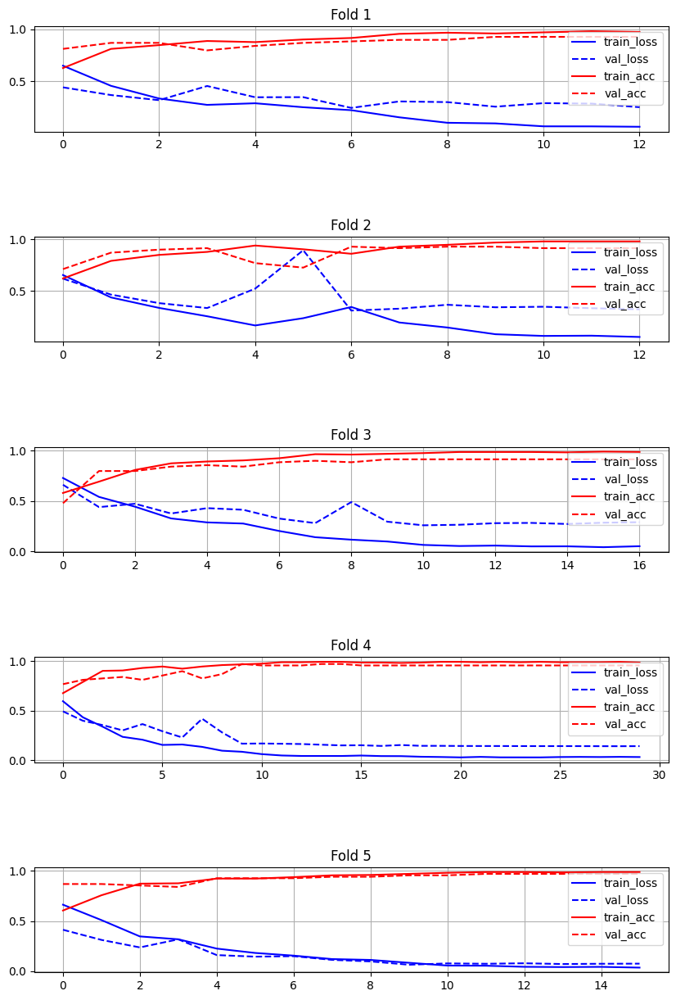

In [ ]:
plot_kfold_history(histories_vgg16)

In [ ]:
!mkdir -p history/kfold/vgg16

for i, history in enumerate(histories_vgg16) :
  history.to_csv(op.join(history_kfold_root, 'vgg16', f'vgg16_{i+1}.csv'))

## Compare

### Function

In [ ]:
def plot_accuracy_comparison(data, metric_labels, color_map,w=0.8):
    """
    Plots a bar chart comparing various accuracy metrics for different models.

    Parameters:
    data (dict): A dictionary where keys are model names and values are lists of accuracies.
    metric_labels (list): A list of labels for each accuracy metric.
    """
    models = list(data.keys())
    num_metrics = len(metric_labels)  # Number of metrics

    # Dynamic width of the bars based on the number of metrics
    width = w / num_metrics * 1.1  # Adjust width so bars are thicker

    # Set the figure size
    fig, ax = plt.subplots(figsize=(15, 8))

    # Adding bars dynamically through loop
    for i, model in enumerate(models):
        for j, metric_label in enumerate(metric_labels):
            bar = ax.bar(i + j * width, data[model][j], width, label=metric_label if i == 0 else "", color = color_map[j])
            for rect in bar:
                height = rect.get_height()
                ax.text(rect.get_x() + rect.get_width() / 2., height,
                        f'{height:.2f}', ha='center', va='bottom')

    # Adding labels, title, and legend
    ax.set_xlabel('Models')
    ax.set_ylabel('Accuracy')
    ax.set_title('Accuracy Comparison across Different Metrics')
    ax.set_xticks([p + width * (num_metrics - 1) / 2 for p in range(len(models))])
    ax.set_xticklabels(models, rotation=45, ha='right')
    ax.legend()

    # Display the plot
    plt.tight_layout()
    plt.show()

### Process

In [ ]:
summaries_kfold = {
    'ResNet18' : summaries_resnet18.loc["mean"].values,
    'ResNet34' : summaries_resnet34.loc["mean"].values,
    'ResNet50' : summaries_resnet50.loc["mean"].values,
    'DenseNet121' : summaries_densenet121.loc["mean"].values,
    'DenseNet201' : summaries_densenet201.loc["mean"].values,
    'VGG16' : summaries_vgg16.loc["mean"].values
}

In [ ]:
summaries_kfold

{'ResNet18': array([0.03151242, 0.20692387, 0.99855072, 0.93913043]),
 'ResNet34': array([0.02440321, 0.19602052, 0.99782609, 0.94202899]),
 'ResNet50': array([0.02533057, 0.22210104, 0.99637681, 0.92463768]),
 'DenseNet121': array([0.03109566, 0.2124343 , 0.99782609, 0.93333333]),
 'DenseNet201': array([0.02670841, 0.21687685, 0.99855072, 0.93043478]),
 'VGG16': array([0.04255088, 0.22680138, 0.98695652, 0.94202899])}

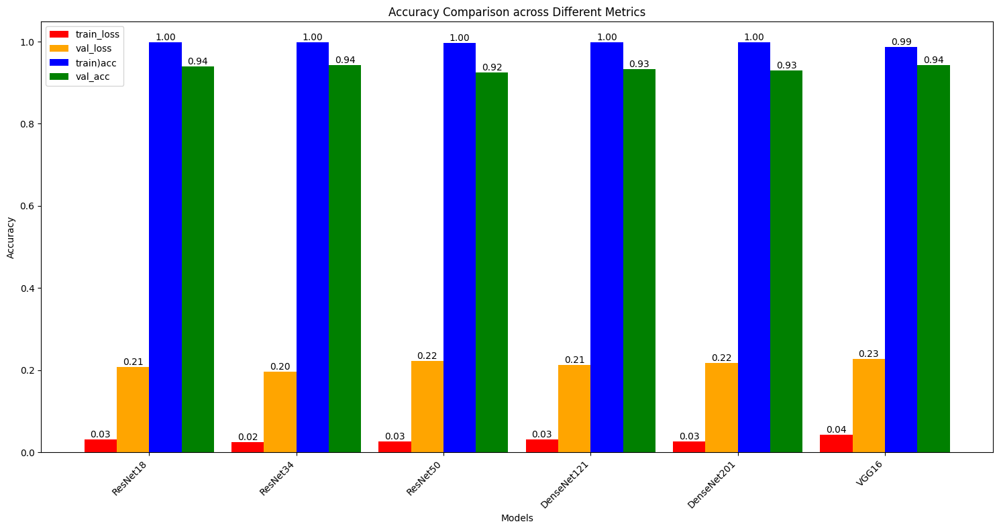

In [ ]:
plot_accuracy_comparison(summaries_kfold, ['train_loss', 'val_loss', 'train)acc', 'val_acc'], ['red','orange','blue','green'])

# Train with Full-Train Set

## Loader

In [ ]:
train_loader = DataLoader(
    dataset=train_data,
    batch_size=batch_size,
    shuffle=True,
)

test_loader = DataLoader(
    dataset=test_data,
    batch_size=batch_size,
    shuffle=False,
)

In [ ]:
train_loader.dataset, test_loader.dataset

(Dataset ImageFolder
     Number of datapoints: 345
     Root location: Data/train
     StandardTransform
 Transform: Compose(
                Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
                Grayscale(num_output_channels=3)
                ToTensor()
                Normalize(mean=[0.485, 0.485, 0.485], std=[0.229, 0.229, 0.229])
            ),
 Dataset ImageFolder
     Number of datapoints: 20
     Root location: Data/test
     StandardTransform
 Transform: Compose(
                Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
                Grayscale(num_output_channels=3)
                ToTensor()
                Normalize(mean=[0.485, 0.485, 0.485], std=[0.229, 0.229, 0.229])
            ))

## Function

### plot history, confustion matrix, predict

In [2]:
def plot_history(history, title = '') :

  plt.figure(figsize=(10,7))

  plt.plot(history.index , history['train_loss'],label='train_loss',color='green')
  plt.plot(history.index , history['val_loss'],label='val_loss',color='green' , linestyle='--')

  plt.plot(history.index , history['train_acc'],label='train_acc',color='blue')
  plt.plot(history.index , history['val_acc'],label='val_acc',color='blue' , linestyle='--')

  plt.legend(loc='lower left')
  plt.grid(True)
  plt.title(title)


  plt.xticks(ticks=range(len(history.index)), labels=history.index.astype(int))


In [ ]:
def display_confusionMatrix(y_true, y_pred) :
  matrix = metrics.confusion_matrix(y_true, y_pred)

  cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels = ['Healthy', 'Patient'])

  cm_display.plot()
  plt.show()

In [ ]:
def predicts(model , loader) :

  gpu = torch.cuda.is_available()
  print(gpu)

  if gpu : model.cuda()

  y_pred , y_true  = [] , []

  model.eval()

  for images , labels in tqdm(loader) :
    if gpu : images, labels = images.cuda(), labels.cuda()
    pred = model(images)

    yp = pred.argmax(dim=1).tolist()
    yt = labels.tolist()
    y_pred.extend(yp)
    y_true.extend(yt)

  print(classification_report(y_true, y_pred))

  return y_true , y_pred

### display_wrong_output

In [ ]:
def tensor_to_numpy(tensor_image) :
  tensor_image_cpu = tensor_image.cpu()
  numpy_image = tensor_image_cpu.permute(1,2,0).numpy()
  return numpy_image

In [ ]:
give_class = lambda is_PD : "PD" if is_PD else "H"

In [ ]:
def display_wrong_output(model, loader) :
  gpu = torch.cuda.is_available()
  print(gpu)

  if gpu : model.cuda()

  model.eval()

  y_true = []
  y_pred = []

  false_images = []
  false_outputs = []

  for images , labels in tqdm(loader) :
    if gpu :
      images , labels = images.cuda() , labels.cuda()
    pred = model(images)
    yp = pred.argmax(dim=1).tolist()
    yt = labels.tolist()
    y_pred.extend(yp)
    y_true.extend(yt)
    for i in range(len(labels)) :
      if not yt[i] == yp[i] :
        # plt.imshow(images[i])
        # print(images[i])
        false_images.append(images[i])
        false_outputs.append([yt[i] , yp[i]])

  # print(false_images)
  print(classification_report(y_true , y_pred))

  plt.figure(figsize=(15,9))


  for i in range(len(false_outputs)) :
    actual, predicted = false_outputs[i]
    tensor_image = false_images[i]
    plt.subplot(1,len(false_outputs),i+1)
    plt.imshow(tensor_to_numpy(tensor_image), cmap='gray')
    plt.title(f"{give_class(actual)} -> {give_class(predicted)}")
    plt.axis('off')

  return y_true, y_pred

## Process

In [ ]:
!mkdir -p Checkpoints/full_train

In [ ]:
!mkdir -p history/full_train

### ResNet18

In [ ]:
model_resnet18 = models.resnet18(weights = models.ResNet18_Weights.IMAGENET1K_V1)
model_resnet18.fc = nn.Linear(model_resnet18.fc.in_features, num_classes)

optimizer_resnet18 = optim.SGD(model_resnet18.parameters(), lr=lr, momentum=momentum)
scheduler_resnet18 = optim.lr_scheduler.MultiStepLR(optimizer_resnet18, milestones=[10-1, 20-1], gamma=0.1)

In [ ]:
history_resnet18 = train_model(model_resnet18, train_loader, test_loader, criterion, optimizer_resnet18, epochs, patience, scheduler_resnet18, 'Checkpoints/full_train/resnet18.pth')

True


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6063297372797262, Val Loss: 0.7402442097663879, Train Acc: 0.6608695652173913, Val Acc: 0.55
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.44377869194832403, Val Loss: 0.33540773391723633, Train Acc: 0.7971014492753623, Val Acc: 0.9
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.33957764843235844, Val Loss: 0.6574223041534424, Train Acc: 0.8492753623188406, Val Acc: 0.65

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.2322842822558638, Val Loss: 0.28784072399139404, Train Acc: 0.9043478260869565, Val Acc: 0.9
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.15813149792560632, Val Loss: 0.220238596200943, Train Acc: 0.9478260869565217, Val Acc: 0.85

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.11263352325861005, Val Loss: 0.1042347103357315, Train Acc: 0.9623188405797102, Val Acc: 0.95
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.08545657711616461, Val Loss: 0.09617744386196136, Train Acc: 0.9710144927536232, Val Acc: 0.95
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.041788130944621735, Val Loss: 0.09103405475616455, Train Acc: 1.0, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.06724348889960759, Val Loss: 0.08997499197721481, Train Acc: 0.9855072463768116, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.040690545845722806, Val Loss: 0.08268240839242935, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.03475205757911654, Val Loss: 0.07709940522909164, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.03142768563027831, Val Loss: 0.07589194923639297, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.03534232190121775, Val Loss: 0.07431929558515549, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.04661791502241639, Val Loss: 0.07524431496858597, Train Acc: 0.991304347826087, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.02589345577078453, Val Loss: 0.07463054358959198, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.059442409009173296, Val Loss: 0.07218784093856812, Train Acc: 0.991304347826087, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.026025904747455017, Val Loss: 0.07215406000614166, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.022132207636815913, Val Loss: 0.0711238831281662, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.02731462454666262, Val Loss: 0.07194587588310242, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.03075545054414998, Val Loss: 0.0709359273314476, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.022718629783586314, Val Loss: 0.07063115388154984, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.035774618964912235, Val Loss: 0.07107026875019073, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.0264391391173653, Val Loss: 0.07038582861423492, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.03470805495761443, Val Loss: 0.07186347246170044, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.025680420229184455, Val Loss: 0.07024460285902023, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 26/30 - Train Loss: 0.03437887620774732, Val Loss: 0.07046963274478912, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 27/30 - Train Loss: 0.024096920287263564, Val Loss: 0.06864374130964279, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 28/30 - Train Loss: 0.02151723460874696, Val Loss: 0.06861964613199234, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 29/30 - Train Loss: 0.026068985105856604, Val Loss: 0.07197167724370956, Train Acc: 1.0, Val Acc: 0.95

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 30/30 - Train Loss: 0.03661023235299449, Val Loss: 0.06905226409435272, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 1e-05


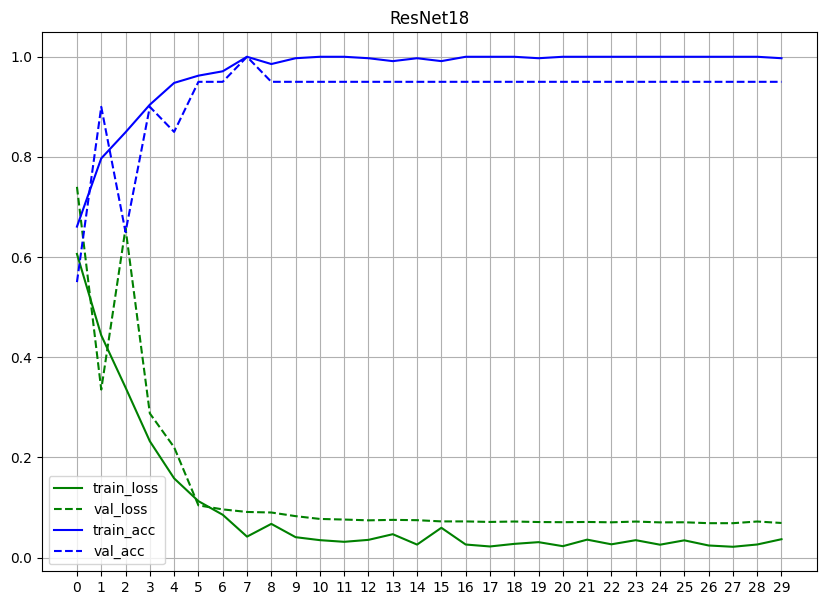

In [ ]:
plot_history(history_resnet18, 'ResNet18')

In [ ]:
history_resnet18.to_csv('history/full_train/resnet18.csv')

#### Train

In [ ]:
train_true_resnet18, train_pred_resnet18 = display_wrong_output(model_resnet18, train_loader)

True


  0%|          | 0/11 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       180
           1       1.00      1.00      1.00       165

    accuracy                           1.00       345
   macro avg       1.00      1.00      1.00       345
weighted avg       1.00      1.00      1.00       345



<Figure size 1500x900 with 0 Axes>

In [ ]:
train_acc_resnet18 = accuracy_score(train_true_resnet18, train_pred_resnet18)
train_acc_resnet18

1.0

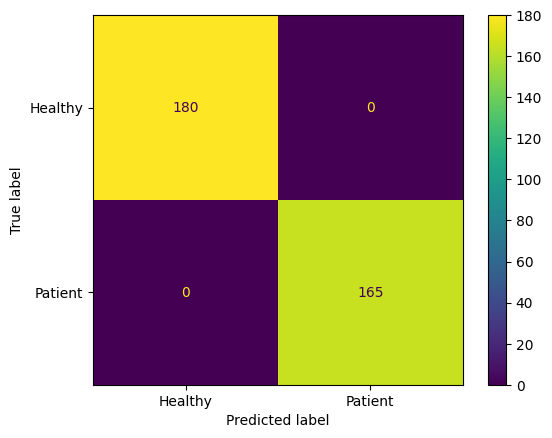

In [ ]:
display_confusionMatrix(train_true_resnet18, train_pred_resnet18)

#### Test

In [ ]:
test_true_resnet18, test_pred_resnet18 = display_wrong_output(model_resnet18, test_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



<Figure size 1500x900 with 0 Axes>

In [ ]:
test_acc_resnet18 = accuracy_score(test_true_resnet18, test_pred_resnet18)
test_acc_resnet18

1.0

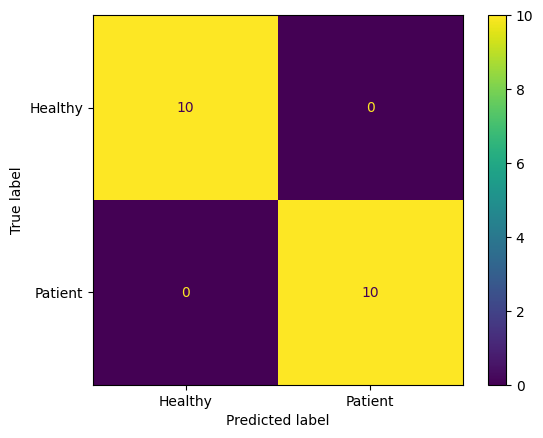

In [ ]:
display_confusionMatrix(test_true_resnet18, test_pred_resnet18)

### ResNet34

In [ ]:
model_resnet34 = models.resnet34(weights = models.ResNet34_Weights.IMAGENET1K_V1)
model_resnet34.fc = nn.Linear(model_resnet34.fc.in_features, num_classes)

optimizer_resnet34 = optim.SGD(model_resnet34.parameters(), lr=lr, momentum=momentum)
scheduler_resnet34 = optim.lr_scheduler.MultiStepLR(optimizer_resnet34, milestones=[10-1, 20-1], gamma=0.1)

In [ ]:
history_resnet34 = train_model(model_resnet34, train_loader, test_loader, criterion, optimizer_resnet34, epochs, patience, scheduler_resnet34, 'Checkpoints/full_train/resnet34.pth')

True


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.5341205247934314, Val Loss: 0.6654629111289978, Train Acc: 0.744927536231884, Val Acc: 0.65
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.2848368371742359, Val Loss: 0.4466361999511719, Train Acc: 0.8927536231884058, Val Acc: 0.8
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.17777724538160408, Val Loss: 0.15041787922382355, Train Acc: 0.9304347826086956, Val Acc: 0.95
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.12038413367193679, Val Loss: 0.12397518008947372, Train Acc: 0.9565217391304348, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.07533301301840423, Val Loss: 0.16740211844444275, Train Acc: 0.9768115942028985, Val Acc: 0.95

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.06458998391593712, Val Loss: 0.16982151567935944, Train Acc: 0.9826086956521739, Val Acc: 0.95

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.055811405090102253, Val Loss: 0.1683691442012787, Train Acc: 0.9826086956521739, Val Acc: 0.9

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.03754473244366439, Val Loss: 0.12546278536319733, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.024916995133178823, Val Loss: 0.17349180579185486, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.04375861805418263, Val Loss: 0.1465817093849182, Train Acc: 0.9855072463768116, Val Acc: 0.95

lr = 0.0001
Early Stopping !!!


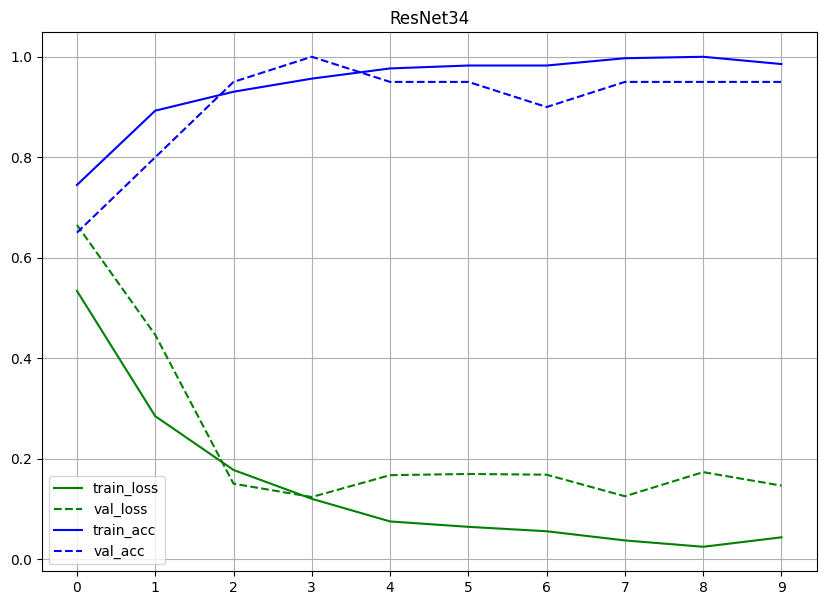

In [ ]:
plot_history(history_resnet34, 'ResNet34')

In [ ]:
history_resnet34.to_csv('history/full_train/resnet34.csv')

#### Train

True


  0%|          | 0/11 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       180
           1       0.96      0.99      0.98       165

    accuracy                           0.98       345
   macro avg       0.98      0.98      0.98       345
weighted avg       0.98      0.98      0.98       345



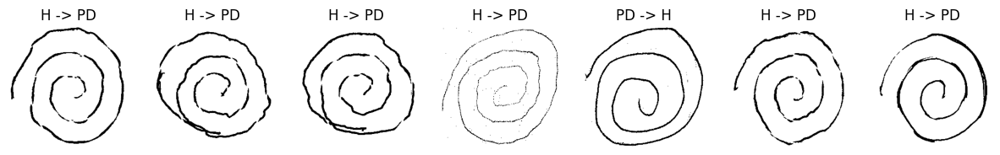

In [ ]:
train_true_resnet34, train_pred_resnet34 = display_wrong_output(model_resnet34, train_loader)

In [ ]:
train_acc_resnet34 = accuracy_score(train_true_resnet34, train_pred_resnet34)
train_acc_resnet34

0.9797101449275363

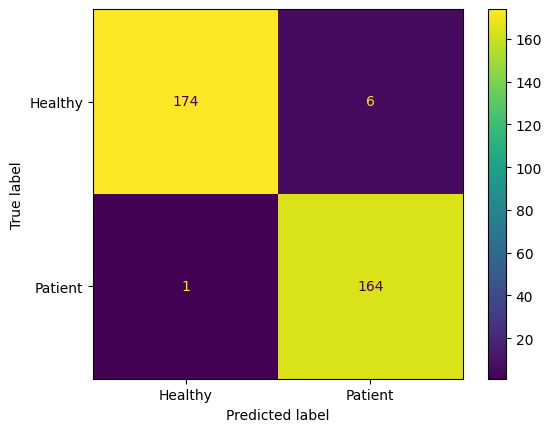

In [ ]:
display_confusionMatrix(train_true_resnet34, train_pred_resnet34)

#### Test

In [ ]:
test_true_resnet34, test_pred_resnet34 = display_wrong_output(model_resnet34, test_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



<Figure size 1500x900 with 0 Axes>

In [ ]:
test_acc_resnet34 = accuracy_score(test_true_resnet34, test_pred_resnet34)
test_acc_resnet34

1.0

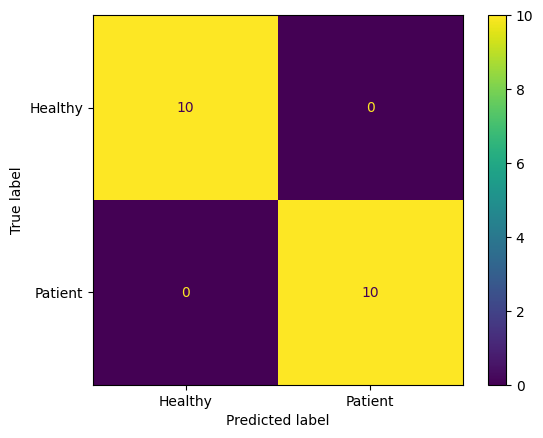

In [ ]:
display_confusionMatrix(test_true_resnet34, test_pred_resnet34)

### ResNet50

In [ ]:
model_resnet50 = models.resnet50(weights = models.ResNet50_Weights.IMAGENET1K_V1)
model_resnet50.fc = nn.Linear(model_resnet50.fc.in_features, num_classes)

optimizer_resnet50 = optim.SGD(model_resnet50.parameters(), lr=lr, momentum=momentum)
scheduler_resnet50 = optim.lr_scheduler.MultiStepLR(optimizer_resnet50, milestones=[10-1, 20-1], gamma=0.1)

In [ ]:
history_resnet50 = train_model(model_resnet50, train_loader, test_loader, criterion, optimizer_resnet50, epochs, patience, scheduler_resnet50, 'Checkpoints/full_train/resnet50.pth')

True


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6407153843105703, Val Loss: 0.6538762450218201, Train Acc: 0.6434782608695652, Val Acc: 0.65
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.422342632646146, Val Loss: 0.5328129529953003, Train Acc: 0.8521739130434782, Val Acc: 0.7
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.275781007780545, Val Loss: 0.2624851167201996, Train Acc: 0.8956521739130435, Val Acc: 0.9
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.1719167949280877, Val Loss: 0.11623473465442657, Train Acc: 0.9420289855072463, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.16101250149633572, Val Loss: 0.10357751697301865, Train Acc: 0.9507246376811594, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.06871836762065472, Val Loss: 0.05151587724685669, Train Acc: 0.9855072463768116, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.0664854337123857, Val Loss: 0.09010501950979233, Train Acc: 0.9884057971014493, Val Acc: 0.95

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.04571547820300296, Val Loss: 0.041408341377973557, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.026719080443507518, Val Loss: 0.04488183557987213, Train Acc: 0.9971014492753624, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.014565971199477064, Val Loss: 0.04121732339262962, Train Acc: 1.0, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.013699926260480846, Val Loss: 0.040950313210487366, Train Acc: 1.0, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.019831234459643778, Val Loss: 0.03896525874733925, Train Acc: 1.0, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.01676475122517002, Val Loss: 0.046381548047065735, Train Acc: 1.0, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.016254725911910982, Val Loss: 0.054054759442806244, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.016457709767248318, Val Loss: 0.042888253927230835, Train Acc: 0.9971014492753624, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.018305300014174502, Val Loss: 0.03521357476711273, Train Acc: 1.0, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.017973636781823808, Val Loss: 0.03651713952422142, Train Acc: 1.0, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.014786416907673296, Val Loss: 0.03921651095151901, Train Acc: 1.0, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.015734564286211263, Val Loss: 0.04192676395177841, Train Acc: 1.0, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.013276164899107771, Val Loss: 0.04249358922243118, Train Acc: 1.0, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.014626704812373804, Val Loss: 0.03815178945660591, Train Acc: 1.0, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.011148273623615935, Val Loss: 0.043866001069545746, Train Acc: 1.0, Val Acc: 1.0

lr = 1e-05
Early Stopping !!!


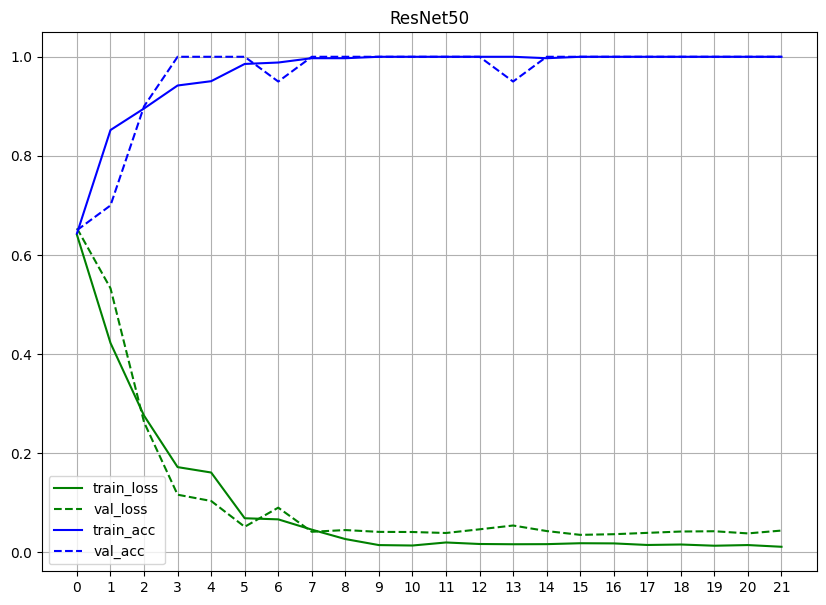

In [ ]:
plot_history(history_resnet50, 'ResNet50')

In [ ]:
history_resnet50.to_csv('history/full_train/resnet50.csv')

#### Train

In [ ]:
train_true_resnet50, train_pred_resnet50 = display_wrong_output(model_resnet50, train_loader)

True


  0%|          | 0/11 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       180
           1       1.00      1.00      1.00       165

    accuracy                           1.00       345
   macro avg       1.00      1.00      1.00       345
weighted avg       1.00      1.00      1.00       345



<Figure size 1500x900 with 0 Axes>

In [ ]:
train_acc_resnet50 = accuracy_score(train_true_resnet50, train_pred_resnet50)
train_acc_resnet50

1.0

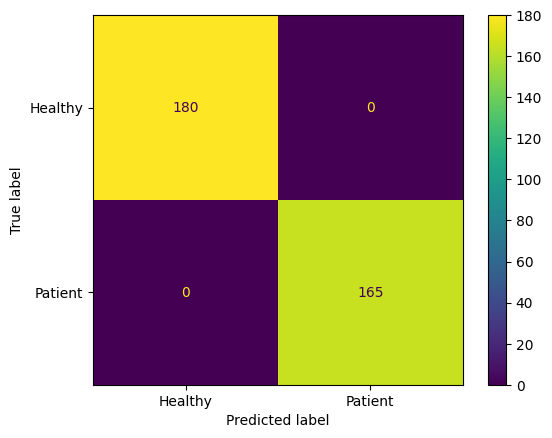

In [ ]:
display_confusionMatrix(train_true_resnet50, train_pred_resnet50)

#### Test

In [ ]:
test_true_resnet50, test_pred_resnet50 = display_wrong_output(model_resnet50, test_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



<Figure size 1500x900 with 0 Axes>

In [ ]:
test_acc_resnet50 = accuracy_score(test_true_resnet50, test_pred_resnet50)
test_acc_resnet50

1.0

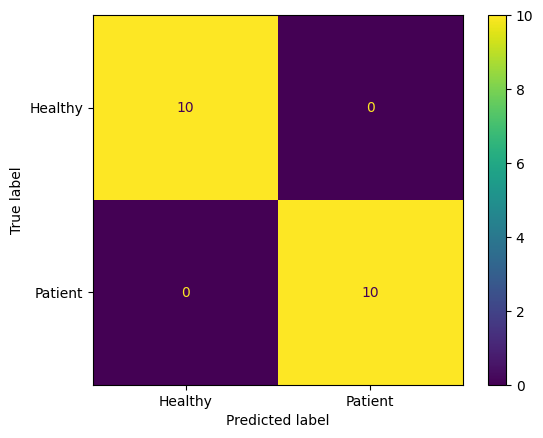

In [ ]:
display_confusionMatrix(test_true_resnet50, test_pred_resnet50)

### DenseNet121

In [ ]:
model_densenet121 = models.densenet121(weights = models.DenseNet121_Weights.IMAGENET1K_V1)
model_densenet121.classifier = nn.Linear(model_densenet121.classifier.in_features, num_classes)

optimizer_densenet121 = optim.SGD(model_densenet121.parameters(), lr=lr, momentum=momentum)
scheduler_densenet121 = optim.lr_scheduler.MultiStepLR(optimizer_densenet121, milestones=[10-1, 20-1], gamma=0.1)

In [ ]:
history_densenet121 = train_model(model_densenet121, train_loader, test_loader, criterion, optimizer_densenet121, epochs, patience, scheduler_densenet121, 'Checkpoints/full_train/densenet121.pth')

True


  0%|          | 0/11 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.6294935096865115, Val Loss: 0.5236999988555908, Train Acc: 0.6405797101449275, Val Acc: 0.8
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.34562920349231663, Val Loss: 0.3545728325843811, Train Acc: 0.8898550724637682, Val Acc: 0.8
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.24359927201184672, Val Loss: 0.26415368914604187, Train Acc: 0.8985507246376812, Val Acc: 0.9
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.15605470883673517, Val Loss: 0.10714609920978546, Train Acc: 0.9536231884057971, Val Acc: 0.95
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.12577953843966774, Val Loss: 0.0871993899345398, Train Acc: 0.9565217391304348, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.10805012454157291, Val Loss: 0.09071634709835052, Train Acc: 0.9594202898550724, Val Acc: 0.95

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.05448371431641821, Val Loss: 0.08608438819646835, Train Acc: 0.991304347826087, Val Acc: 0.95

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.037361318466887956, Val Loss: 0.09990603476762772, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.030173015022191448, Val Loss: 0.09335771203041077, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.023572930466869604, Val Loss: 0.09599138796329498, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.03436448497940665, Val Loss: 0.09091432392597198, Train Acc: 0.9971014492753624, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.025129135590100635, Val Loss: 0.08824685215950012, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.02642232734925937, Val Loss: 0.09310539066791534, Train Acc: 1.0, Val Acc: 0.95

lr = 0.0001
Early Stopping !!!


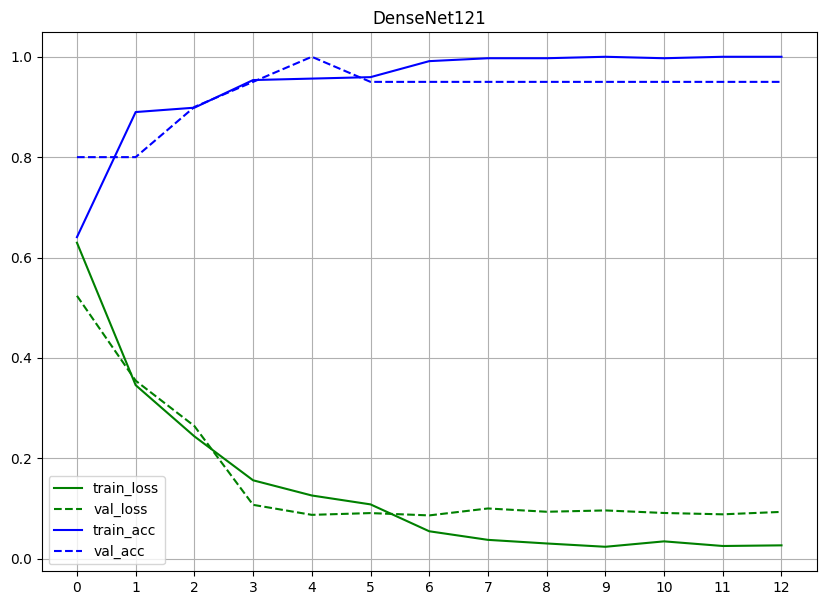

In [ ]:
plot_history(history_densenet121, 'DenseNet121')

In [ ]:
history_densenet121.to_csv('history/full_train/densenet121.csv')

#### Train

True


  0%|          | 0/11 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       180
           1       0.98      1.00      0.99       165

    accuracy                           0.99       345
   macro avg       0.99      0.99      0.99       345
weighted avg       0.99      0.99      0.99       345



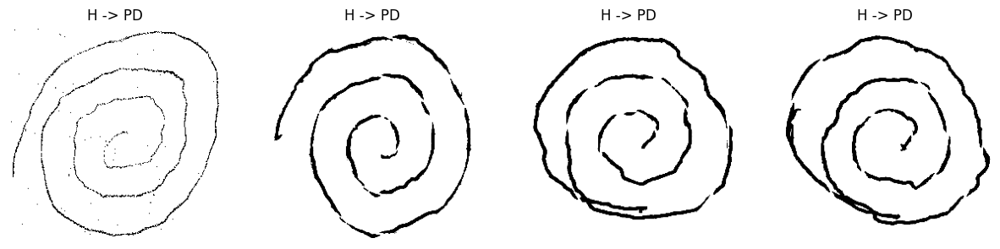

In [ ]:
train_true_densenet121, train_pred_densenet121 = display_wrong_output(model_densenet121, train_loader)

In [ ]:
train_acc_densenet121 = accuracy_score(train_true_densenet121, train_pred_densenet121)
train_acc_densenet121

0.9884057971014493

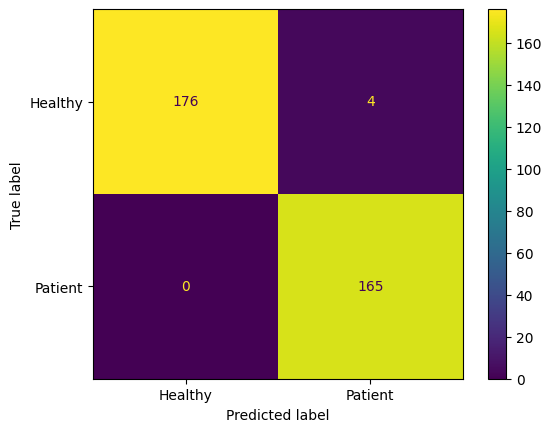

In [ ]:
display_confusionMatrix(train_true_densenet121, train_pred_densenet121)

#### Test

In [ ]:
test_true_densenet121, test_pred_densenet121 = display_wrong_output(model_densenet121, test_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



<Figure size 1500x900 with 0 Axes>

In [ ]:
test_acc_densenet121 = accuracy_score(test_true_densenet121, test_pred_densenet121)
test_acc_densenet121

1.0

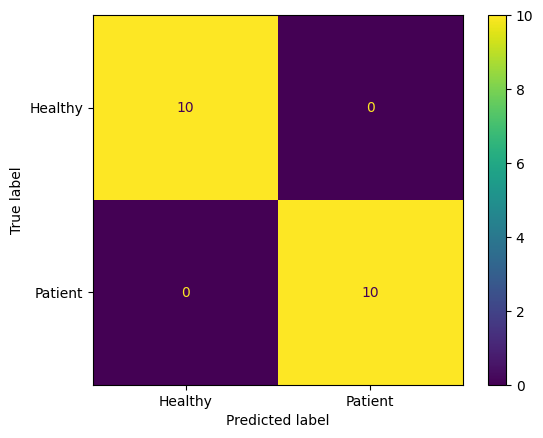

In [ ]:
display_confusionMatrix(test_true_densenet121, test_pred_densenet121)

### DenseNet201

In [ ]:
model_densenet201 = models.densenet201(weights = models.DenseNet201_Weights.IMAGENET1K_V1)
model_densenet201.classifier = nn.Linear(model_densenet201.classifier.in_features, num_classes)

optimizer_densenet201 = optim.SGD(model_densenet201.parameters(), lr=lr, momentum=momentum)
scheduler_densenet201 = optim.lr_scheduler.MultiStepLR(optimizer_densenet201, milestones=[10-1, 20-1], gamma=0.1)

In [ ]:
history_densenet201 = train_model(model_densenet201, train_loader, test_loader, criterion, optimizer_densenet201, epochs, patience, scheduler_densenet201, 'Checkpoints/full_train/densenet201.pth')

True


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.5812518495580424, Val Loss: 0.6377031207084656, Train Acc: 0.7304347826086957, Val Acc: 0.6
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.3423993466556936, Val Loss: 0.3944069743156433, Train Acc: 0.8927536231884058, Val Acc: 0.85
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.2190491878899975, Val Loss: 0.29063597321510315, Train Acc: 0.9188405797101449, Val Acc: 0.85
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.1477421518145264, Val Loss: 0.13968676328659058, Train Acc: 0.9536231884057971, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.10667394611282625, Val Loss: 0.09390445053577423, Train Acc: 0.9739130434782609, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.0900827817618847, Val Loss: 0.07902844250202179, Train Acc: 0.9797101449275363, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.05521886651066766, Val Loss: 0.05165446549654007, Train Acc: 0.9855072463768116, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.04458290911887003, Val Loss: 0.06089034676551819, Train Acc: 0.9855072463768116, Val Acc: 1.0

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.036053546010584074, Val Loss: 0.03788723424077034, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.028627148756514426, Val Loss: 0.03295794874429703, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.038597689868639345, Val Loss: 0.02905450202524662, Train Acc: 0.9884057971014493, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.023416349000256995, Val Loss: 0.028863633051514626, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.02457935143046189, Val Loss: 0.028889024630188942, Train Acc: 0.9971014492753624, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.021146105132673097, Val Loss: 0.02919979766011238, Train Acc: 0.9971014492753624, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.024696031660921332, Val Loss: 0.02728908695280552, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.023840490912181742, Val Loss: 0.02667192742228508, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.027677369959976363, Val Loss: 0.026463931426405907, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.02498678125279105, Val Loss: 0.027081981301307678, Train Acc: 0.9971014492753624, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.028676770012015882, Val Loss: 0.02590288780629635, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.02282411634274151, Val Loss: 0.02662099525332451, Train Acc: 0.9971014492753624, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.021691953358442886, Val Loss: 0.026334848254919052, Train Acc: 0.9942028985507246, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.024830931749032892, Val Loss: 0.02617809735238552, Train Acc: 0.9971014492753624, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.02254994033795336, Val Loss: 0.026823606342077255, Train Acc: 1.0, Val Acc: 1.0
update

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.03429192214448383, Val Loss: 0.027703478932380676, Train Acc: 0.9884057971014493, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.021445771673883215, Val Loss: 0.02693045698106289, Train Acc: 1.0, Val Acc: 1.0

lr = 1e-05
Early Stopping !!!


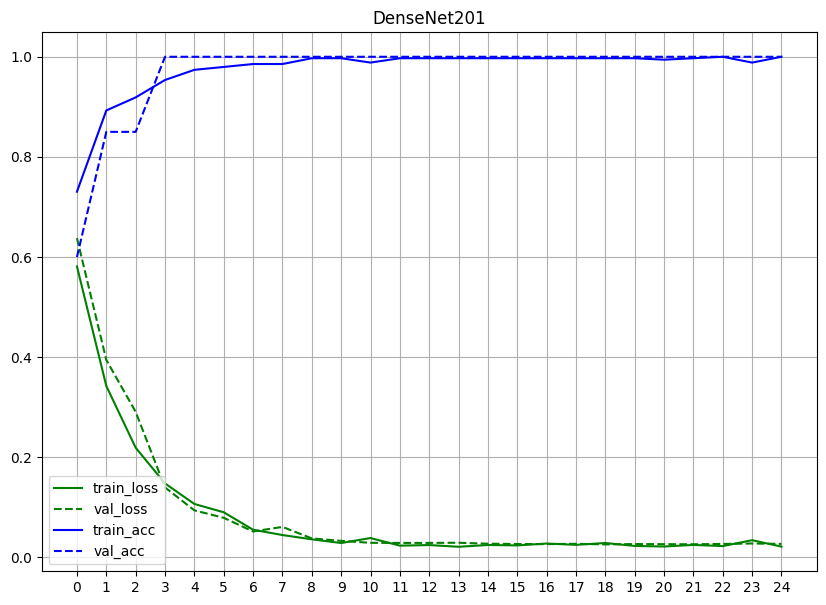

In [ ]:
plot_history(history_densenet201, 'DenseNet201')

In [ ]:
history_densenet201.to_csv('history/full_train/densenet201.csv')

#### Train

True


  0%|          | 0/11 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       180
           1       0.99      1.00      1.00       165

    accuracy                           1.00       345
   macro avg       1.00      1.00      1.00       345
weighted avg       1.00      1.00      1.00       345



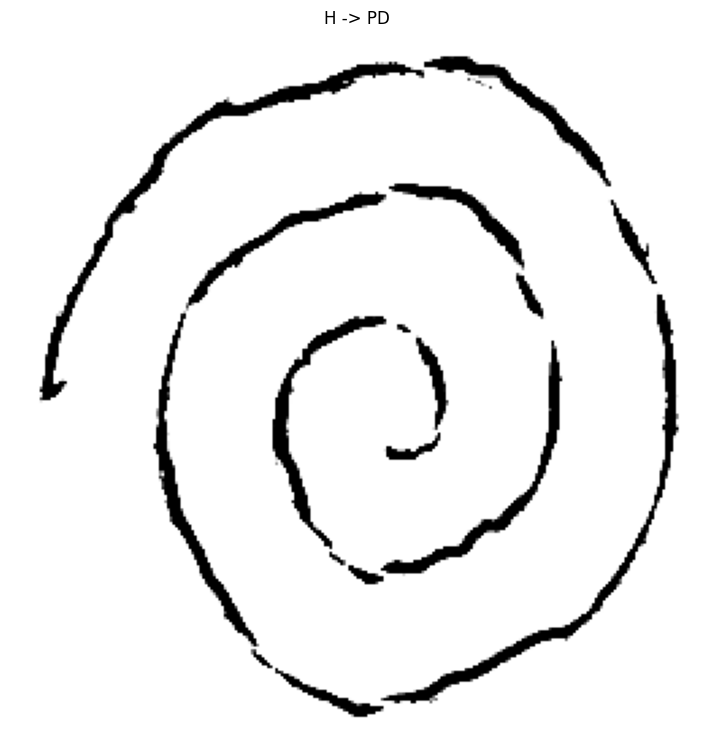

In [ ]:
train_true_densenet201, train_pred_densenet201 = display_wrong_output(model_densenet201, train_loader)

In [ ]:
train_acc_densenet201 = accuracy_score(train_true_densenet201, train_pred_densenet201)
train_acc_densenet201

0.9971014492753624

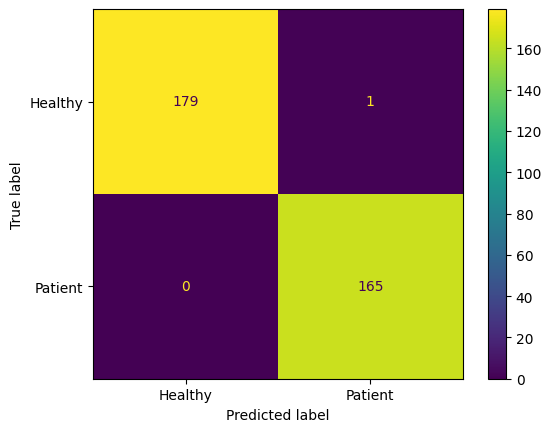

In [ ]:
display_confusionMatrix(train_true_densenet201, train_pred_densenet201)

#### Test

In [ ]:
test_true_densenet201, test_pred_densenet201 = display_wrong_output(model_densenet201, test_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



<Figure size 1500x900 with 0 Axes>

In [ ]:
test_acc_densenet201 = accuracy_score(test_true_densenet201, test_pred_densenet201)
test_acc_densenet201

1.0

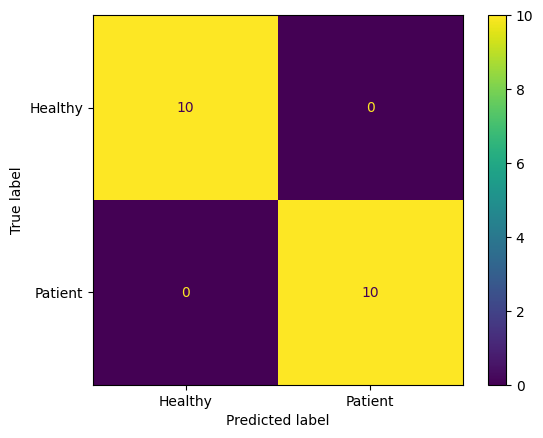

In [ ]:
display_confusionMatrix(test_true_densenet201, test_pred_densenet201)

### VGG16

In [ ]:
model_vgg16 = models.vgg16(weights = models.VGG16_Weights.IMAGENET1K_V1)
model_vgg16.classifier[6] = nn.Linear(model_vgg16.classifier[6].in_features, num_classes)

optimizer_vgg16 = optim.SGD(model_vgg16.parameters(), lr=lr, momentum=momentum)
scheduler_vgg16 = optim.lr_scheduler.MultiStepLR(optimizer_vgg16, milestones=[10-1, 20-1], gamma=0.1)

In [ ]:
history_vgg16 = train_model(model_vgg16, train_loader, test_loader, criterion, optimizer_vgg16, epochs, patience, scheduler_vgg16, 'Checkpoints/full_train/vgg16.pth')

True


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1/30 - Train Loss: 0.646141370223916, Val Loss: 0.7330443263053894, Train Acc: 0.6, Val Acc: 0.55
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 2/30 - Train Loss: 0.4830294488996699, Val Loss: 0.5703725218772888, Train Acc: 0.8057971014492754, Val Acc: 0.65
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 3/30 - Train Loss: 0.35916388972082, Val Loss: 0.44700995087623596, Train Acc: 0.8463768115942029, Val Acc: 0.7
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 4/30 - Train Loss: 0.22546082663795222, Val Loss: 0.2983350455760956, Train Acc: 0.927536231884058, Val Acc: 0.9
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 5/30 - Train Loss: 0.29457182162913725, Val Loss: 0.2318660020828247, Train Acc: 0.8782608695652174, Val Acc: 0.95
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 6/30 - Train Loss: 0.2587530776210453, Val Loss: 0.3778534531593323, Train Acc: 0.8956521739130435, Val Acc: 0.75

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 7/30 - Train Loss: 0.21242381783499234, Val Loss: 0.12966284155845642, Train Acc: 0.9159420289855073, Val Acc: 0.95
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 8/30 - Train Loss: 0.12230107329137947, Val Loss: 0.11070171743631363, Train Acc: 0.9652173913043478, Val Acc: 1.0
update

lr = 0.001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 9/30 - Train Loss: 0.09016510188795518, Val Loss: 0.14032883942127228, Train Acc: 0.9739130434782609, Val Acc: 0.9

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 10/30 - Train Loss: 0.050655443920497444, Val Loss: 0.09135031700134277, Train Acc: 0.9797101449275363, Val Acc: 0.95

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 11/30 - Train Loss: 0.043441627069335916, Val Loss: 0.07386716455221176, Train Acc: 0.9855072463768116, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 12/30 - Train Loss: 0.043840529656280644, Val Loss: 0.07265464961528778, Train Acc: 0.9855072463768116, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 13/30 - Train Loss: 0.038492501149142995, Val Loss: 0.0682530552148819, Train Acc: 0.9855072463768116, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 14/30 - Train Loss: 0.0319329924935448, Val Loss: 0.06712310761213303, Train Acc: 0.9855072463768116, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 15/30 - Train Loss: 0.046641159543524616, Val Loss: 0.06682159006595612, Train Acc: 0.9826086956521739, Val Acc: 1.0

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 16/30 - Train Loss: 0.0313667933686056, Val Loss: 0.0645551010966301, Train Acc: 0.991304347826087, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 17/30 - Train Loss: 0.026088760026555132, Val Loss: 0.06485967338085175, Train Acc: 0.9942028985507246, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 18/30 - Train Loss: 0.02539614129649556, Val Loss: 0.06184696406126022, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 0.0001


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 19/30 - Train Loss: 0.022806938303013644, Val Loss: 0.06179702281951904, Train Acc: 0.991304347826087, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 20/30 - Train Loss: 0.026379288411766722, Val Loss: 0.061609573662281036, Train Acc: 0.9942028985507246, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 21/30 - Train Loss: 0.019622163123626638, Val Loss: 0.06164895370602608, Train Acc: 0.9971014492753624, Val Acc: 1.0
update

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 22/30 - Train Loss: 0.023083495256909427, Val Loss: 0.06212269142270088, Train Acc: 0.9942028985507246, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 23/30 - Train Loss: 0.023134514932399212, Val Loss: 0.06201537325978279, Train Acc: 0.9942028985507246, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 24/30 - Train Loss: 0.019457935058660267, Val Loss: 0.06155376881361008, Train Acc: 1.0, Val Acc: 1.0
update

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 25/30 - Train Loss: 0.02555048202258953, Val Loss: 0.060465406626462936, Train Acc: 0.9942028985507246, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 26/30 - Train Loss: 0.017146158531524132, Val Loss: 0.06091708689928055, Train Acc: 1.0, Val Acc: 1.0
update

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 27/30 - Train Loss: 0.020915607727416182, Val Loss: 0.060935962945222855, Train Acc: 0.991304347826087, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 28/30 - Train Loss: 0.023413111436842146, Val Loss: 0.0614766851067543, Train Acc: 0.9884057971014493, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 29/30 - Train Loss: 0.02471670001151337, Val Loss: 0.06181633472442627, Train Acc: 0.991304347826087, Val Acc: 1.0

lr = 1e-05


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 30/30 - Train Loss: 0.022061750244187273, Val Loss: 0.061914682388305664, Train Acc: 0.9942028985507246, Val Acc: 1.0

lr = 1e-05


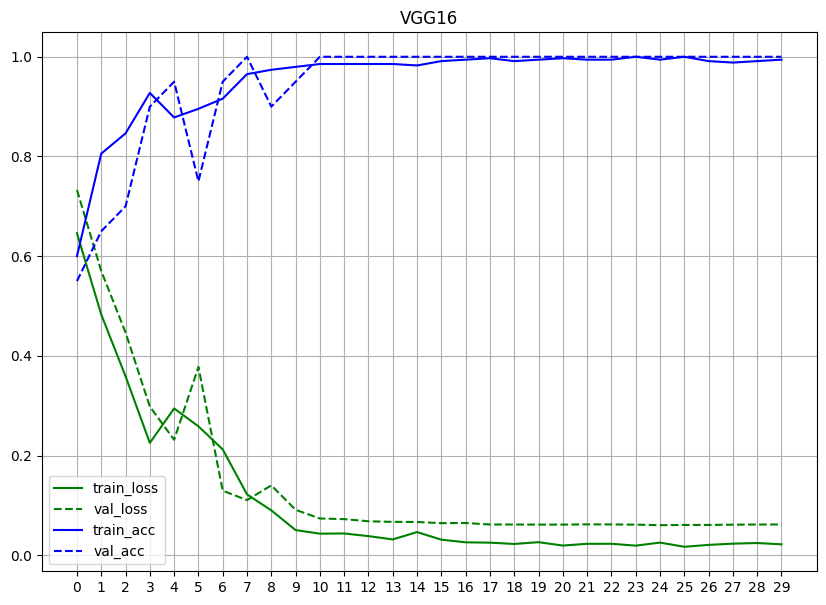

In [ ]:
plot_history(history_vgg16, 'VGG16')

In [ ]:
history_vgg16.to_csv('history/full_train/vgg16.csv')

#### Train

True


  0%|          | 0/11 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       180
           1       0.99      1.00      1.00       165

    accuracy                           1.00       345
   macro avg       1.00      1.00      1.00       345
weighted avg       1.00      1.00      1.00       345



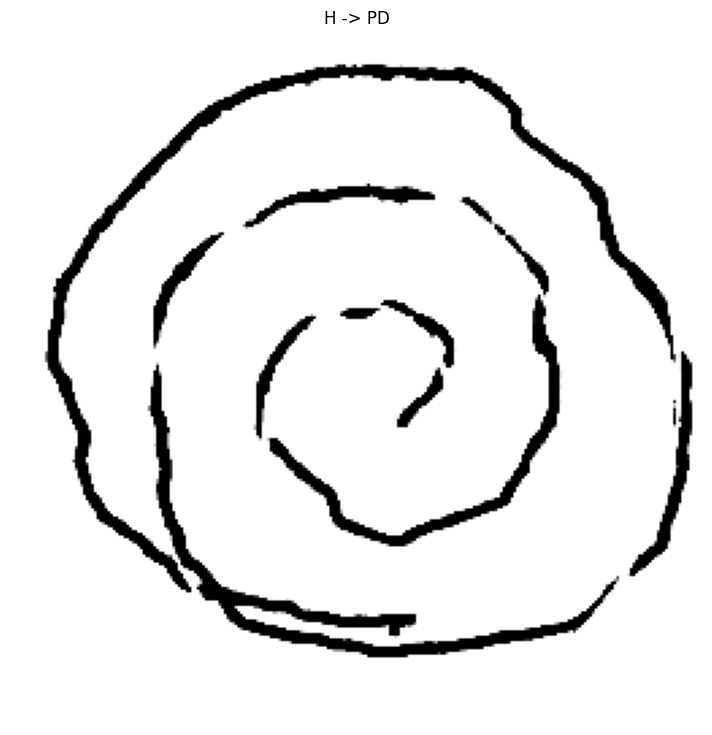

In [ ]:
train_true_vgg16, train_pred_vgg16 = display_wrong_output(model_vgg16, train_loader)

In [ ]:
train_acc_vgg16 = accuracy_score(train_true_vgg16, train_pred_vgg16)
train_acc_vgg16

0.9971014492753624

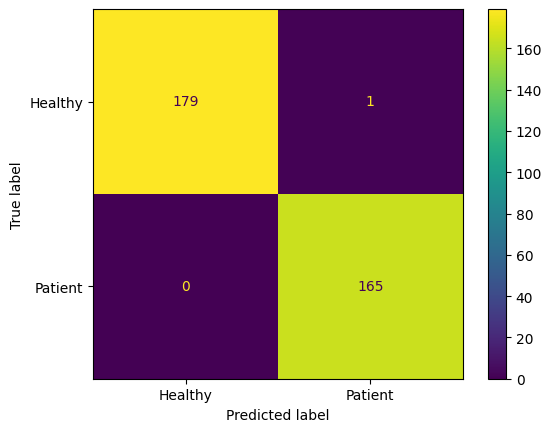

In [ ]:
display_confusionMatrix(train_true_vgg16, train_pred_vgg16)

#### Test

In [ ]:
test_true_vgg16, test_pred_vgg16 = display_wrong_output(model_vgg16, test_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



<Figure size 1500x900 with 0 Axes>

In [ ]:
test_acc_vgg16 = accuracy_score(test_true_vgg16, test_pred_vgg16)
test_acc_vgg16

1.0

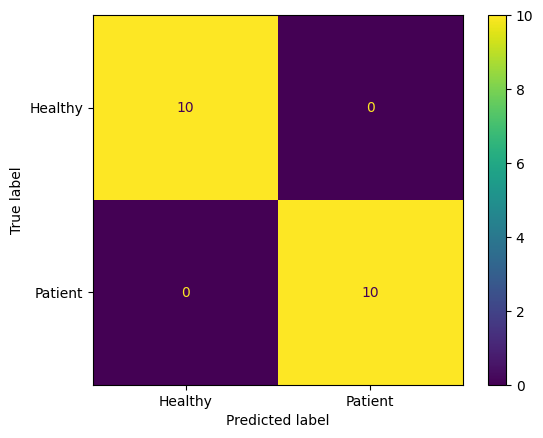

In [ ]:
display_confusionMatrix(test_true_vgg16, test_pred_vgg16)

## Compare

In [ ]:
summaries_full_train = {
    'ResNet18' : [train_acc_resnet18, test_acc_resnet18],
    'ResNet34' : [train_acc_resnet34, test_acc_resnet34],
    'ResNet50' : [train_acc_resnet50, test_acc_resnet50],
    'DenseNet121' : [train_acc_densenet121, test_acc_densenet121],
    'DenseNet201' : [train_acc_densenet201, test_acc_densenet201],
    'VGG16' : [train_acc_vgg16, test_acc_vgg16]
}

summaries_full_train

{'ResNet18': [1.0, 1.0],
 'ResNet34': [0.9797101449275363, 1.0],
 'ResNet50': [1.0, 1.0],
 'DenseNet121': [0.9884057971014493, 1.0],
 'DenseNet201': [0.9971014492753624, 1.0],
 'VGG16': [0.9971014492753624, 1.0]}

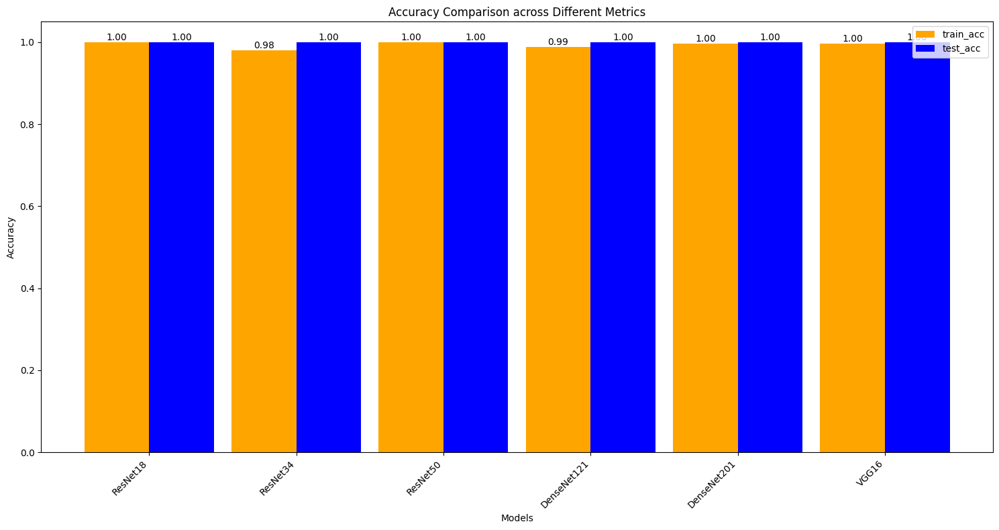

In [ ]:
plot_accuracy_comparison(summaries_full_train, ['train_acc', 'test_acc'], ['orange', 'blue'])

# Evaluate with Custom Test Set

## Get Custom-test root

In [ ]:
custom_root = 'Parkinson-SpiralDrawing/Dataset/Custom-Data'

In [ ]:
test_root, my_root = glob(f"{custom_root}/*")

if 'my' in test_root: test_root, my_root = my_root, test_root

print(f"test_root: {test_root}")
print(f"my_root: {my_root}")

test_root: Parkinson-SpiralDrawing/Dataset/Custom-Data/test-set
my_root: Parkinson-SpiralDrawing/Dataset/Custom-Data/my


In [ ]:
test_draw_root, test_degrade_root = glob(f"{test_root}/*")

if 'degrade' in test_draw_root: test_draw_root, test_degrade_root = test_degrade_root, test_draw_root

print(f"test_draw_root: {test_draw_root}")
print(f"test_degrade_root: {test_degrade_root}")

test_draw_root: Parkinson-SpiralDrawing/Dataset/Custom-Data/test-set/draw
test_degrade_root: Parkinson-SpiralDrawing/Dataset/Custom-Data/test-set/degrade


In [ ]:
my_draw_root, my_degrade_root = glob(f"{my_root}/*")

if 'degrade' in my_draw_root: my_draw_root, my_degrade_root = my_degrade_root, my_draw_root

print(f"my_draw_root: {my_draw_root}")
print(f"my_degrade_root: {my_degrade_root}")

my_draw_root: Parkinson-SpiralDrawing/Dataset/Custom-Data/my/draw
my_degrade_root: Parkinson-SpiralDrawing/Dataset/Custom-Data/my/degrade


## DataLoader

In [ ]:
batch_size = 32

In [ ]:
test_draw_data = datasets.ImageFolder(test_draw_root, transform=transform)
test_degrade_data = datasets.ImageFolder(test_degrade_root, transform=transform)

my_draw_data = datasets.ImageFolder(my_draw_root, transform=transform)
my_degrade_data = datasets.ImageFolder(my_degrade_root, transform=transform)

In [ ]:
test_draw_loader = DataLoader(test_draw_data, batch_size=batch_size, shuffle=True)
test_degrade_loader = DataLoader(test_degrade_data, batch_size=batch_size, shuffle=True)

my_draw_loader = DataLoader(my_draw_data, batch_size=batch_size, shuffle=True)
my_degrade_loader = DataLoader(my_degrade_data, batch_size=batch_size, shuffle=True)

In [ ]:
test_draw_loader.dataset, test_degrade_loader.dataset, my_draw_loader.dataset, my_degrade_loader.dataset

(Dataset ImageFolder
     Number of datapoints: 20
     Root location: Parkinson-SpiralDrawing/Dataset/Custom-Data/test-set/draw
     StandardTransform
 Transform: Compose(
                Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
                Grayscale(num_output_channels=3)
                ToTensor()
                Normalize(mean=[0.485, 0.485, 0.485], std=[0.229, 0.229, 0.229])
            ),
 Dataset ImageFolder
     Number of datapoints: 20
     Root location: Parkinson-SpiralDrawing/Dataset/Custom-Data/test-set/degrade
     StandardTransform
 Transform: Compose(
                Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
                Grayscale(num_output_channels=3)
                ToTensor()
                Normalize(mean=[0.485, 0.485, 0.485], std=[0.229, 0.229, 0.229])
            ),
 Dataset ImageFolder
     Number of datapoints: 21
     Root location: Parkinson-SpiralDrawing/Dataset/Custom-Data/my

In [ ]:
test_dataset = datasets.ImageFolder('/content/Parkinson-SpiralDrawing/Dataset/Data/test', transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
img = test_degrade_loader.dataset[0][0]
img.shape

torch.Size([3, 256, 256])

## Test

### Draw

#### ResNet18

In [ ]:
test_draw_resnet18, test_draw_resnet18_pred = predicts(model_resnet18, test_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.50      1.00      0.67        10

    accuracy                           0.50        20
   macro avg       0.25      0.50      0.33        20
weighted avg       0.25      0.50      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
test_draw_resnet18_acc = accuracy_score(test_draw_resnet18, test_draw_resnet18_pred)
test_draw_resnet18_precision = precision_score(test_draw_resnet18, test_draw_resnet18_pred)
test_draw_resnet18_acc, test_draw_resnet18_precision

(0.5, 0.5)

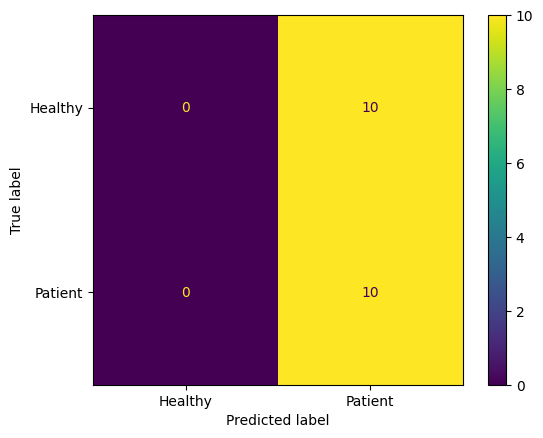

In [ ]:
display_confusionMatrix(test_draw_resnet18, test_draw_resnet18_pred)

#### ResNet34

In [ ]:
test_draw_resnet34, test_draw_resnet34_pred = predicts(model_resnet34, test_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.50      1.00      0.67        10

    accuracy                           0.50        20
   macro avg       0.25      0.50      0.33        20
weighted avg       0.25      0.50      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
test_draw_resnet34_acc = accuracy_score(test_draw_resnet34, test_draw_resnet34_pred)
test_draw_resnet34_precision = precision_score(test_draw_resnet34, test_draw_resnet34_pred)
test_draw_resnet34_acc, test_draw_resnet34_precision

(0.5, 0.5)

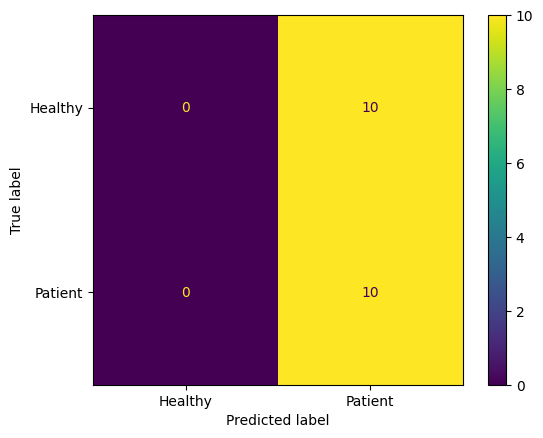

In [ ]:
display_confusionMatrix(test_draw_resnet34, test_draw_resnet34_pred)

#### ResNet50

In [ ]:
test_draw_resnet50, test_draw_resnet50_pred = predicts(model_resnet50, test_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.50      1.00      0.67        10

    accuracy                           0.50        20
   macro avg       0.25      0.50      0.33        20
weighted avg       0.25      0.50      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
test_draw_resnet50_acc = accuracy_score(test_draw_resnet50, test_draw_resnet50_pred)
test_draw_resnet50_precision = precision_score(test_draw_resnet50, test_draw_resnet50_pred)
test_draw_resnet50_acc, test_draw_resnet50_precision

(0.5, 0.5)

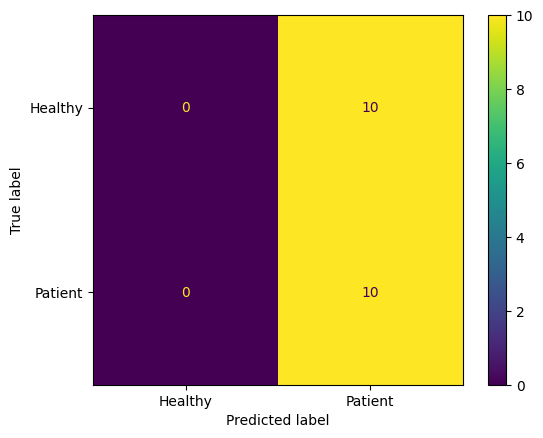

In [ ]:
display_confusionMatrix(test_draw_resnet50, test_draw_resnet50_pred)

#### DenseNet121

In [ ]:
test_draw_densenet121_true, test_draw_densenet121_pred = predicts(model_densenet121, test_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.50      1.00      0.67        10

    accuracy                           0.50        20
   macro avg       0.25      0.50      0.33        20
weighted avg       0.25      0.50      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
test_draw_densenet121_acc = accuracy_score(test_draw_densenet121_true, test_draw_densenet121_pred)
test_draw_densenet121_precision = precision_score(test_draw_densenet121_true, test_draw_densenet121_pred)
test_draw_densenet121_acc, test_draw_densenet121_precision

(0.5, 0.5)

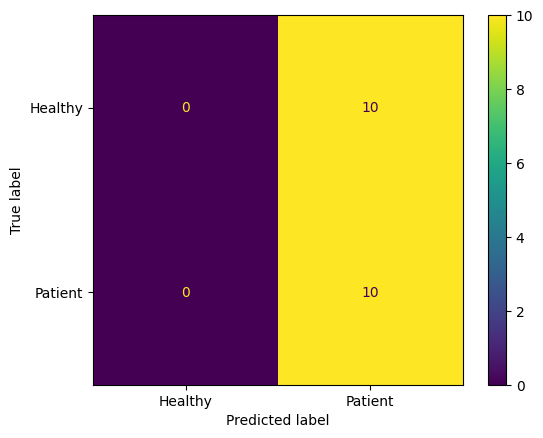

In [ ]:
display_confusionMatrix(test_draw_densenet121_true, test_draw_densenet121_pred)

#### DenseNet201

In [ ]:
test_draw_densenet201_true, test_draw_densenet201_pred = predicts(model_densenet201, test_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.50      1.00      0.67        10

    accuracy                           0.50        20
   macro avg       0.25      0.50      0.33        20
weighted avg       0.25      0.50      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
test_draw_densenet201_acc = accuracy_score(test_draw_densenet201_true, test_draw_densenet201_pred)
test_draw_densenet201_precision = precision_score(test_draw_densenet201_true, test_draw_densenet201_pred)
test_draw_densenet201_acc, test_draw_densenet201_precision

(0.5, 0.5)

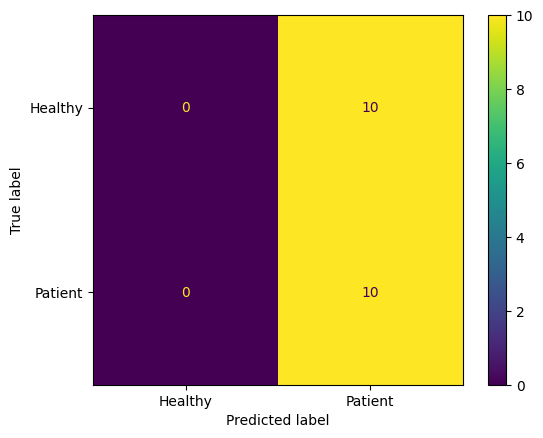

In [ ]:
display_confusionMatrix(test_draw_densenet201_true, test_draw_densenet201_pred)

#### VGG16

In [ ]:
test_draw_vgg16_true, test_draw_vgg16_pred = predicts(model_vgg16, test_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.33      0.10      0.15        10
           1       0.47      0.80      0.59        10

    accuracy                           0.45        20
   macro avg       0.40      0.45      0.37        20
weighted avg       0.40      0.45      0.37        20



In [ ]:
test_draw_vgg16_acc = accuracy_score(test_draw_vgg16_true, test_draw_vgg16_pred)
test_draw_vgg16_precision = precision_score(test_draw_vgg16_true, test_draw_vgg16_pred)
test_draw_vgg16_acc, test_draw_vgg16_precision

(0.45, 0.47058823529411764)

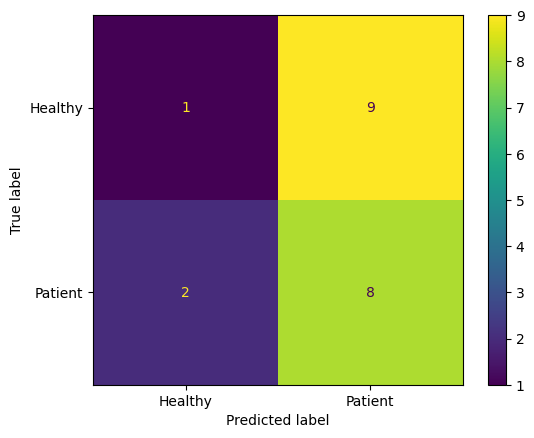

In [ ]:
display_confusionMatrix(test_draw_vgg16_true, test_draw_vgg16_pred)

### Degrade

#### ResNet18

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.67      0.20      0.31        10
           1       0.53      0.90      0.67        10

    accuracy                           0.55        20
   macro avg       0.60      0.55      0.49        20
weighted avg       0.60      0.55      0.49        20



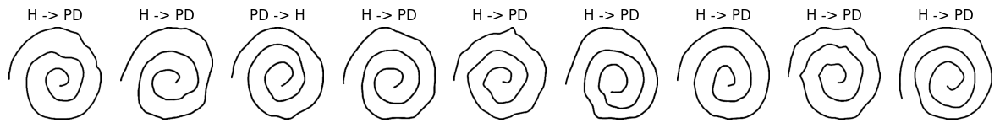

In [ ]:
test_degrade_resnet18_true, test_degrade_resnet18_pred = display_wrong_output(model_resnet18, test_degrade_loader)

In [ ]:
test_degrade_resnet18_acc = accuracy_score(test_degrade_resnet18_true, test_degrade_resnet18_pred)
test_degrade_resnet18_precision = precision_score(test_degrade_resnet18_true, test_degrade_resnet18_pred)
test_degrade_resnet18_acc

0.55

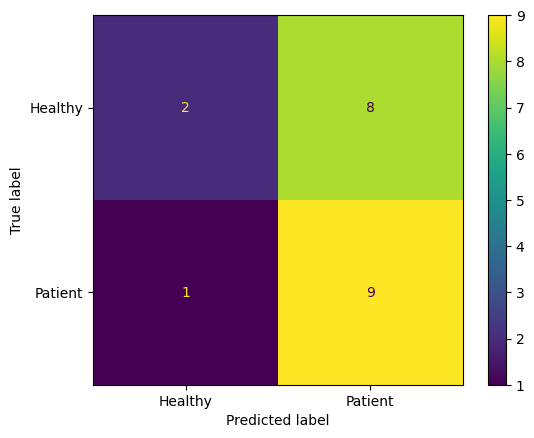

In [ ]:
display_confusionMatrix(test_degrade_resnet18_true, test_degrade_resnet18_pred)

#### ResNet34

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.10      0.18        10
           1       0.53      1.00      0.69        10

    accuracy                           0.55        20
   macro avg       0.76      0.55      0.44        20
weighted avg       0.76      0.55      0.44        20



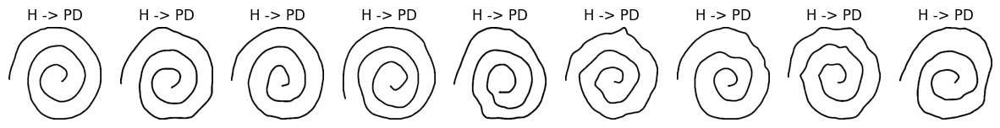

In [ ]:
test_degrade_resnet34_true, test_degrade_resnet34_pred = display_wrong_output(model_resnet34, test_degrade_loader)

In [ ]:
test_degrade_resnet34_acc = accuracy_score(test_degrade_resnet34_true, test_degrade_resnet34_pred)
test_degrade_resnet34_precision = precision_score(test_degrade_resnet34_true, test_degrade_resnet34_pred)
test_degrade_resnet34_acc, test_degrade_resnet34_precision

(0.55, 0.5263157894736842)

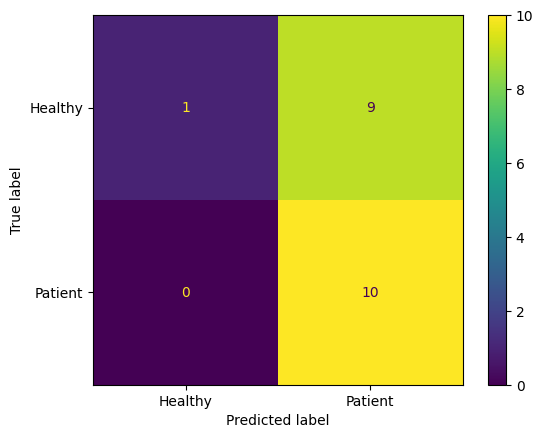

In [ ]:
display_confusionMatrix(test_degrade_resnet34_true, test_degrade_resnet34_pred)

#### ResNet50

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.10      0.18        10
           1       0.53      1.00      0.69        10

    accuracy                           0.55        20
   macro avg       0.76      0.55      0.44        20
weighted avg       0.76      0.55      0.44        20



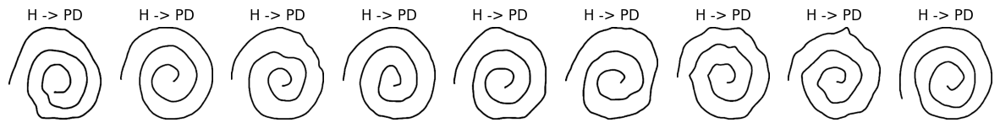

In [ ]:
test_degrade_resnet50_true, test_degrade_resnet50_pred = display_wrong_output(model_resnet50, test_degrade_loader)

In [ ]:
test_degrade_resnet50_acc = accuracy_score(test_degrade_resnet50_true, test_degrade_resnet50_pred)
test_degrade_resnet50_precision = precision_score(test_degrade_resnet50_true, test_degrade_resnet50_pred)
test_degrade_resnet50_acc, test_degrade_resnet50_precision

(0.55, 0.5263157894736842)

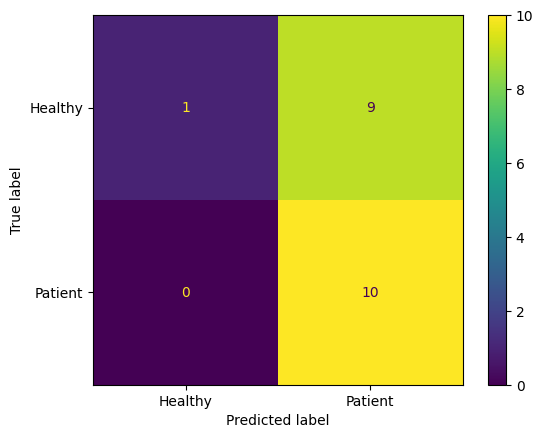

In [ ]:
display_confusionMatrix(test_degrade_resnet50_true, test_degrade_resnet50_pred)

#### DenseNet121

True


  0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.50      1.00      0.67        10

    accuracy                           0.50        20
   macro avg       0.25      0.50      0.33        20
weighted avg       0.25      0.50      0.33        20



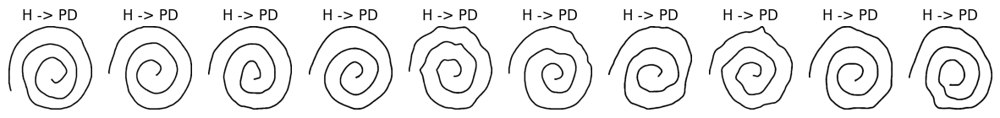

In [ ]:
test_degrade_densenet121_true, test_degrade_densenet121_pred = display_wrong_output(model_densenet121, test_degrade_loader)

In [ ]:
test_degrade_densenet121_acc = accuracy_score(test_degrade_densenet121_true, test_degrade_densenet121_pred)
test_degrade_densenet121_precision = precision_score(test_degrade_densenet121_true, test_degrade_densenet121_pred)
test_degrade_densenet121_acc, test_degrade_densenet121_precision

(0.5, 0.5)

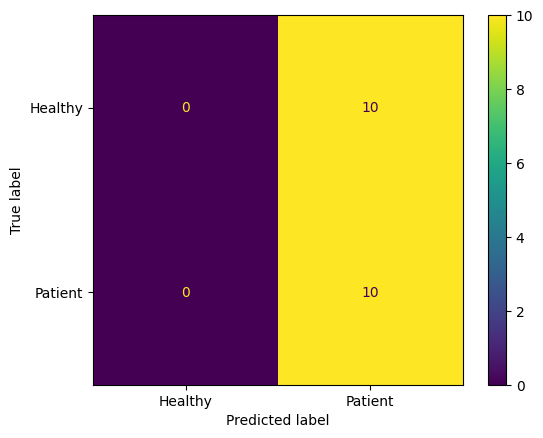

In [ ]:
display_confusionMatrix(test_degrade_densenet121_true, test_degrade_densenet121_pred)

#### DenseNet201

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.40      0.57        10
           1       0.62      1.00      0.77        10

    accuracy                           0.70        20
   macro avg       0.81      0.70      0.67        20
weighted avg       0.81      0.70      0.67        20



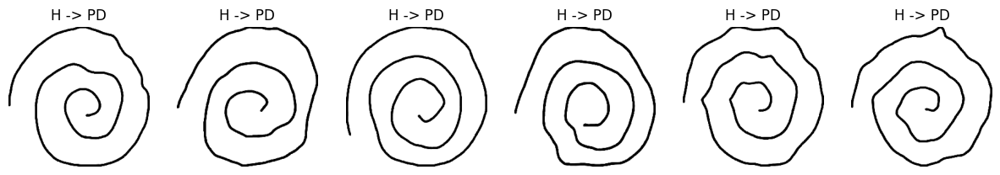

In [ ]:
test_degrade_densenet201_true, test_degrade_densenet201_pred = display_wrong_output(model_densenet201, test_degrade_loader)

In [ ]:
test_degrade_densenet201_acc = accuracy_score(test_degrade_densenet201_true, test_degrade_densenet201_pred)
test_degrade_densenet201_precision = precision_score(test_degrade_densenet201_true, test_degrade_densenet201_pred)
test_degrade_densenet201_acc, test_degrade_densenet201_precision

(0.7, 0.625)

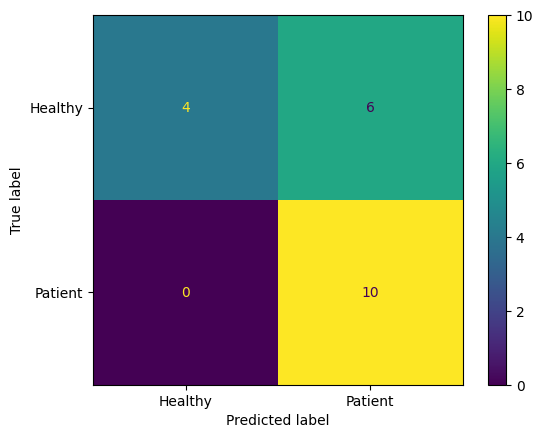

In [ ]:
display_confusionMatrix(test_degrade_densenet201_true, test_degrade_densenet201_pred)

#### VGG16

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.67      0.60      0.63        10
           1       0.64      0.70      0.67        10

    accuracy                           0.65        20
   macro avg       0.65      0.65      0.65        20
weighted avg       0.65      0.65      0.65        20



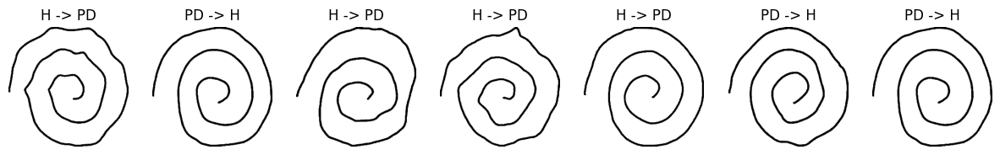

In [ ]:
test_degrade_vgg16_true, test_degrade_vgg16_pred = display_wrong_output(model_vgg16, test_degrade_loader)

In [ ]:
test_degrade_vgg16_acc = accuracy_score(test_degrade_vgg16_true, test_degrade_vgg16_pred)
test_degrade_vgg16_precision = precision_score(test_degrade_vgg16_true, test_degrade_vgg16_pred)
test_degrade_vgg16_acc, test_degrade_vgg16_precision

(0.65, 0.6363636363636364)

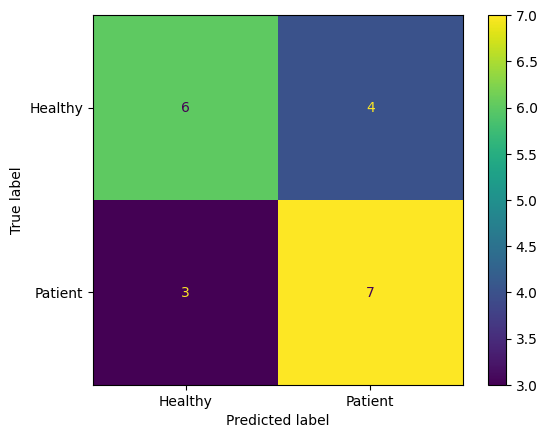

In [ ]:
display_confusionMatrix(test_degrade_vgg16_true, test_degrade_vgg16_pred)

### Compare

In [ ]:
summaries_test_draw_degrade = {
    'ResNet18' : [test_acc_resnet18, test_draw_resnet18_acc, test_degrade_resnet18_acc],
    'ResNet34' : [test_acc_resnet34, test_draw_resnet34_acc, test_degrade_resnet34_acc],
    'ResNet50' : [test_acc_resnet50, test_draw_resnet50_acc, test_degrade_resnet50_acc],
    'DenseNet121' : [test_acc_densenet121, test_draw_densenet121_acc, test_degrade_densenet121_acc],
    'DenseNet201' : [test_acc_densenet201, test_draw_densenet201_acc, test_degrade_densenet201_acc],
    'VGG16' : [test_acc_vgg16, test_draw_vgg16_acc, test_degrade_vgg16_acc]
}

summaries_test_draw_degrade

{'ResNet18': [1.0, 0.5, 0.55],
 'ResNet34': [1.0, 0.5, 0.55],
 'ResNet50': [1.0, 0.5, 0.55],
 'DenseNet121': [1.0, 0.5, 0.5],
 'DenseNet201': [1.0, 0.5, 0.7],
 'VGG16': [1.0, 0.45, 0.65]}

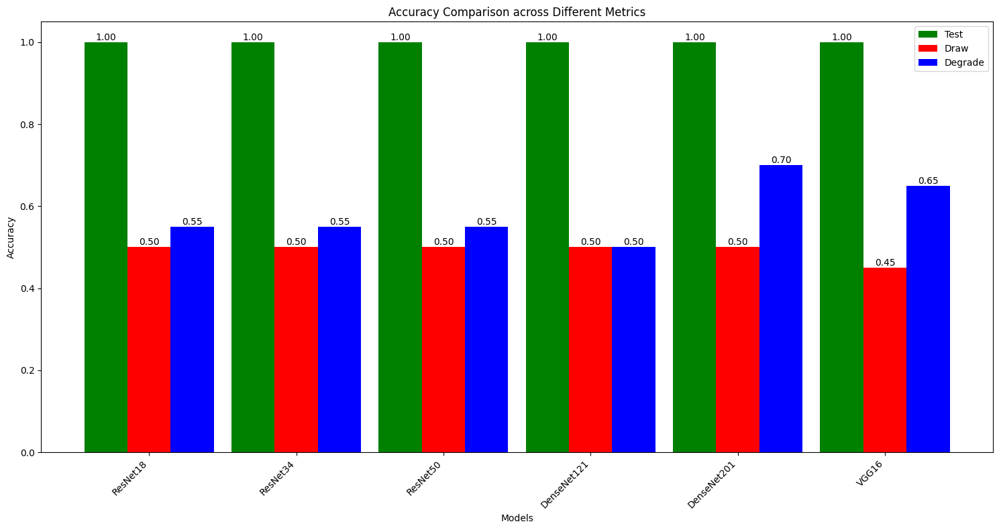

In [ ]:
plot_accuracy_comparison(summaries_test_draw_degrade, ['Test', 'Draw', 'Degrade'] , ['green' ,'red' , 'blue'])

## My

### Draw

#### ResNet18

In [ ]:
my_draw_resnet18_true, my_draw_resnet18_pred = predicts(model_resnet18, my_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.20      0.33        20
           1       0.06      1.00      0.11         1

    accuracy                           0.24        21
   macro avg       0.53      0.60      0.22        21
weighted avg       0.96      0.24      0.32        21



In [ ]:
my_draw_resnet18_acc, my_draw_resnet18_precision = accuracy_score(my_draw_resnet18_true, my_draw_resnet18_pred), precision_score(my_draw_resnet18_true, my_draw_resnet18_pred)
my_draw_resnet18_acc, my_draw_resnet18_precision

(0.23809523809523808, 0.058823529411764705)

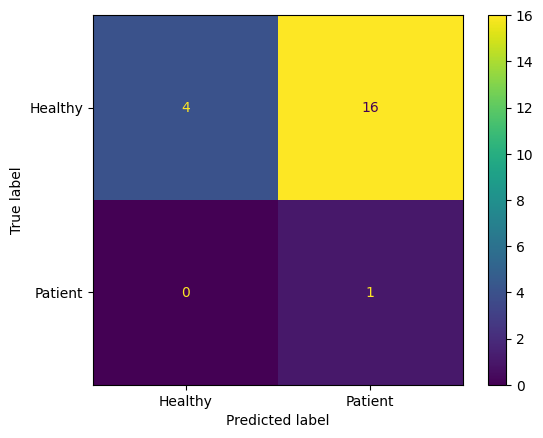

In [ ]:
display_confusionMatrix(my_draw_resnet18_true, my_draw_resnet18_pred)

#### ResNet34

In [ ]:
my_draw_resnet34_true, my_draw_resnet34_pred = predicts(model_resnet34, my_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.20      0.33        20
           1       0.06      1.00      0.11         1

    accuracy                           0.24        21
   macro avg       0.53      0.60      0.22        21
weighted avg       0.96      0.24      0.32        21



In [ ]:
my_draw_resnet34_acc = accuracy_score(my_draw_resnet34_true, my_draw_resnet34_pred)
my_draw_resnet34_precision = precision_score(my_draw_resnet34_true, my_draw_resnet34_pred)
my_draw_resnet34_acc, my_draw_resnet34_precision

(0.23809523809523808, 0.058823529411764705)

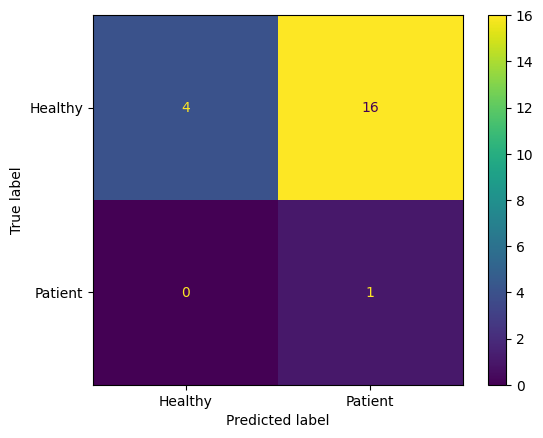

In [ ]:
display_confusionMatrix(my_draw_resnet34_true, my_draw_resnet34_pred)

#### ResNet50

In [ ]:
my_draw_resnet50_true, my_draw_resnet50_pred = predicts(model_resnet50, my_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.20      0.33        20
           1       0.06      1.00      0.11         1

    accuracy                           0.24        21
   macro avg       0.53      0.60      0.22        21
weighted avg       0.96      0.24      0.32        21



In [ ]:
my_draw_resnet50_acc = accuracy_score(my_draw_resnet50_true, my_draw_resnet50_pred)
my_draw_resnet50_precision = precision_score(my_draw_resnet50_true, my_draw_resnet50_pred)
my_draw_resnet50_acc, my_draw_resnet50_precision

(0.23809523809523808, 0.058823529411764705)

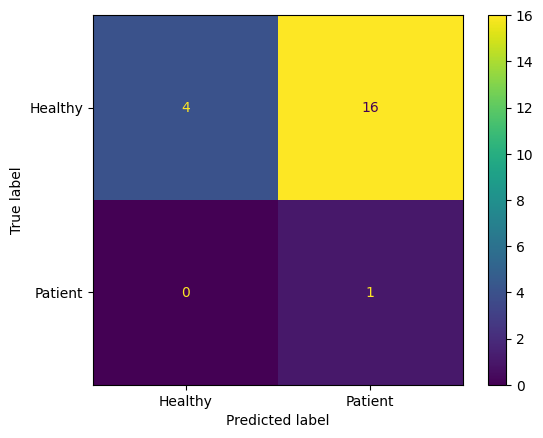

In [ ]:
display_confusionMatrix(my_draw_resnet50_true, my_draw_resnet50_pred)

#### DenseNet121

In [ ]:
my_draw_densenet121_true, my_draw_densenet121_pred = predicts(model_densenet121, my_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.05      1.00      0.09         1

    accuracy                           0.05        21
   macro avg       0.02      0.50      0.05        21
weighted avg       0.00      0.05      0.00        21



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
my_draw_densenet121_acc = accuracy_score(my_draw_densenet121_true, my_draw_densenet121_pred)
my_draw_densenet121_precision = precision_score(my_draw_densenet121_true, my_draw_densenet121_pred)
my_draw_densenet121_acc, my_draw_densenet121_precision

(0.047619047619047616, 0.047619047619047616)

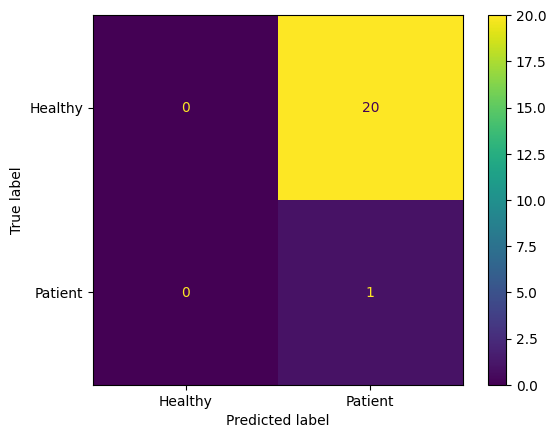

In [ ]:
display_confusionMatrix(my_draw_densenet121_true, my_draw_densenet121_pred)

#### DenseNet201

In [ ]:
my_draw_densenet201_true, my_draw_densenet201_pred = predicts(model_densenet201, my_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.20      0.33        20
           1       0.06      1.00      0.11         1

    accuracy                           0.24        21
   macro avg       0.53      0.60      0.22        21
weighted avg       0.96      0.24      0.32        21



In [ ]:
my_draw_densenet201_acc = accuracy_score(my_draw_densenet201_true, my_draw_densenet201_pred)
my_draw_densenet201_precision = precision_score(my_draw_densenet201_true, my_draw_densenet201_pred)
my_draw_densenet201_acc, my_draw_densenet201_precision

(0.23809523809523808, 0.058823529411764705)

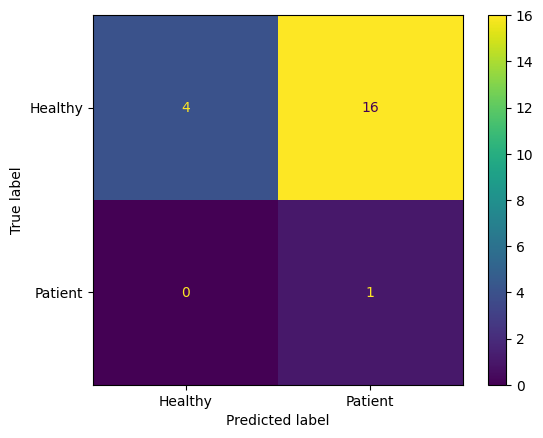

In [ ]:
display_confusionMatrix(my_draw_densenet201_true, my_draw_densenet201_pred)

#### VGG16

In [ ]:
my_draw_vgg16_true, my_draw_vgg16_pred = predicts(model_vgg16, my_draw_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.90      0.95        20
           1       0.33      1.00      0.50         1

    accuracy                           0.90        21
   macro avg       0.67      0.95      0.72        21
weighted avg       0.97      0.90      0.93        21



In [ ]:
my_draw_vgg16_acc = accuracy_score(my_draw_vgg16_true, my_draw_vgg16_pred)
my_draw_vgg16_precision = precision_score(my_draw_vgg16_true, my_draw_vgg16_pred)
my_draw_vgg16_acc, my_draw_vgg16_precision

(0.9047619047619048, 0.3333333333333333)

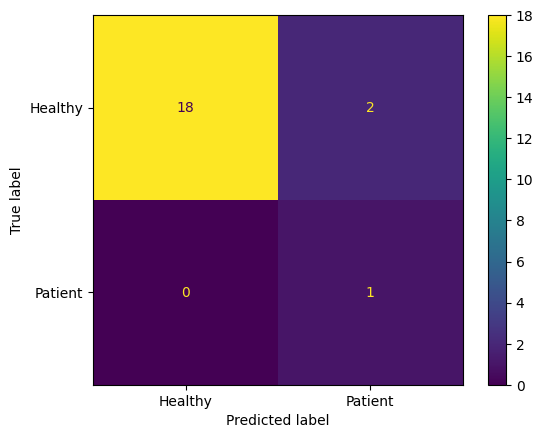

In [ ]:
display_confusionMatrix(my_draw_vgg16_true, my_draw_vgg16_pred)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.90      0.95        20
           1       0.33      1.00      0.50         1

    accuracy                           0.90        21
   macro avg       0.67      0.95      0.72        21
weighted avg       0.97      0.90      0.93        21



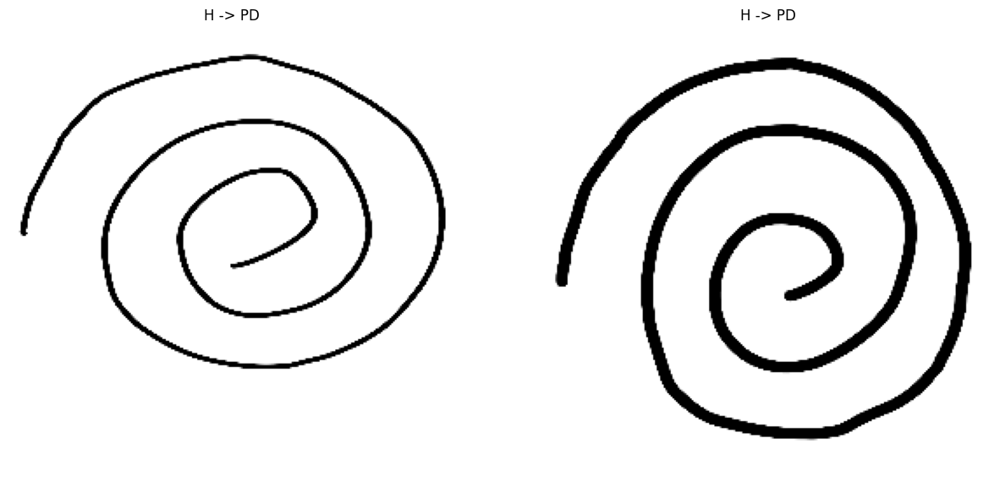

In [ ]:
a,b = display_wrong_output(model_vgg16, my_draw_loader)

### Degrade

#### ResNet18

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.75      0.86        20
           1       0.17      1.00      0.29         1

    accuracy                           0.76        21
   macro avg       0.58      0.88      0.57        21
weighted avg       0.96      0.76      0.83        21



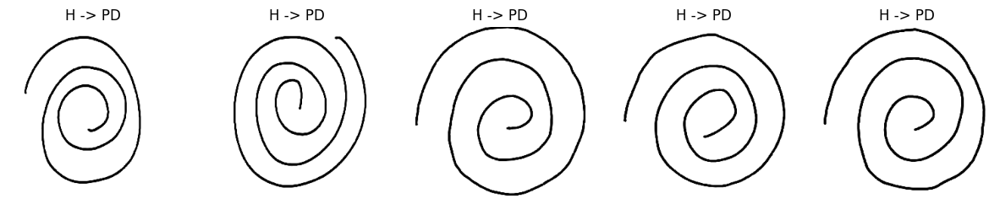

In [ ]:
my_degrade_resnet18_true, my_degrade_resnet18_pred = display_wrong_output(model_resnet18, my_degrade_loader)

In [ ]:
my_degrade_resnet18_acc = accuracy_score(my_degrade_resnet18_true, my_degrade_resnet18_pred)
my_degrade_resnet18_precision = precision_score(my_degrade_resnet18_true, my_degrade_resnet18_pred)
my_degrade_resnet18_acc, my_degrade_resnet18_precision

(0.7619047619047619, 0.16666666666666666)

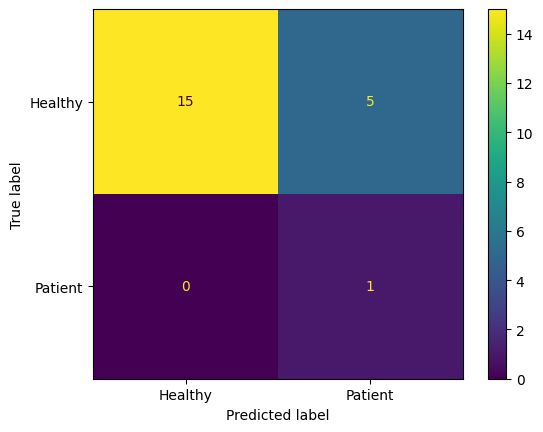

In [ ]:
display_confusionMatrix(my_degrade_resnet18_true, my_degrade_resnet18_pred)

#### ResNet34

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.50      0.67        20
           1       0.09      1.00      0.17         1

    accuracy                           0.52        21
   macro avg       0.55      0.75      0.42        21
weighted avg       0.96      0.52      0.64        21



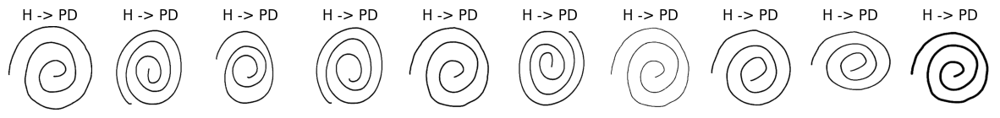

In [ ]:
my_degrade_resnet34_true, my_degrade_resnet34_pred = display_wrong_output(model_resnet34, my_degrade_loader)

In [ ]:
my_degrade_resnet34_acc = accuracy_score(my_degrade_resnet34_true, my_degrade_resnet34_pred)
my_degrade_resnet34_precision = precision_score(my_degrade_resnet34_true, my_degrade_resnet34_pred)
my_degrade_resnet34_acc, my_degrade_resnet34_precision

(0.5238095238095238, 0.09090909090909091)

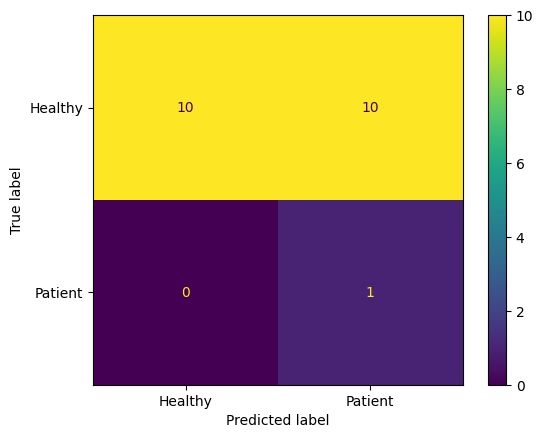

In [ ]:
display_confusionMatrix(my_degrade_resnet34_true, my_degrade_resnet34_pred)

#### ResNet50

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.55      0.71        20
           1       0.10      1.00      0.18         1

    accuracy                           0.57        21
   macro avg       0.55      0.78      0.45        21
weighted avg       0.96      0.57      0.68        21



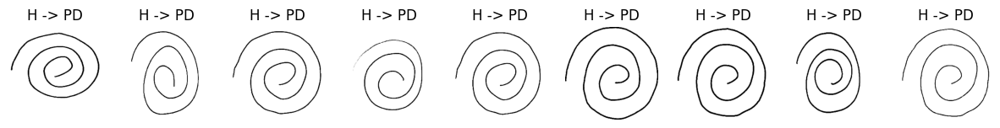

In [ ]:
my_degrade_resnet50_true, my_degrade_resnet50_pred = display_wrong_output(model_resnet50, my_degrade_loader)

In [ ]:
my_degrade_resnet50_acc = accuracy_score(my_degrade_resnet50_true, my_degrade_resnet50_pred)
my_degrade_resnet50_precision = precision_score(my_degrade_resnet50_true, my_degrade_resnet50_pred)
my_degrade_resnet50_acc, my_degrade_resnet50_precision

(0.5714285714285714, 0.1)

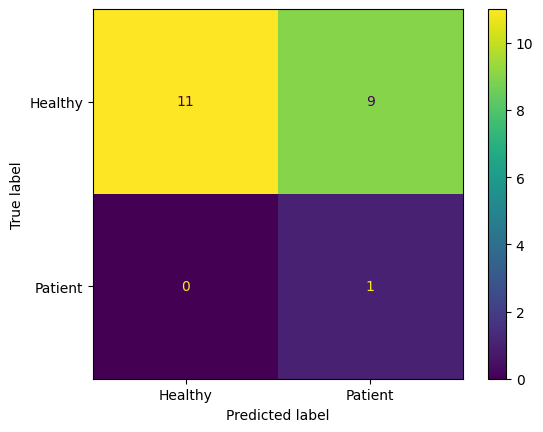

In [ ]:
display_confusionMatrix(my_degrade_resnet50_true, my_degrade_resnet50_pred)

#### DenseNet121

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.10      0.18        20
           1       0.05      1.00      0.10         1

    accuracy                           0.14        21
   macro avg       0.53      0.55      0.14        21
weighted avg       0.95      0.14      0.18        21



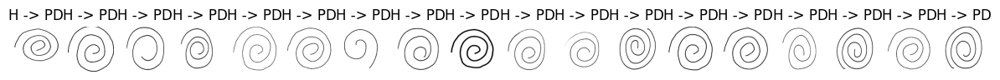

In [ ]:
my_degrade_densenet121_true, my_degrade_densenet121_pred = display_wrong_output(model_densenet121, my_degrade_loader)

In [ ]:
my_degrade_densenet121_acc = accuracy_score(my_degrade_densenet121_true, my_degrade_densenet121_pred)
my_degrade_densenet121_precision = precision_score(my_degrade_densenet121_true, my_degrade_densenet121_pred)
my_degrade_densenet121_acc, my_degrade_densenet121_precision

(0.14285714285714285, 0.05263157894736842)

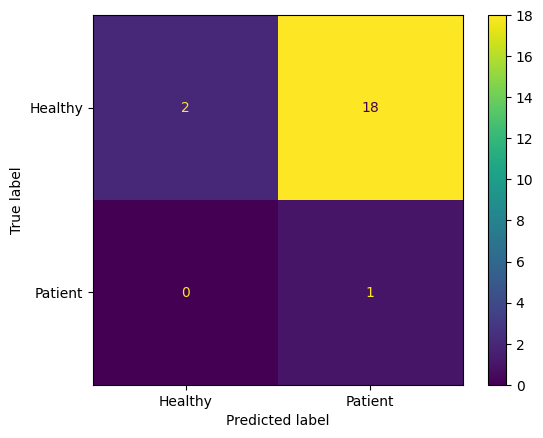

In [ ]:
display_confusionMatrix(my_degrade_densenet121_true, my_degrade_densenet121_pred)

#### DenseNet201

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      0.15      0.26        20
           1       0.06      1.00      0.11         1

    accuracy                           0.19        21
   macro avg       0.53      0.57      0.18        21
weighted avg       0.96      0.19      0.25        21



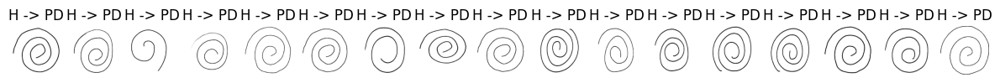

In [ ]:
my_degrade_densenet201_true, my_degrade_densenet201_pred = display_wrong_output(model_densenet201, my_degrade_loader)

In [ ]:
my_degrade_densenet201_acc = accuracy_score(my_degrade_densenet201_true, my_degrade_densenet201_pred)
my_degrade_densenet201_precision = precision_score(my_degrade_densenet201_true, my_degrade_densenet201_pred)
my_degrade_densenet201_acc, my_degrade_densenet201_precision

(0.19047619047619047, 0.05555555555555555)

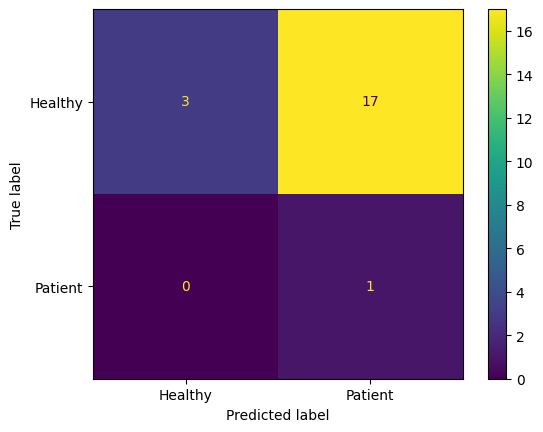

In [ ]:
display_confusionMatrix(my_degrade_densenet201_true, my_degrade_densenet201_pred)

#### VGG16

In [ ]:
my_degrade_vgg16_true, my_degrade_vgg16_pred = display_wrong_output(model_vgg16, my_degrade_loader)

True


  0%|          | 0/1 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00         1

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21



<Figure size 1500x900 with 0 Axes>

In [ ]:
my_degrade_vgg16_acc = accuracy_score(my_degrade_vgg16_true, my_degrade_vgg16_pred)
my_degrade_vgg16_precision = precision_score(my_degrade_vgg16_true, my_degrade_vgg16_pred)
my_degrade_vgg16_acc, my_degrade_vgg16_precision

(1.0, 1.0)

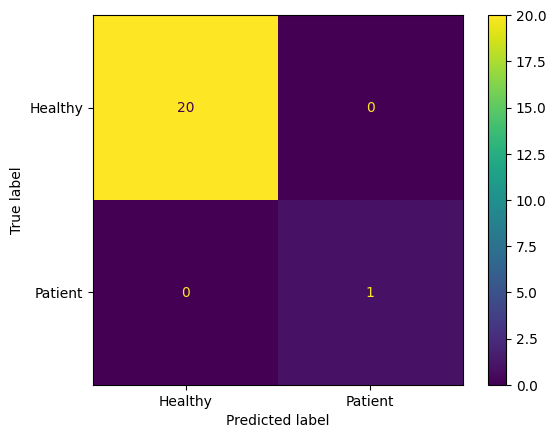

In [ ]:
display_confusionMatrix(my_degrade_vgg16_true, my_degrade_vgg16_pred)

### Compare

In [ ]:
summaries_my = {
    'ResNet18' : [my_draw_resnet18_acc, my_degrade_resnet18_acc],
    'ResNet34' : [my_draw_resnet34_acc, my_degrade_resnet34_acc],
    'ResNet50' : [my_draw_resnet50_acc, my_degrade_resnet50_acc],
    'DenseNet121' : [my_draw_densenet121_acc, my_degrade_densenet121_acc],
    'DenseNet201' : [my_draw_densenet201_acc, my_degrade_densenet201_acc],
    'VGG16' : [my_draw_vgg16_acc, my_degrade_vgg16_acc]
}

summaries_my

{'ResNet18': [0.23809523809523808, 0.7619047619047619],
 'ResNet34': [0.23809523809523808, 0.5238095238095238],
 'ResNet50': [0.23809523809523808, 0.5714285714285714],
 'DenseNet121': [0.047619047619047616, 0.14285714285714285],
 'DenseNet201': [0.23809523809523808, 0.19047619047619047],
 'VGG16': [0.9047619047619048, 1.0]}

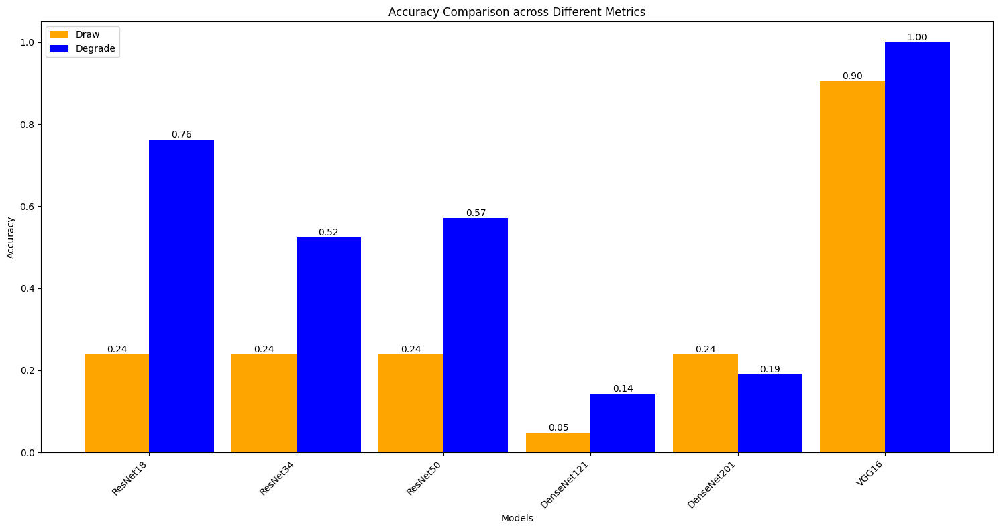

In [ ]:
plot_accuracy_comparison(summaries_my, ['Draw', 'Degrade'], ['orange', 'blue'])

## Conclustion

In [ ]:
conclusion = {
    'ResNet18' : [test_acc_resnet18, test_draw_resnet18_acc, test_degrade_resnet18_acc, my_draw_resnet18_acc, my_degrade_resnet18_acc],
    'ResNet34' : [test_acc_resnet34, test_draw_resnet34_acc, test_degrade_resnet34_acc, my_draw_resnet34_acc, my_degrade_resnet34_acc],
    'ResNet50' : [test_acc_resnet50, test_draw_resnet50_acc, test_degrade_resnet50_acc, my_draw_resnet50_acc, my_degrade_resnet50_acc],
    'DenseNet121' : [test_acc_densenet121, test_draw_densenet121_acc, test_degrade_densenet121_acc, my_draw_densenet121_acc, my_degrade_densenet121_acc],
    'DenseNet201' : [test_acc_densenet201, test_draw_densenet201_acc, test_degrade_densenet201_acc, my_draw_densenet201_acc, my_degrade_densenet201_acc],
    'VGG16' : [test_acc_vgg16, test_draw_vgg16_acc, test_degrade_vgg16_acc, my_draw_vgg16_acc, my_degrade_vgg16_acc]
}

conclusion

{'ResNet18': [1.0, 0.5, 0.55, 0.23809523809523808, 0.7619047619047619],
 'ResNet34': [1.0, 0.5, 0.55, 0.23809523809523808, 0.5238095238095238],
 'ResNet50': [1.0, 0.5, 0.55, 0.23809523809523808, 0.5714285714285714],
 'DenseNet121': [1.0, 0.5, 0.5, 0.047619047619047616, 0.14285714285714285],
 'DenseNet201': [1.0, 0.5, 0.7, 0.23809523809523808, 0.19047619047619047],
 'VGG16': [1.0, 0.45, 0.65, 0.9047619047619048, 1.0]}

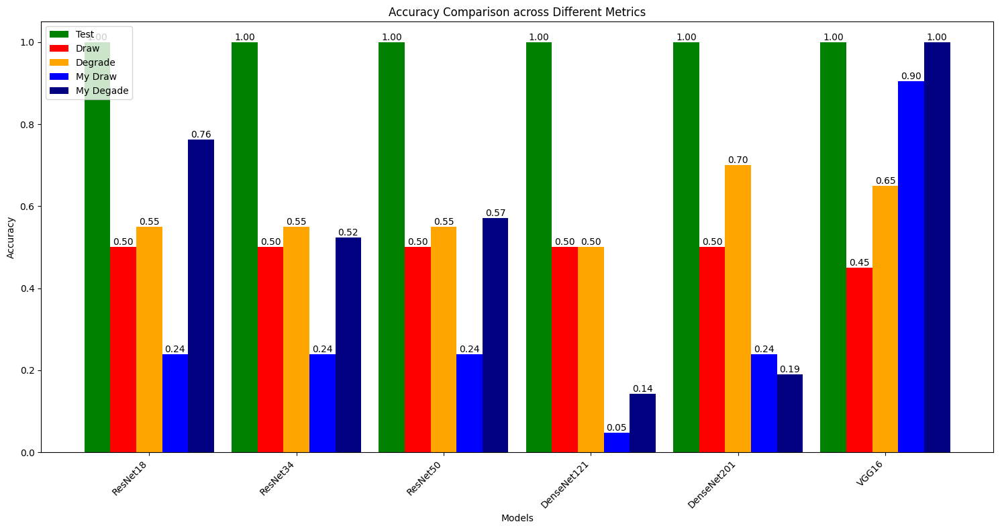

In [ ]:
plot_accuracy_comparison(conclusion, ['Test', 'Draw', 'Degrade', 'My Draw', 'My Degade'], ['green', 'red', 'orange', 'blue', 'navy'])

# Plot

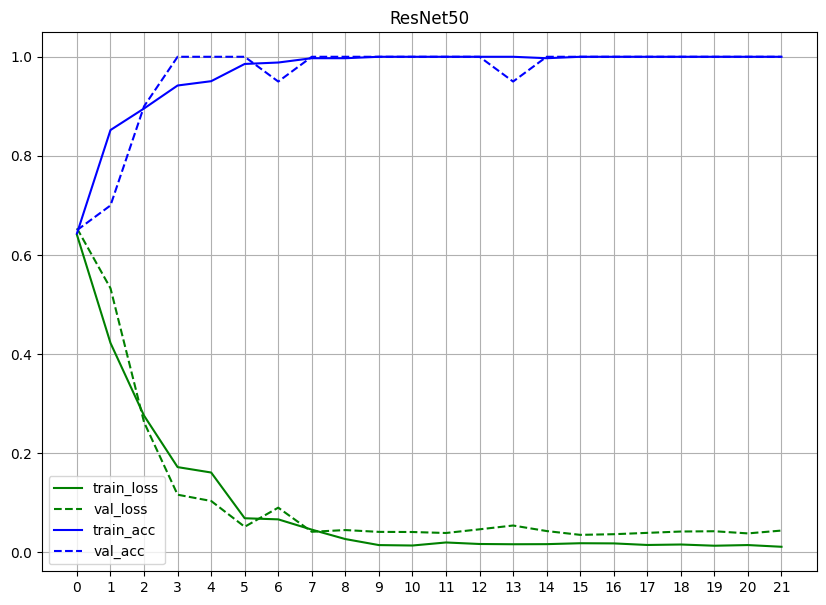

In [4]:
history = pd.read_csv('/content/drive/MyDrive/Coding/AI/NSC/Spiral/classify parkinson/model_info/ver4/full_train_history/resnet50.csv')
plot_history(history, 'ResNet50')

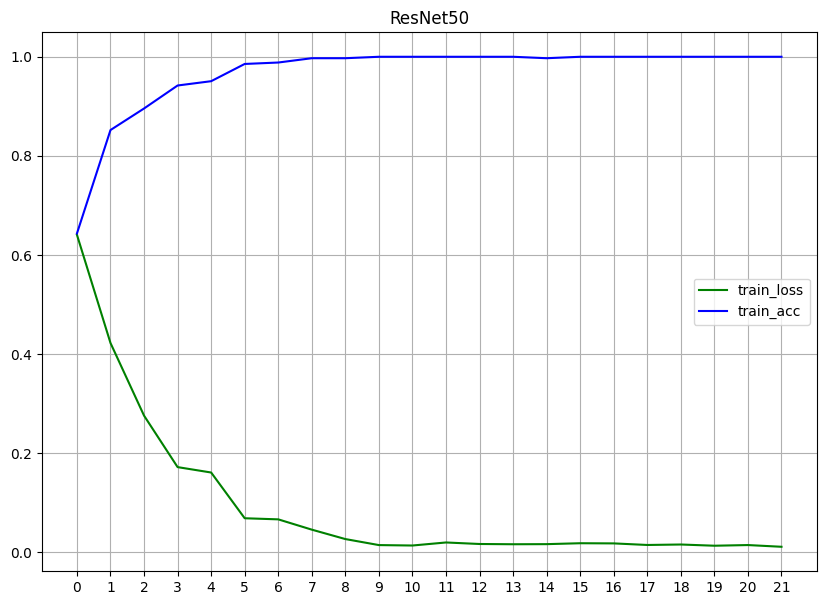

In [11]:
plt.figure(figsize=(10,7))

plt.plot(history.index , history['train_loss'],label='train_loss',color='green')

plt.plot(history.index , history['train_acc'],label='train_acc',color='blue')

plt.legend(loc='center right')
plt.grid(True)
plt.title('ResNet50')

plt.xticks(ticks=range(len(history.index)), labels=history.index.astype(int))

plt.show()